# **0. Load Preliminary Functions**

# a. Import Libraries and Functions

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

import pickle
import itertools
import math

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# b. MNIST Data Loader

In [2]:
tensor_transform = transforms.Compose([
    transforms.ToTensor(),
		transforms.Normalize(mean=(0.5, ), std=(0.5, ))
])

batch_size = 128
train_dataset = datasets.MNIST(root = "./data",
									train = True,
									download = True,
									transform = tensor_transform)
test_dataset = datasets.MNIST(root = "./data",
									train = False,
									download = True,
									transform = tensor_transform)

train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
							   batch_size = batch_size,
								 shuffle = True)
test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
							   batch_size = batch_size,
								 shuffle = False)


In [10]:
train_dataset[0][1]

5

# **1. Unconditional GAN**


# a. Training Function for Discriminator

In [27]:
criterion = nn.BCELoss()

def train_discriminator(discriminator, d_optimizer, images, real_labels, fake_images, fake_labels, with_condition, cls_labels):
    discriminator.zero_grad()
    if with_condition:
      outputs = discriminator(images, cls_labels)
    else:
      outputs = discriminator(images)
    real_loss = criterion(outputs, real_labels.view(-1, 1))
    real_score = outputs

    if with_condition:
      outputs = discriminator(fake_images, cls_labels)
    else:
      outputs = discriminator(fake_images)
    fake_loss = criterion(outputs, fake_labels.view(-1, 1))
    fake_score = outputs

    d_loss = real_loss + fake_loss
    d_loss.backward()
    d_optimizer.step()
    return d_loss, real_score, fake_score, fake_loss

# b. Training Function for Generator

In [4]:
def train_generator(generator, g_optimizer, discriminator_outputs, real_labels, with_condition):
    generator.zero_grad()
    g_loss = criterion(discriminator_outputs, real_labels.view(-1, 1))
    g_loss_fake = criterion(discriminator_outputs, 1 - real_labels.view(-1, 1))
    g_loss.backward()
    g_optimizer.step()
    return g_loss, g_loss_fake

# c. Monitors for Images and Losses


In [14]:
def monitor_images(generator, test_noise, with_condition):
    num_test_samples = test_noise.shape[0]
    size_figure_grid = int(math.sqrt(num_test_samples))
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(6, 6))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i,j].get_xaxis().set_visible(False)
        ax[i,j].get_yaxis().set_visible(False)

    if with_condition:
      cls_labels = torch.randint(0, 10, (num_test_samples,)).to(device)
      test_images = generator(test_noise, label = cls_labels)
    else:
      test_images = generator(test_noise)

    for k in range(num_test_samples):
        i = k//4
        j = k%4
        ax[i,j].cla()
        ax[i,j].imshow(test_images[k,:].data.cpu().numpy().reshape(28, 28), cmap='Greys')
        if with_condition:
            ax[i, j].set_title(f'Class: {cls_labels[k].item()}', fontsize=10)
    plt.show()


def monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake):
    def moving_average(x, win=100):
        return np.convolve(x, np.ones(win), 'same') / np.convolve(np.ones_like(x), np.ones(win), 'same')

    plt.figure(figsize=(10, 5))
    iters = np.arange(len(d_losses))
    epochs = iters * batch_size / 60000
    plt.plot(epochs, moving_average(d_losses), label='d_loss')
    plt.plot(epochs, moving_average(g_losses), label='g_loss')
    plt.plot(epochs, moving_average(d_losses_fake), label='d_loss_fake')
    plt.plot(epochs, moving_average(g_losses_fake), label='g_loss_fake')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()


# c. Model for Discriminator

In [28]:
class Discriminator(nn.Module):
    def __init__(self, channels = [512, 256, 128], with_condition=False):
        super().__init__()
        self.with_condition = with_condition
        self.model = []
        if with_condition:
            prev_c = 784 + 10
        else:
            prev_c = 784
        for i in channels:
            self.model.append(nn.Linear(prev_c, i))
            self.model.append(nn.LeakyReLU(0.2))
            self.model.append(nn.Dropout(0.2))  # 添加 Dropout
            prev_c = i
        self.model.append(nn.Linear(prev_c, 1))
        self.model.append(nn.Sigmoid())
        self.model = nn.Sequential(*self.model)
        print(self.model)
        ##################
        ### Problem 1: Implement Discriminator
        ##################

    def forward(self, x, label=None):
        x = x.view(x.size(0), 784)
        if self.with_condition:
            assert label is not None
            if label.dim() == 1:
                label_one_hot = nn.functional.one_hot(label, 10).to(x.dtype)
            else:
                label_one_hot = label
            x = torch.cat((x, label_one_hot), dim=1)  
        out = self.model(x)
        out = out.view(out.size(0), -1)
        return out

# e. Model for Generator


In [29]:
class Generator(nn.Module):
    def __init__(self, dim_z=100, channels = [128, 256, 512], with_condition=False):
        super().__init__()
        self.dim_z = dim_z
        self.with_condition = with_condition
        self.model = []
        if with_condition:
            prev = self.dim_z + 10
        else:
            prev = self.dim_z
        for i in channels:
            self.model.append(nn.Linear(prev, i))
            self.model.append(nn.LeakyReLU(0.2))
            prev = i
        self.model.append(nn.Linear(prev, 784))
        self.model.append(nn.Tanh())
        self.model = nn.Sequential(*self.model)
        print(self.model)
    def forward(self, x, label=None):
        x = x.view(x.size(0), self.dim_z)

        if self.with_condition:
            assert label is not None
            if label.dim() == 1:
                label = nn.functional.one_hot(label, 10).to(x.dtype)
            x = torch.concat((x, label), dim=1)
        out = self.model(x)
        return out

# d. Training

In [30]:
num_batches = len(train_loader)

def train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise,
                    num_epochs, d_freq, with_condition):
  d_losses = []
  g_losses = []
  d_losses_fake = []
  g_losses_fake = []
  for epoch in range(num_epochs):
      for n, (images, cls_labels) in enumerate(train_loader):
          images = Variable(images.to(device))
          real_labels = Variable(torch.ones(images.size(0)).to(device))
          cls_labels = cls_labels.to(device)

          # Sample from generator
          noise = Variable(torch.randn(images.size(0), dim_z).to(device))
          fake_images = generator(noise, label=cls_labels if with_condition else None)
          fake_labels = Variable(torch.zeros(images.size(0)).to(device))

          # Train the discriminator
          d_loss, real_score, fake_score, d_loss_fake = train_discriminator(discriminator, d_optimizer, images, real_labels, fake_images, fake_labels, with_condition, cls_labels=cls_labels)

          if n % d_freq == 0:
            # Sample again from the generator and get output from discriminator
            noise = Variable(torch.randn(images.size(0), dim_z).to(device))
            fake_images = generator(noise, label=cls_labels if with_condition else None)
            outputs = discriminator(fake_images, label=cls_labels if with_condition else None)

            # Train the generator
            g_loss, g_loss_fake = train_generator(generator, g_optimizer, outputs, real_labels, with_condition)

          d_losses.append(d_loss.data.detach().cpu().numpy())
          g_losses.append(g_loss.data.detach().cpu().numpy())
          d_losses_fake.append(d_loss_fake.data.detach().cpu().numpy())
          g_losses_fake.append(g_loss_fake.data.detach().cpu().numpy())

          if (n+1) % 100 == 0:
              print('Epoch [%d/%d], Step[%d/%d], d_loss: %.4f, d_loss_fake: %.4f, g_loss: %.4f, g_loss_fake: %.4f, '
                    'D(x): %.2f, D(G(z)): %.2f'
                    %(epoch + 1, num_epochs, n+1, num_batches, d_loss.data, d_loss_fake.data, g_loss.data, g_loss_fake.data,
                      real_score.data.mean(), fake_score.data.mean()))

      monitor_images(generator, test_noise, with_condition=with_condition)
      monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)
  return d_losses, d_losses_fake, g_losses, g_losses_fake

Sequential(
  (0): Linear(in_features=784, out_features=512, bias=True)
  (1): LeakyReLU(negative_slope=0.2)
  (2): Dropout(p=0.2, inplace=False)
  (3): Linear(in_features=512, out_features=256, bias=True)
  (4): LeakyReLU(negative_slope=0.2)
  (5): Dropout(p=0.2, inplace=False)
  (6): Linear(in_features=256, out_features=128, bias=True)
  (7): LeakyReLU(negative_slope=0.2)
  (8): Dropout(p=0.2, inplace=False)
  (9): Linear(in_features=128, out_features=1, bias=True)
  (10): Sigmoid()
)
Sequential(
  (0): Linear(in_features=100, out_features=128, bias=True)
  (1): LeakyReLU(negative_slope=0.2)
  (2): Linear(in_features=128, out_features=256, bias=True)
  (3): LeakyReLU(negative_slope=0.2)
  (4): Linear(in_features=256, out_features=512, bias=True)
  (5): LeakyReLU(negative_slope=0.2)
  (6): Linear(in_features=512, out_features=784, bias=True)
  (7): Tanh()
)
Epoch [1/500], Step[100/469], d_loss: 0.6936, d_loss_fake: 0.6861, g_loss: 0.9139, g_loss_fake: 0.5249, D(x): 0.99, D(G(z)): 0.49

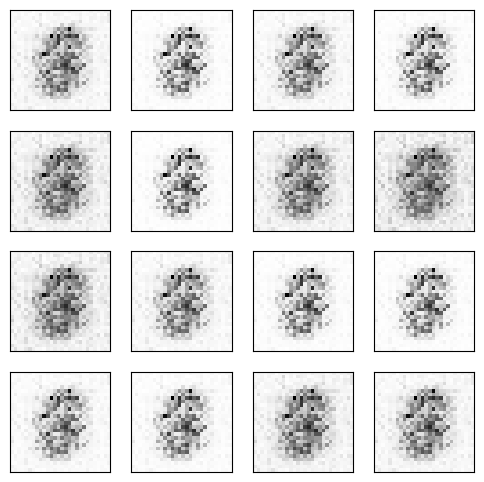

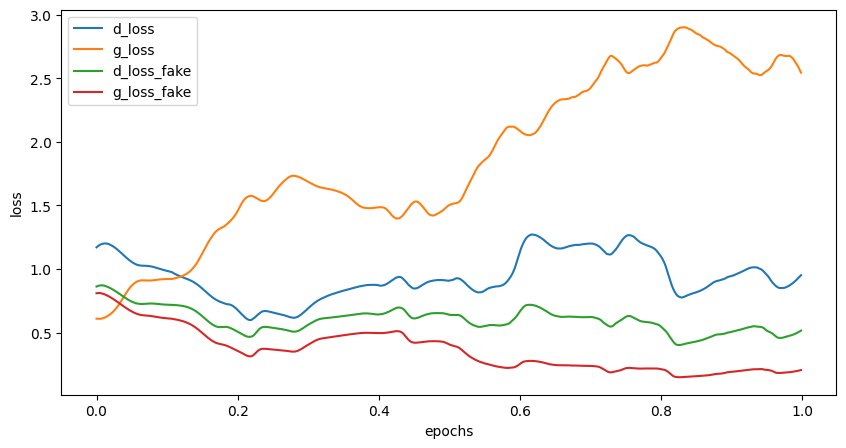

Epoch [2/500], Step[100/469], d_loss: 0.6739, d_loss_fake: 0.2848, g_loss: 2.1943, g_loss_fake: 0.1732, D(x): 0.78, D(G(z)): 0.23
Epoch [2/500], Step[200/469], d_loss: 1.9690, d_loss_fake: 1.1476, g_loss: 0.6476, g_loss_fake: 0.9140, D(x): 0.54, D(G(z)): 0.64
Epoch [2/500], Step[300/469], d_loss: 1.2264, d_loss_fake: 0.7260, g_loss: 0.9048, g_loss_fake: 0.6079, D(x): 0.63, D(G(z)): 0.50
Epoch [2/500], Step[400/469], d_loss: 0.4031, d_loss_fake: 0.2395, g_loss: 2.2931, g_loss_fake: 0.1646, D(x): 0.86, D(G(z)): 0.20


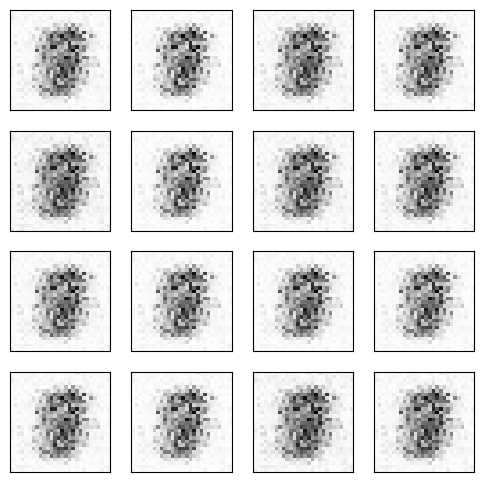

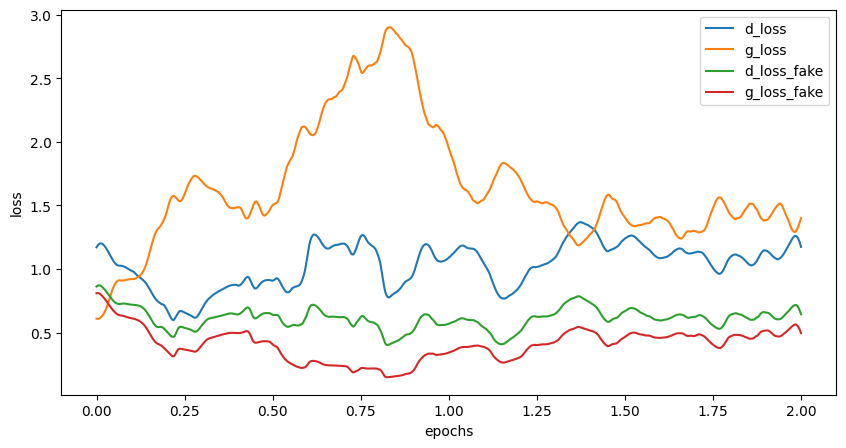

Epoch [3/500], Step[100/469], d_loss: 0.7517, d_loss_fake: 0.4364, g_loss: 1.6550, g_loss_fake: 0.2938, D(x): 0.77, D(G(z)): 0.33
Epoch [3/500], Step[200/469], d_loss: 1.0237, d_loss_fake: 0.5695, g_loss: 1.6253, g_loss_fake: 0.3643, D(x): 0.73, D(G(z)): 0.38
Epoch [3/500], Step[300/469], d_loss: 0.3525, d_loss_fake: 0.1728, g_loss: 3.5993, g_loss_fake: 0.0899, D(x): 0.87, D(G(z)): 0.13
Epoch [3/500], Step[400/469], d_loss: 1.5119, d_loss_fake: 1.0021, g_loss: 0.7548, g_loss_fake: 0.7814, D(x): 0.75, D(G(z)): 0.60


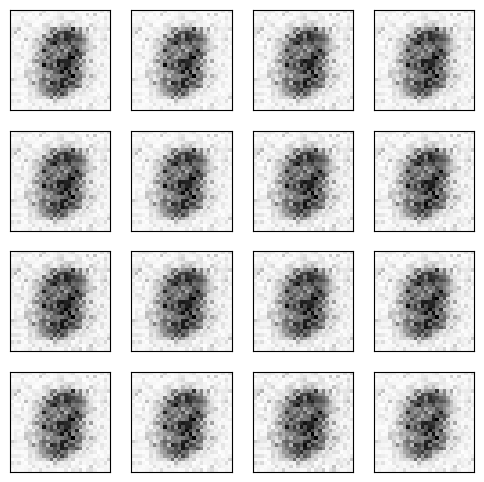

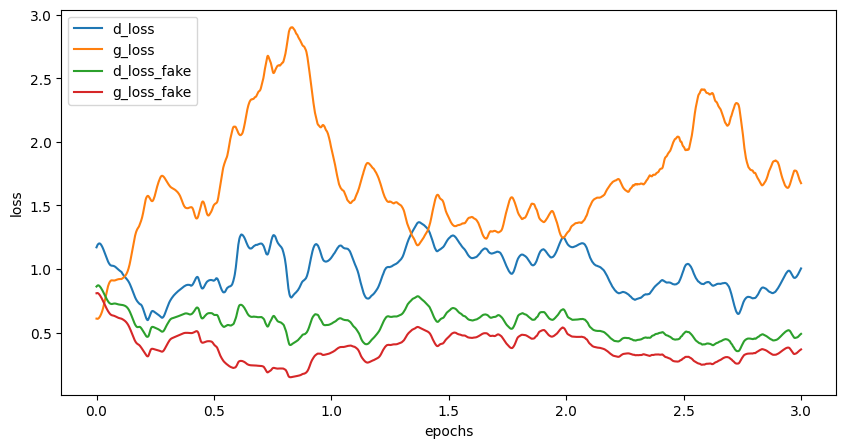

Epoch [4/500], Step[100/469], d_loss: 0.5417, d_loss_fake: 0.3000, g_loss: 2.6442, g_loss_fake: 0.2103, D(x): 0.84, D(G(z)): 0.22
Epoch [4/500], Step[200/469], d_loss: 0.2528, d_loss_fake: 0.1120, g_loss: 2.9310, g_loss_fake: 0.0879, D(x): 0.90, D(G(z)): 0.10
Epoch [4/500], Step[300/469], d_loss: 0.1583, d_loss_fake: 0.0419, g_loss: 3.9811, g_loss_fake: 0.0417, D(x): 0.93, D(G(z)): 0.04
Epoch [4/500], Step[400/469], d_loss: 0.4028, d_loss_fake: 0.1835, g_loss: 2.8488, g_loss_fake: 0.1168, D(x): 0.88, D(G(z)): 0.16


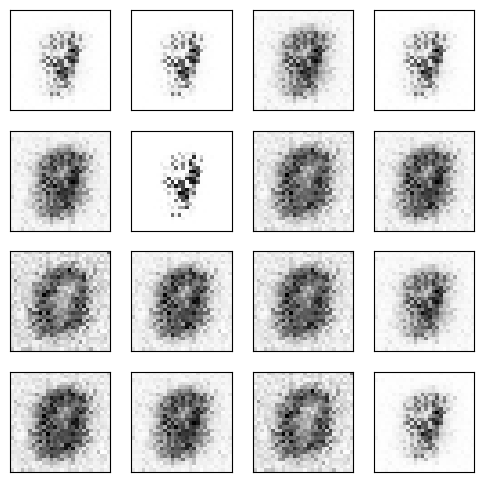

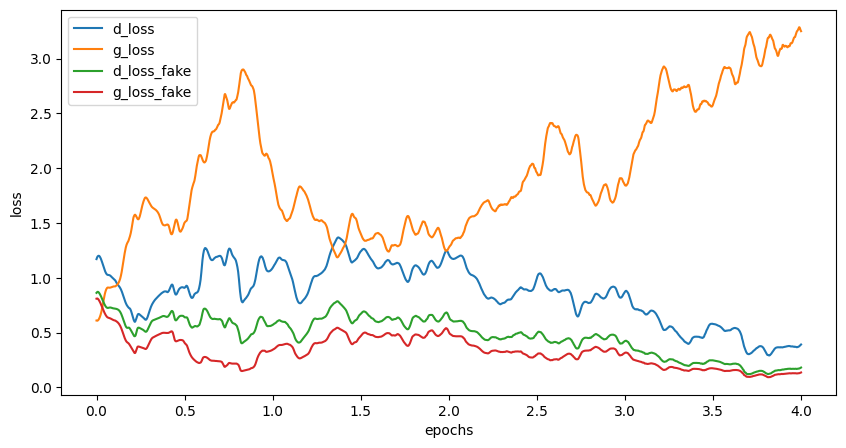

Epoch [5/500], Step[100/469], d_loss: 0.3697, d_loss_fake: 0.2224, g_loss: 2.8661, g_loss_fake: 0.1140, D(x): 0.92, D(G(z)): 0.17
Epoch [5/500], Step[200/469], d_loss: 0.2746, d_loss_fake: 0.0377, g_loss: 4.1648, g_loss_fake: 0.0292, D(x): 0.91, D(G(z)): 0.03
Epoch [5/500], Step[300/469], d_loss: 0.5948, d_loss_fake: 0.1774, g_loss: 4.0024, g_loss_fake: 0.0494, D(x): 0.80, D(G(z)): 0.12
Epoch [5/500], Step[400/469], d_loss: 0.3281, d_loss_fake: 0.2169, g_loss: 2.8991, g_loss_fake: 0.1941, D(x): 0.94, D(G(z)): 0.14


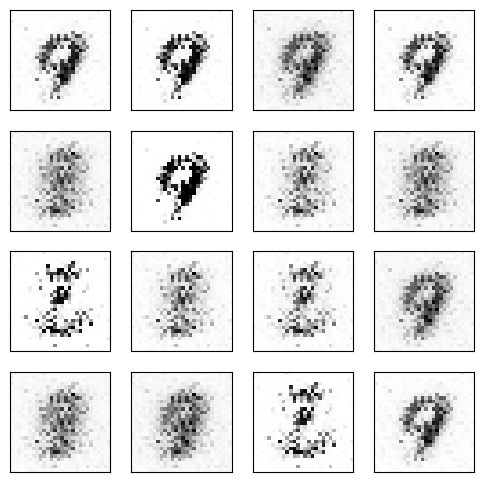

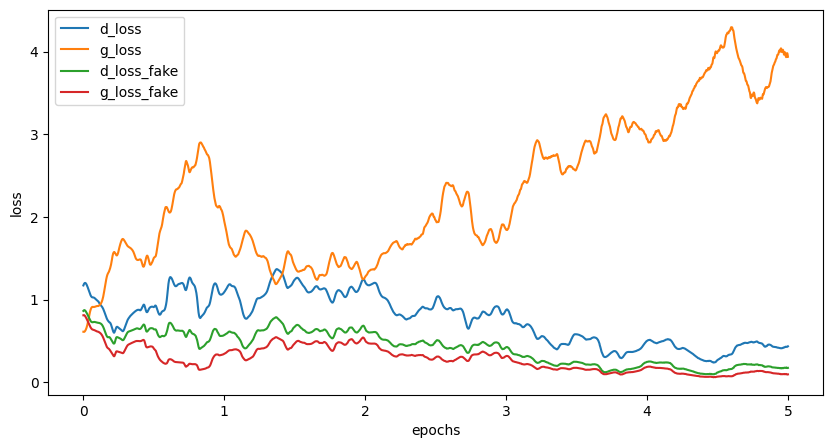

Epoch [6/500], Step[100/469], d_loss: 0.3633, d_loss_fake: 0.2418, g_loss: 2.7762, g_loss_fake: 0.1535, D(x): 0.93, D(G(z)): 0.19
Epoch [6/500], Step[200/469], d_loss: 0.4484, d_loss_fake: 0.0644, g_loss: 2.9360, g_loss_fake: 0.1153, D(x): 0.84, D(G(z)): 0.05
Epoch [6/500], Step[300/469], d_loss: 0.3961, d_loss_fake: 0.3598, g_loss: 3.3721, g_loss_fake: 0.1039, D(x): 0.97, D(G(z)): 0.21
Epoch [6/500], Step[400/469], d_loss: 0.1638, d_loss_fake: 0.0812, g_loss: 4.2430, g_loss_fake: 0.0385, D(x): 0.95, D(G(z)): 0.07


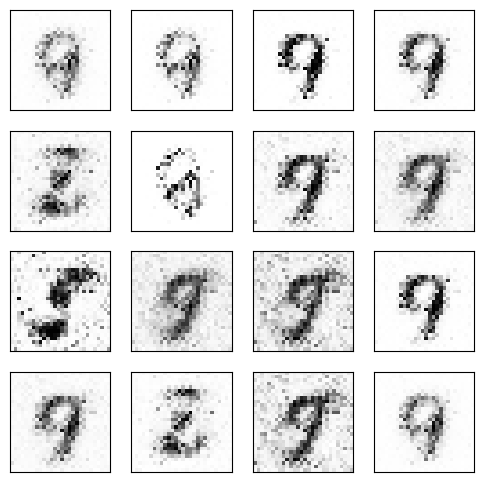

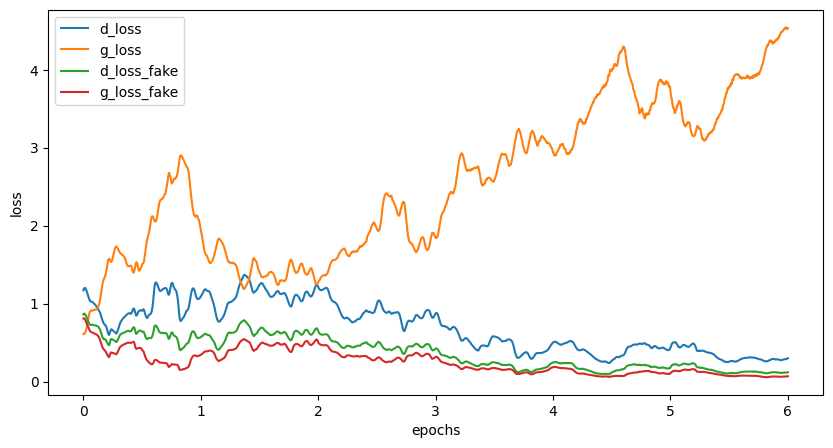

Epoch [7/500], Step[100/469], d_loss: 0.2470, d_loss_fake: 0.0646, g_loss: 5.6116, g_loss_fake: 0.0181, D(x): 0.91, D(G(z)): 0.05
Epoch [7/500], Step[200/469], d_loss: 0.2111, d_loss_fake: 0.0907, g_loss: 4.0722, g_loss_fake: 0.0394, D(x): 0.93, D(G(z)): 0.07
Epoch [7/500], Step[300/469], d_loss: 0.1773, d_loss_fake: 0.1047, g_loss: 3.6890, g_loss_fake: 0.0866, D(x): 0.96, D(G(z)): 0.08
Epoch [7/500], Step[400/469], d_loss: 0.3140, d_loss_fake: 0.1834, g_loss: 2.9939, g_loss_fake: 0.1362, D(x): 0.92, D(G(z)): 0.14


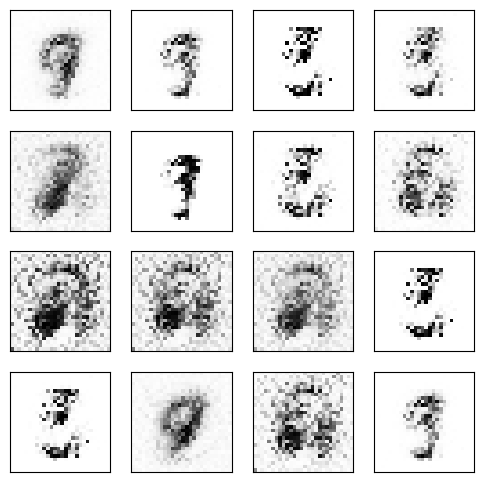

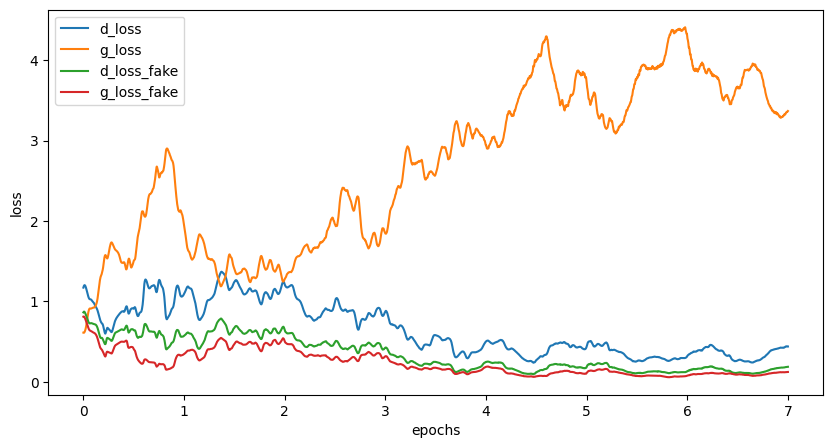

Epoch [8/500], Step[100/469], d_loss: 0.8465, d_loss_fake: 0.5412, g_loss: 2.5061, g_loss_fake: 0.1775, D(x): 0.85, D(G(z)): 0.32
Epoch [8/500], Step[200/469], d_loss: 0.4507, d_loss_fake: 0.2024, g_loss: 2.9848, g_loss_fake: 0.1590, D(x): 0.89, D(G(z)): 0.15
Epoch [8/500], Step[300/469], d_loss: 0.1532, d_loss_fake: 0.0743, g_loss: 3.3546, g_loss_fake: 0.0954, D(x): 0.94, D(G(z)): 0.06
Epoch [8/500], Step[400/469], d_loss: 0.4014, d_loss_fake: 0.1785, g_loss: 4.0423, g_loss_fake: 0.1036, D(x): 0.88, D(G(z)): 0.12


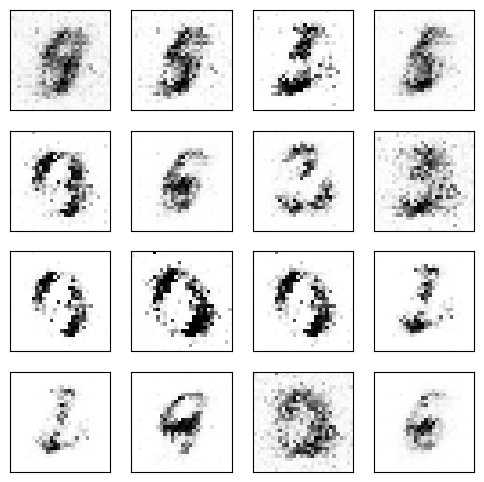

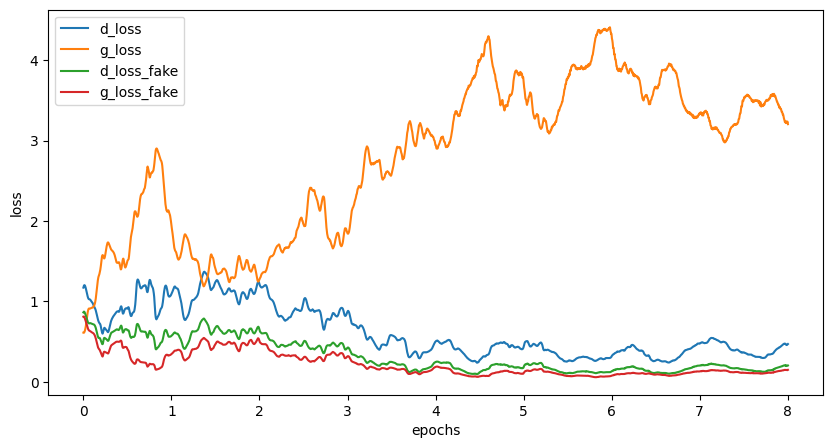

Epoch [9/500], Step[100/469], d_loss: 0.5035, d_loss_fake: 0.1986, g_loss: 2.9758, g_loss_fake: 0.1163, D(x): 0.83, D(G(z)): 0.14
Epoch [9/500], Step[200/469], d_loss: 0.5734, d_loss_fake: 0.2456, g_loss: 3.3051, g_loss_fake: 0.0979, D(x): 0.83, D(G(z)): 0.16
Epoch [9/500], Step[300/469], d_loss: 0.5572, d_loss_fake: 0.2774, g_loss: 3.1063, g_loss_fake: 0.1565, D(x): 0.86, D(G(z)): 0.15
Epoch [9/500], Step[400/469], d_loss: 0.3687, d_loss_fake: 0.2912, g_loss: 2.8874, g_loss_fake: 0.1135, D(x): 0.95, D(G(z)): 0.17


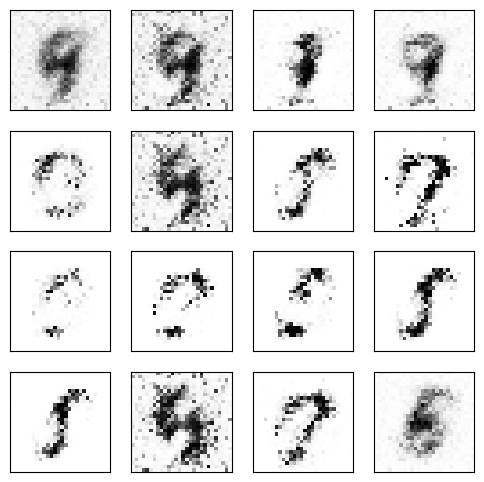

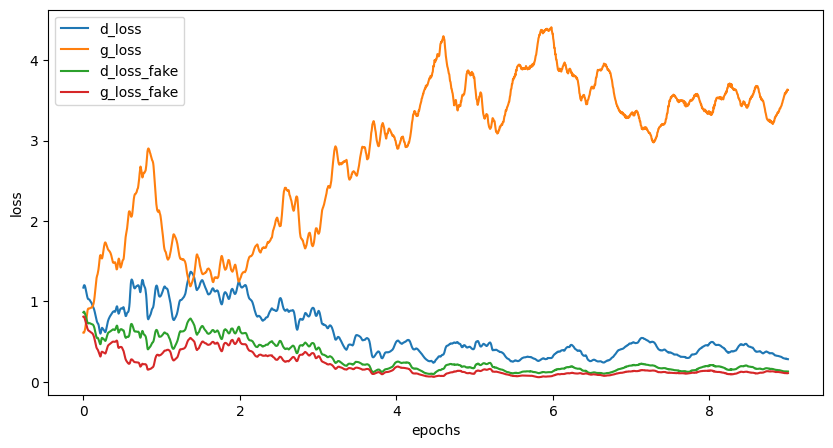

Epoch [10/500], Step[100/469], d_loss: 0.2751, d_loss_fake: 0.1313, g_loss: 3.2381, g_loss_fake: 0.1441, D(x): 0.93, D(G(z)): 0.11
Epoch [10/500], Step[200/469], d_loss: 0.1609, d_loss_fake: 0.1027, g_loss: 3.8999, g_loss_fake: 0.0745, D(x): 0.96, D(G(z)): 0.08
Epoch [10/500], Step[300/469], d_loss: 0.2919, d_loss_fake: 0.1282, g_loss: 3.6595, g_loss_fake: 0.0960, D(x): 0.92, D(G(z)): 0.10
Epoch [10/500], Step[400/469], d_loss: 0.4523, d_loss_fake: 0.1910, g_loss: 3.7033, g_loss_fake: 0.0607, D(x): 0.88, D(G(z)): 0.14


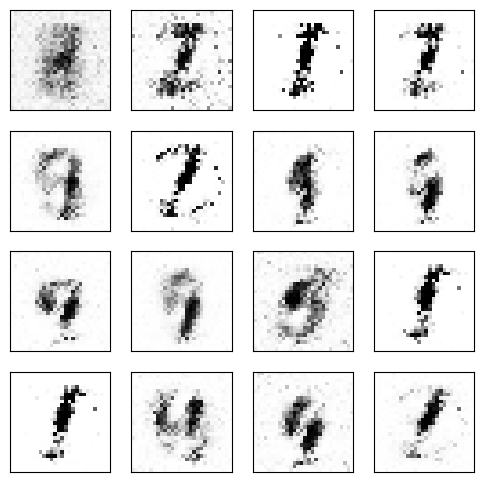

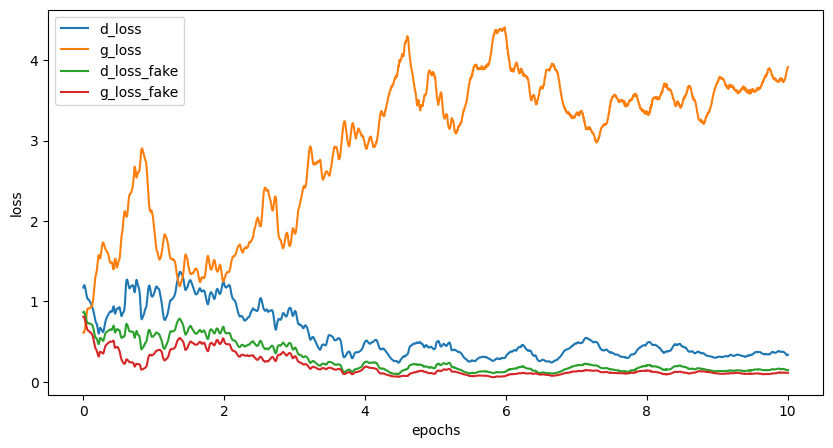

Epoch [11/500], Step[100/469], d_loss: 0.5072, d_loss_fake: 0.0706, g_loss: 2.8946, g_loss_fake: 0.1725, D(x): 0.80, D(G(z)): 0.06
Epoch [11/500], Step[200/469], d_loss: 0.2745, d_loss_fake: 0.1553, g_loss: 4.3065, g_loss_fake: 0.0339, D(x): 0.93, D(G(z)): 0.12
Epoch [11/500], Step[300/469], d_loss: 0.2720, d_loss_fake: 0.1102, g_loss: 3.5432, g_loss_fake: 0.0980, D(x): 0.90, D(G(z)): 0.09
Epoch [11/500], Step[400/469], d_loss: 0.4690, d_loss_fake: 0.0727, g_loss: 5.1808, g_loss_fake: 0.0154, D(x): 0.84, D(G(z)): 0.05


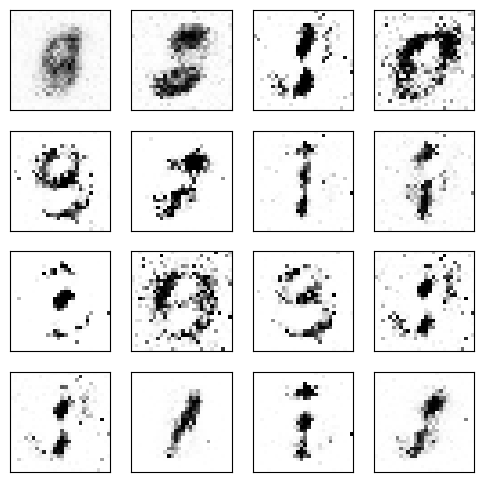

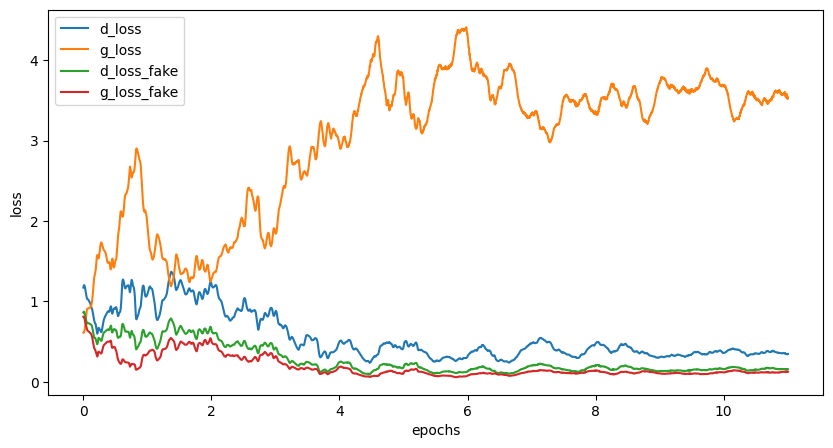

Epoch [12/500], Step[100/469], d_loss: 0.3391, d_loss_fake: 0.1086, g_loss: 3.4838, g_loss_fake: 0.0908, D(x): 0.89, D(G(z)): 0.08
Epoch [12/500], Step[200/469], d_loss: 0.5426, d_loss_fake: 0.0650, g_loss: 3.7187, g_loss_fake: 0.0911, D(x): 0.77, D(G(z)): 0.06
Epoch [12/500], Step[300/469], d_loss: 0.4285, d_loss_fake: 0.2493, g_loss: 4.7882, g_loss_fake: 0.0517, D(x): 0.90, D(G(z)): 0.18
Epoch [12/500], Step[400/469], d_loss: 0.5387, d_loss_fake: 0.2655, g_loss: 2.6829, g_loss_fake: 0.2031, D(x): 0.85, D(G(z)): 0.19


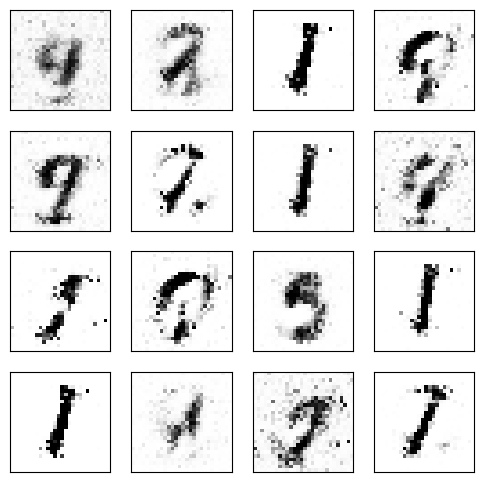

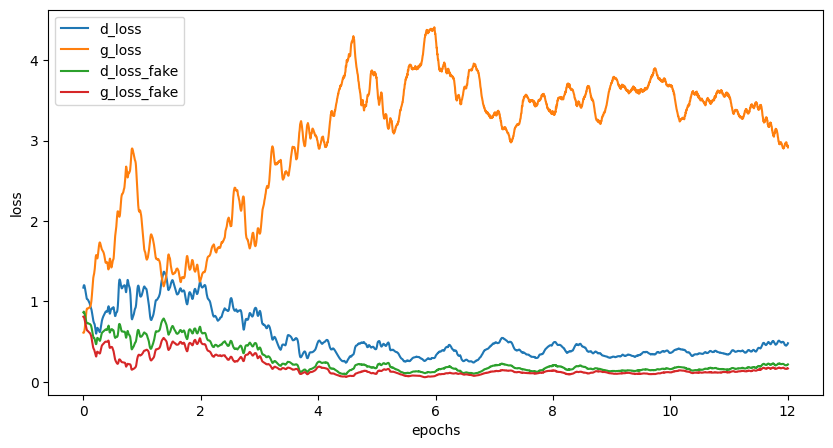

Epoch [13/500], Step[100/469], d_loss: 0.4571, d_loss_fake: 0.2940, g_loss: 2.2162, g_loss_fake: 0.2997, D(x): 0.89, D(G(z)): 0.19
Epoch [13/500], Step[200/469], d_loss: 0.3684, d_loss_fake: 0.1432, g_loss: 2.7364, g_loss_fake: 0.1620, D(x): 0.88, D(G(z)): 0.11
Epoch [13/500], Step[300/469], d_loss: 0.4059, d_loss_fake: 0.1336, g_loss: 3.8947, g_loss_fake: 0.0531, D(x): 0.86, D(G(z)): 0.10
Epoch [13/500], Step[400/469], d_loss: 0.6246, d_loss_fake: 0.1961, g_loss: 2.4175, g_loss_fake: 0.3333, D(x): 0.78, D(G(z)): 0.13


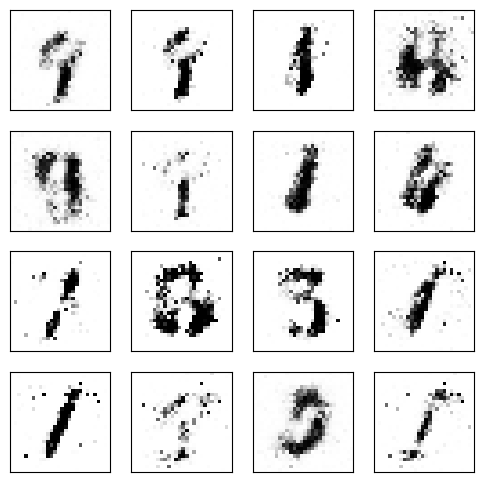

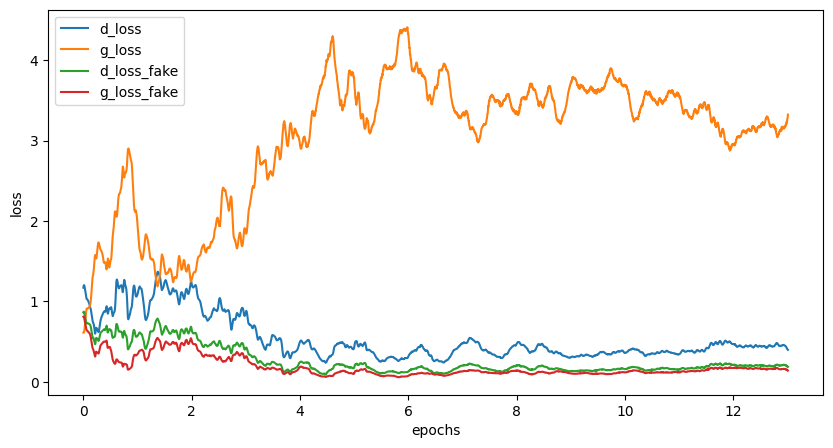

Epoch [14/500], Step[100/469], d_loss: 0.2900, d_loss_fake: 0.1388, g_loss: 3.5814, g_loss_fake: 0.1176, D(x): 0.90, D(G(z)): 0.10
Epoch [14/500], Step[200/469], d_loss: 0.3994, d_loss_fake: 0.1097, g_loss: 3.7793, g_loss_fake: 0.0723, D(x): 0.84, D(G(z)): 0.08
Epoch [14/500], Step[300/469], d_loss: 0.4780, d_loss_fake: 0.2482, g_loss: 2.3010, g_loss_fake: 0.2514, D(x): 0.88, D(G(z)): 0.18
Epoch [14/500], Step[400/469], d_loss: 0.4917, d_loss_fake: 0.2168, g_loss: 3.1736, g_loss_fake: 0.1772, D(x): 0.85, D(G(z)): 0.14


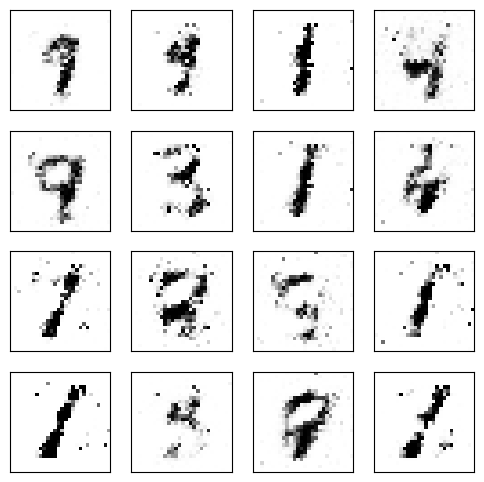

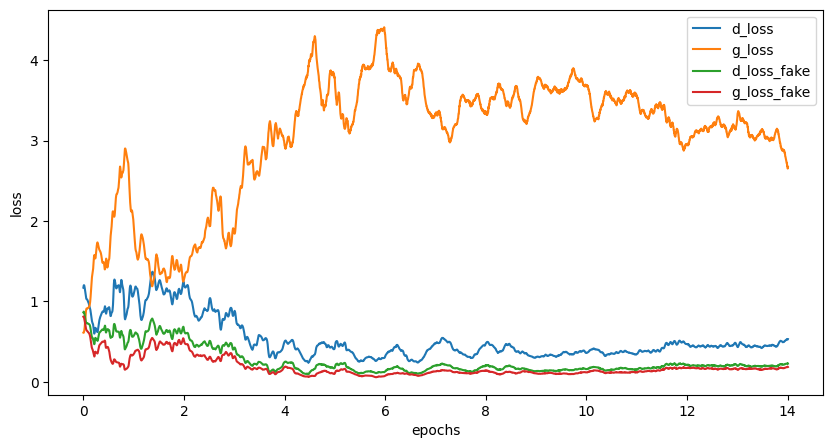

Epoch [15/500], Step[100/469], d_loss: 0.4369, d_loss_fake: 0.0993, g_loss: 3.0001, g_loss_fake: 0.1667, D(x): 0.83, D(G(z)): 0.09
Epoch [15/500], Step[200/469], d_loss: 0.3479, d_loss_fake: 0.0767, g_loss: 3.2065, g_loss_fake: 0.1336, D(x): 0.84, D(G(z)): 0.06
Epoch [15/500], Step[300/469], d_loss: 0.5819, d_loss_fake: 0.4978, g_loss: 2.3174, g_loss_fake: 0.2703, D(x): 0.94, D(G(z)): 0.29
Epoch [15/500], Step[400/469], d_loss: 0.3515, d_loss_fake: 0.1292, g_loss: 3.3584, g_loss_fake: 0.1255, D(x): 0.86, D(G(z)): 0.09


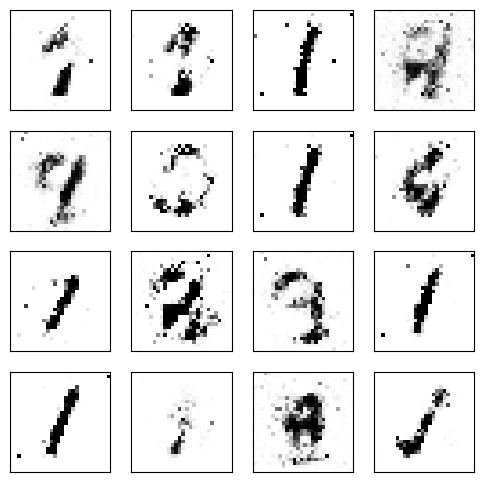

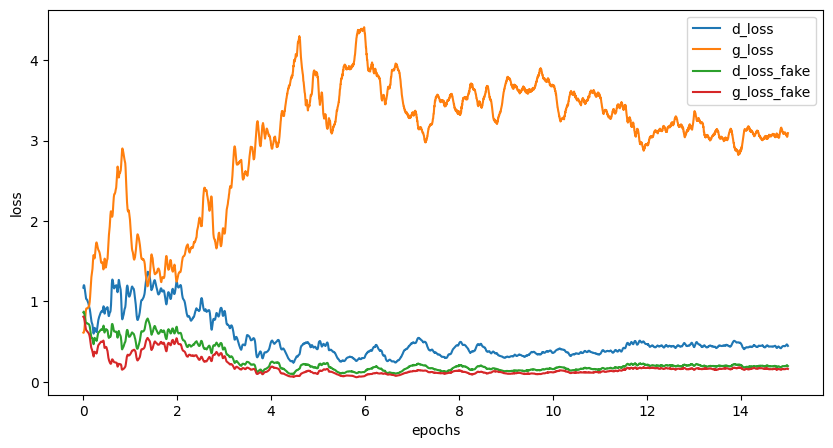

Epoch [16/500], Step[100/469], d_loss: 0.3123, d_loss_fake: 0.0823, g_loss: 3.5535, g_loss_fake: 0.1046, D(x): 0.88, D(G(z)): 0.06
Epoch [16/500], Step[200/469], d_loss: 0.6432, d_loss_fake: 0.3502, g_loss: 3.0137, g_loss_fake: 0.2658, D(x): 0.88, D(G(z)): 0.20
Epoch [16/500], Step[300/469], d_loss: 0.7296, d_loss_fake: 0.4372, g_loss: 2.5622, g_loss_fake: 0.1499, D(x): 0.83, D(G(z)): 0.28
Epoch [16/500], Step[400/469], d_loss: 0.2904, d_loss_fake: 0.0821, g_loss: 4.1213, g_loss_fake: 0.0401, D(x): 0.88, D(G(z)): 0.07


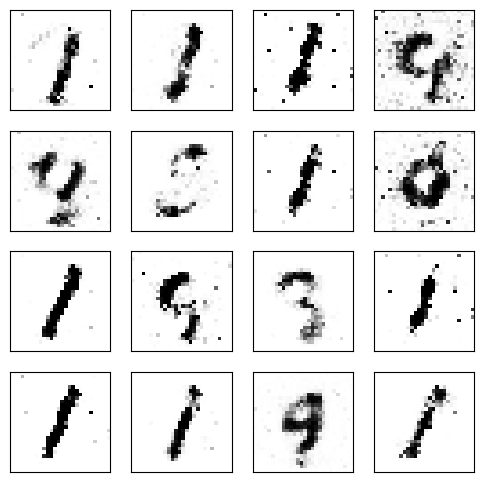

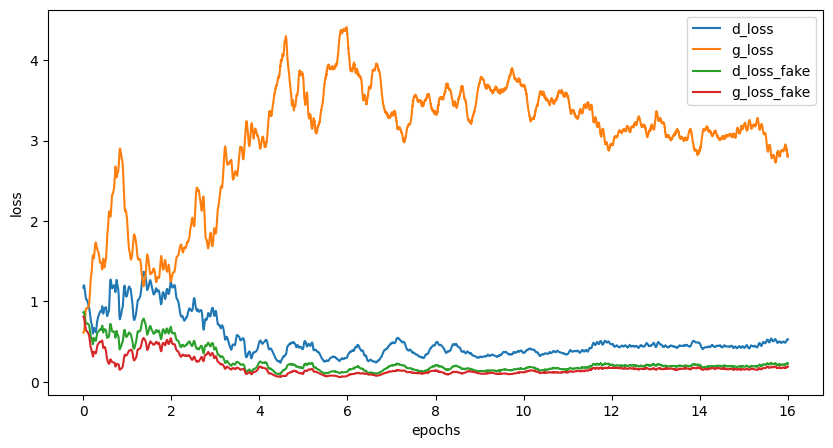

Epoch [17/500], Step[100/469], d_loss: 0.7135, d_loss_fake: 0.1482, g_loss: 3.0246, g_loss_fake: 0.1249, D(x): 0.74, D(G(z)): 0.12
Epoch [17/500], Step[200/469], d_loss: 0.6705, d_loss_fake: 0.2814, g_loss: 2.7269, g_loss_fake: 0.1959, D(x): 0.81, D(G(z)): 0.19
Epoch [17/500], Step[300/469], d_loss: 0.4788, d_loss_fake: 0.2017, g_loss: 2.3455, g_loss_fake: 0.2601, D(x): 0.84, D(G(z)): 0.15
Epoch [17/500], Step[400/469], d_loss: 0.4965, d_loss_fake: 0.2466, g_loss: 2.6738, g_loss_fake: 0.2453, D(x): 0.85, D(G(z)): 0.17


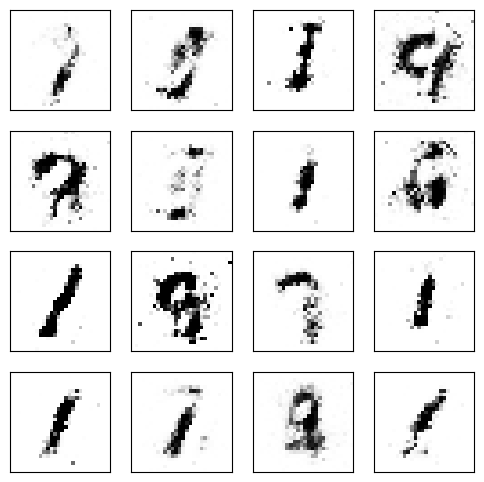

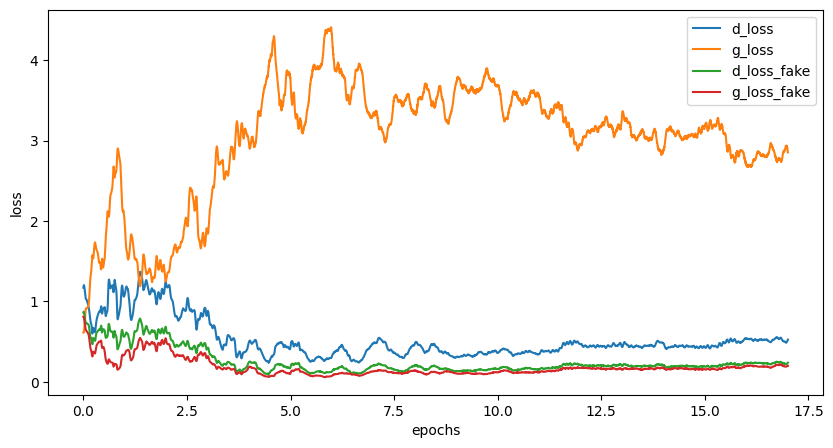

Epoch [18/500], Step[100/469], d_loss: 0.7344, d_loss_fake: 0.4031, g_loss: 2.2577, g_loss_fake: 0.2760, D(x): 0.82, D(G(z)): 0.24
Epoch [18/500], Step[200/469], d_loss: 0.7442, d_loss_fake: 0.3544, g_loss: 2.9557, g_loss_fake: 0.2049, D(x): 0.81, D(G(z)): 0.20
Epoch [18/500], Step[300/469], d_loss: 0.6043, d_loss_fake: 0.4338, g_loss: 2.0601, g_loss_fake: 0.3023, D(x): 0.89, D(G(z)): 0.28
Epoch [18/500], Step[400/469], d_loss: 0.8098, d_loss_fake: 0.3630, g_loss: 2.2982, g_loss_fake: 0.2387, D(x): 0.77, D(G(z)): 0.25


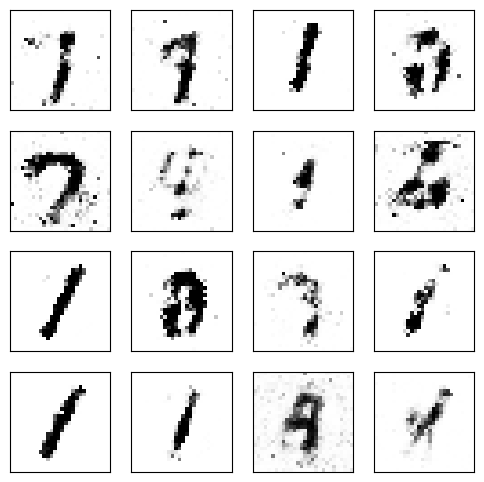

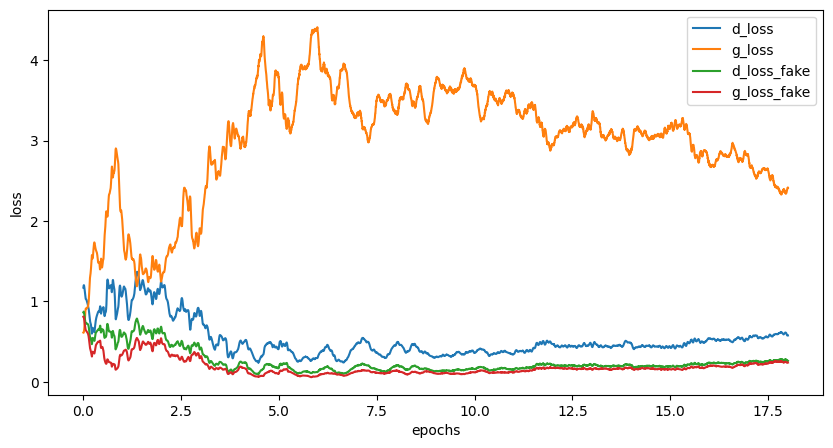

Epoch [19/500], Step[100/469], d_loss: 0.6373, d_loss_fake: 0.2380, g_loss: 2.7935, g_loss_fake: 0.1782, D(x): 0.81, D(G(z)): 0.17
Epoch [19/500], Step[200/469], d_loss: 0.5890, d_loss_fake: 0.2413, g_loss: 1.9263, g_loss_fake: 0.3606, D(x): 0.81, D(G(z)): 0.18
Epoch [19/500], Step[300/469], d_loss: 0.5271, d_loss_fake: 0.1833, g_loss: 2.7125, g_loss_fake: 0.1993, D(x): 0.80, D(G(z)): 0.14
Epoch [19/500], Step[400/469], d_loss: 0.5452, d_loss_fake: 0.2571, g_loss: 2.3674, g_loss_fake: 0.1906, D(x): 0.82, D(G(z)): 0.20


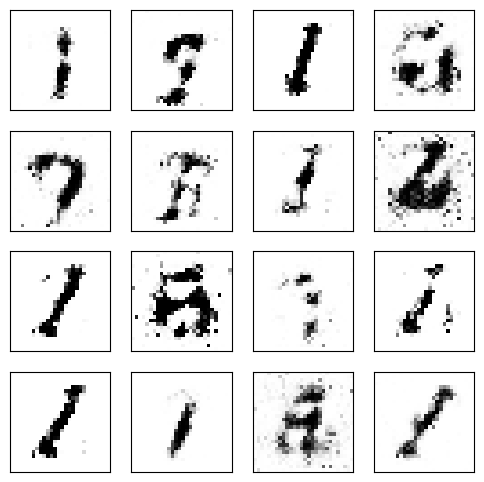

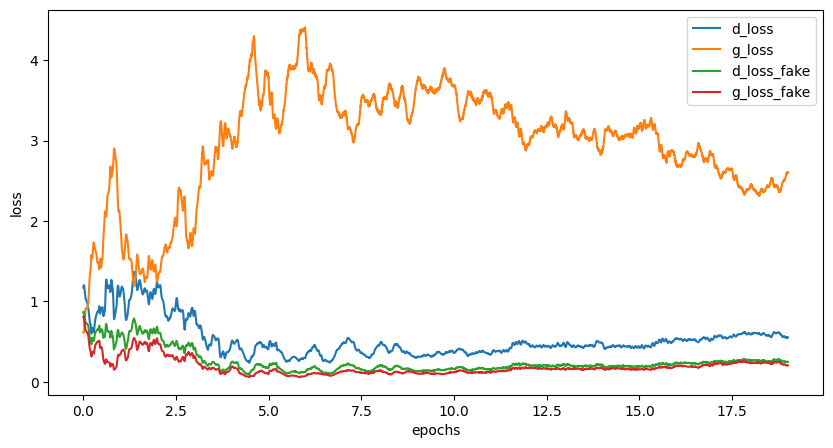

Epoch [20/500], Step[100/469], d_loss: 0.7480, d_loss_fake: 0.1328, g_loss: 2.5016, g_loss_fake: 0.2149, D(x): 0.71, D(G(z)): 0.10
Epoch [20/500], Step[200/469], d_loss: 0.5546, d_loss_fake: 0.2075, g_loss: 2.6323, g_loss_fake: 0.2372, D(x): 0.83, D(G(z)): 0.14
Epoch [20/500], Step[300/469], d_loss: 0.7185, d_loss_fake: 0.2799, g_loss: 3.1727, g_loss_fake: 0.1304, D(x): 0.75, D(G(z)): 0.19
Epoch [20/500], Step[400/469], d_loss: 0.6134, d_loss_fake: 0.4816, g_loss: 1.8448, g_loss_fake: 0.3631, D(x): 0.92, D(G(z)): 0.29


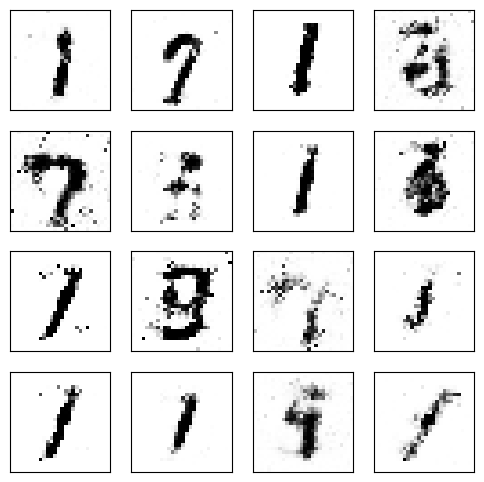

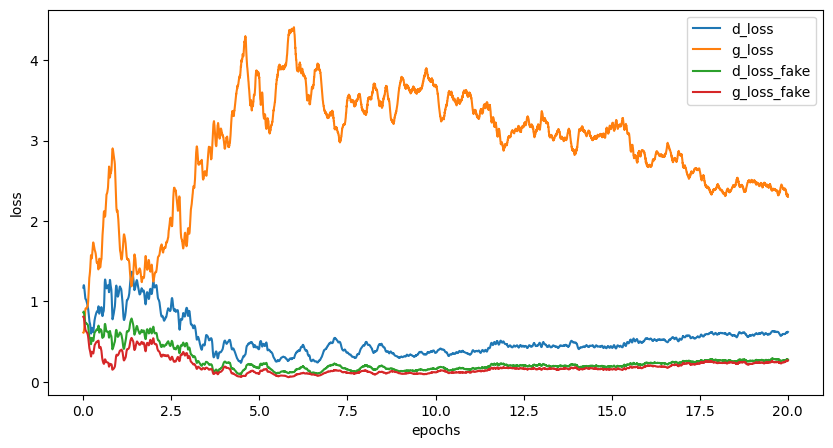

Epoch [21/500], Step[100/469], d_loss: 0.5400, d_loss_fake: 0.1872, g_loss: 2.9439, g_loss_fake: 0.1349, D(x): 0.80, D(G(z)): 0.15
Epoch [21/500], Step[200/469], d_loss: 0.6168, d_loss_fake: 0.3907, g_loss: 2.6052, g_loss_fake: 0.2561, D(x): 0.86, D(G(z)): 0.26
Epoch [21/500], Step[300/469], d_loss: 0.6587, d_loss_fake: 0.3906, g_loss: 2.2696, g_loss_fake: 0.2545, D(x): 0.83, D(G(z)): 0.20
Epoch [21/500], Step[400/469], d_loss: 0.6332, d_loss_fake: 0.3790, g_loss: 1.8447, g_loss_fake: 0.3503, D(x): 0.84, D(G(z)): 0.25


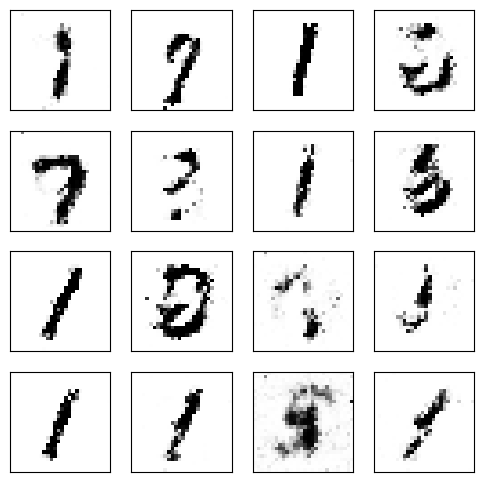

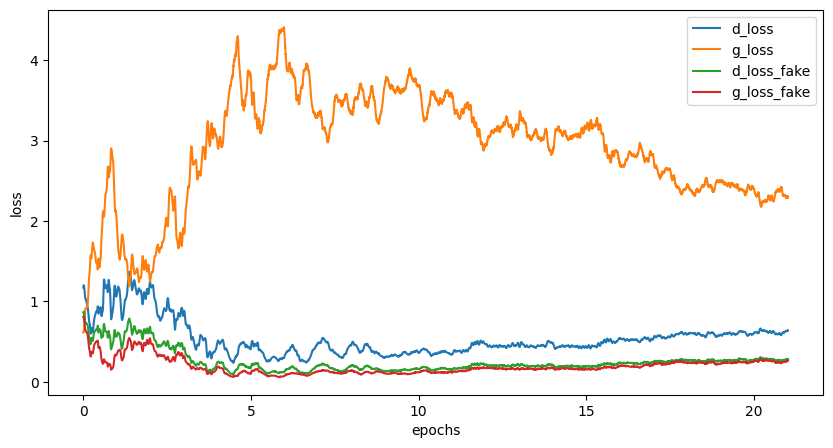

Epoch [22/500], Step[100/469], d_loss: 0.7475, d_loss_fake: 0.3449, g_loss: 2.0704, g_loss_fake: 0.2936, D(x): 0.78, D(G(z)): 0.25
Epoch [22/500], Step[200/469], d_loss: 0.5763, d_loss_fake: 0.3203, g_loss: 1.9468, g_loss_fake: 0.3332, D(x): 0.83, D(G(z)): 0.23
Epoch [22/500], Step[300/469], d_loss: 0.6621, d_loss_fake: 0.3782, g_loss: 1.9776, g_loss_fake: 0.4803, D(x): 0.82, D(G(z)): 0.22
Epoch [22/500], Step[400/469], d_loss: 0.4847, d_loss_fake: 0.2039, g_loss: 2.0815, g_loss_fake: 0.2190, D(x): 0.84, D(G(z)): 0.15


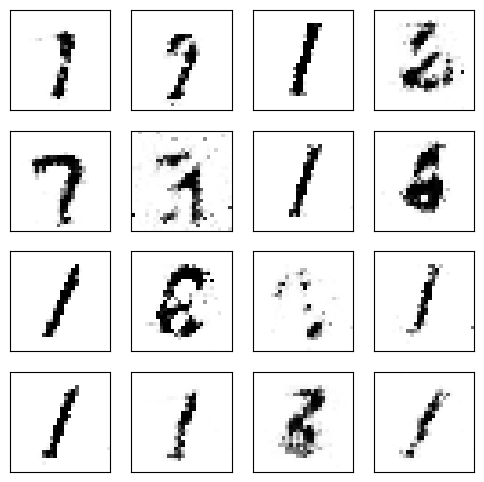

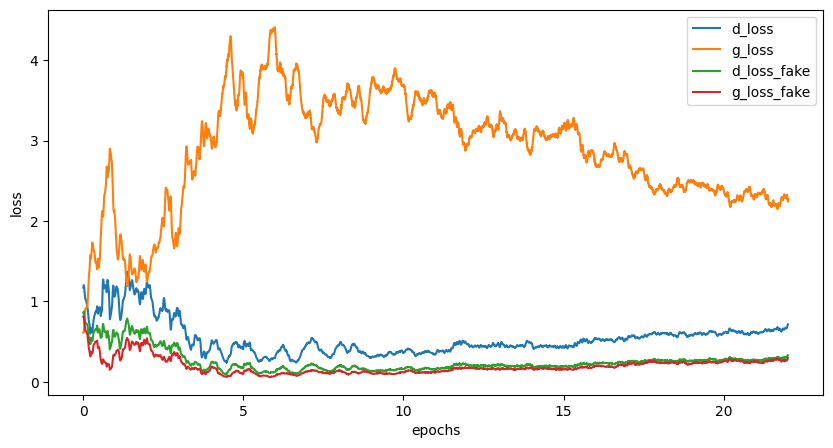

Epoch [23/500], Step[100/469], d_loss: 0.7315, d_loss_fake: 0.1950, g_loss: 2.5435, g_loss_fake: 0.1583, D(x): 0.71, D(G(z)): 0.15
Epoch [23/500], Step[200/469], d_loss: 0.5710, d_loss_fake: 0.3401, g_loss: 2.1369, g_loss_fake: 0.2027, D(x): 0.85, D(G(z)): 0.22
Epoch [23/500], Step[300/469], d_loss: 0.7098, d_loss_fake: 0.4555, g_loss: 2.1301, g_loss_fake: 0.2362, D(x): 0.83, D(G(z)): 0.29
Epoch [23/500], Step[400/469], d_loss: 0.6966, d_loss_fake: 0.2512, g_loss: 2.0415, g_loss_fake: 0.3456, D(x): 0.77, D(G(z)): 0.18


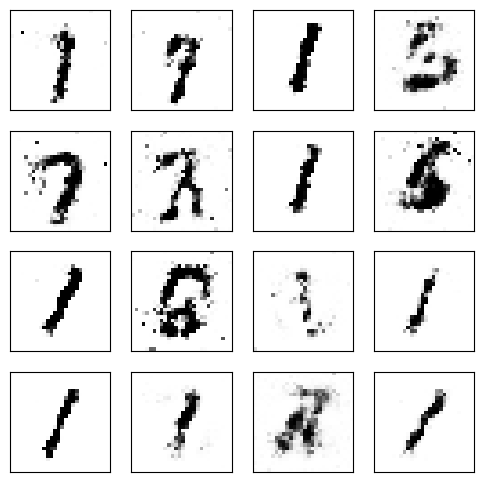

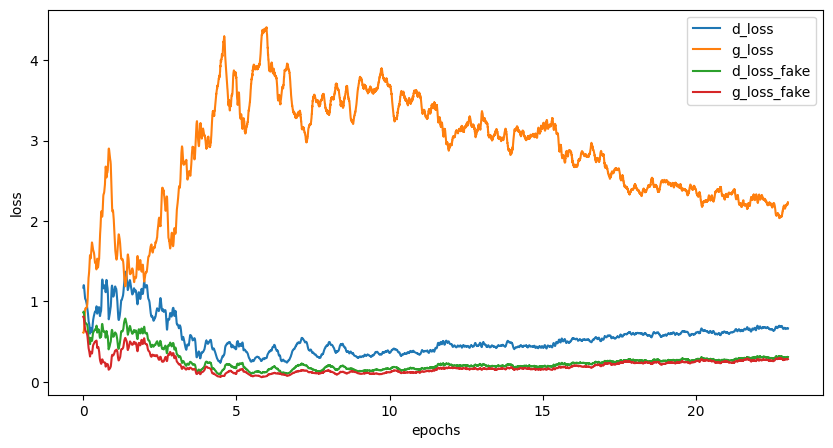

Epoch [24/500], Step[100/469], d_loss: 0.6922, d_loss_fake: 0.5031, g_loss: 1.6213, g_loss_fake: 0.3748, D(x): 0.87, D(G(z)): 0.32
Epoch [24/500], Step[200/469], d_loss: 0.7464, d_loss_fake: 0.4507, g_loss: 2.2109, g_loss_fake: 0.2715, D(x): 0.82, D(G(z)): 0.27
Epoch [24/500], Step[300/469], d_loss: 0.6994, d_loss_fake: 0.2166, g_loss: 2.1071, g_loss_fake: 0.2483, D(x): 0.73, D(G(z)): 0.15
Epoch [24/500], Step[400/469], d_loss: 0.5491, d_loss_fake: 0.2039, g_loss: 2.3150, g_loss_fake: 0.1966, D(x): 0.79, D(G(z)): 0.15


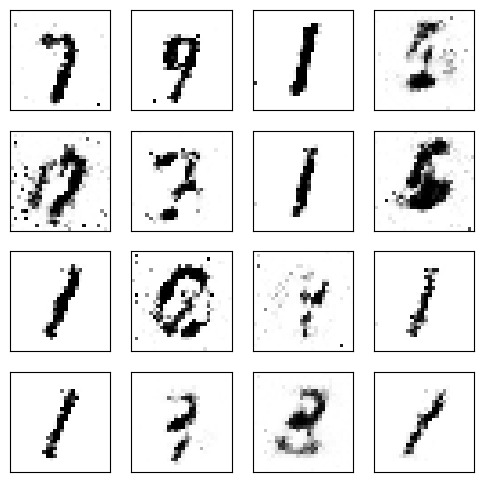

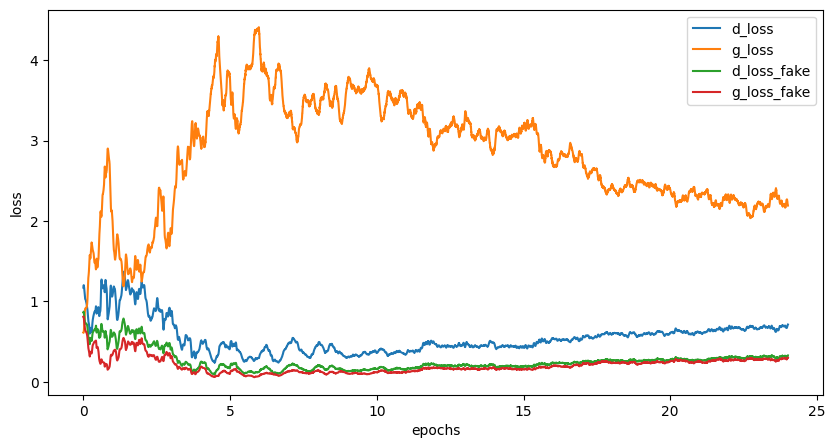

Epoch [25/500], Step[100/469], d_loss: 0.9805, d_loss_fake: 0.4158, g_loss: 2.1423, g_loss_fake: 0.2540, D(x): 0.71, D(G(z)): 0.26
Epoch [25/500], Step[200/469], d_loss: 0.7989, d_loss_fake: 0.3448, g_loss: 1.9709, g_loss_fake: 0.3488, D(x): 0.74, D(G(z)): 0.24
Epoch [25/500], Step[300/469], d_loss: 0.6804, d_loss_fake: 0.2404, g_loss: 2.1530, g_loss_fake: 0.3112, D(x): 0.73, D(G(z)): 0.17
Epoch [25/500], Step[400/469], d_loss: 0.7969, d_loss_fake: 0.3315, g_loss: 2.4612, g_loss_fake: 0.1818, D(x): 0.75, D(G(z)): 0.23


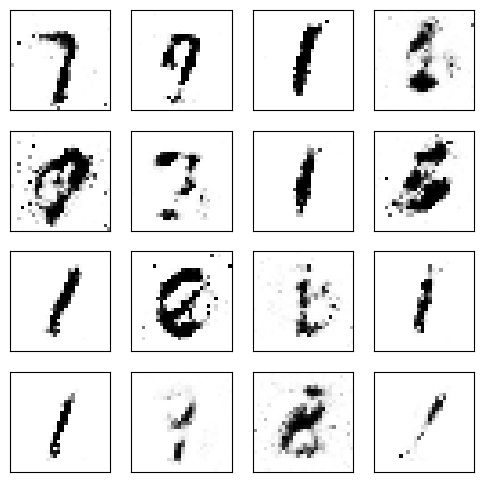

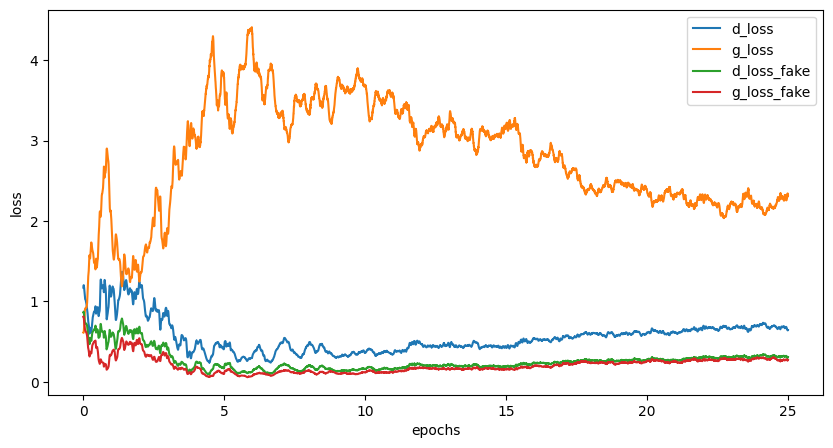

Epoch [26/500], Step[100/469], d_loss: 0.5731, d_loss_fake: 0.2945, g_loss: 2.3755, g_loss_fake: 0.2685, D(x): 0.83, D(G(z)): 0.20
Epoch [26/500], Step[200/469], d_loss: 0.6349, d_loss_fake: 0.2121, g_loss: 2.3428, g_loss_fake: 0.2717, D(x): 0.77, D(G(z)): 0.16
Epoch [26/500], Step[300/469], d_loss: 0.7528, d_loss_fake: 0.3473, g_loss: 1.9244, g_loss_fake: 0.3909, D(x): 0.77, D(G(z)): 0.23
Epoch [26/500], Step[400/469], d_loss: 0.6894, d_loss_fake: 0.3193, g_loss: 2.6261, g_loss_fake: 0.1906, D(x): 0.77, D(G(z)): 0.22


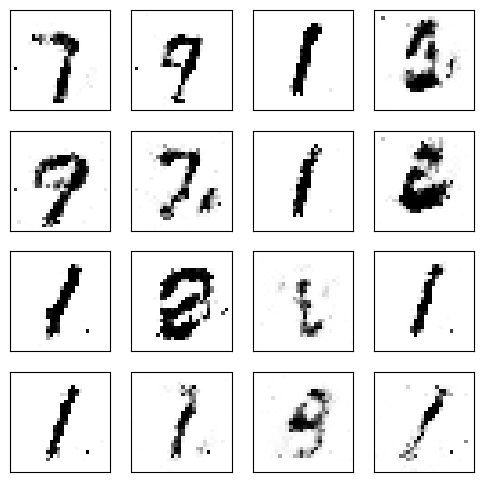

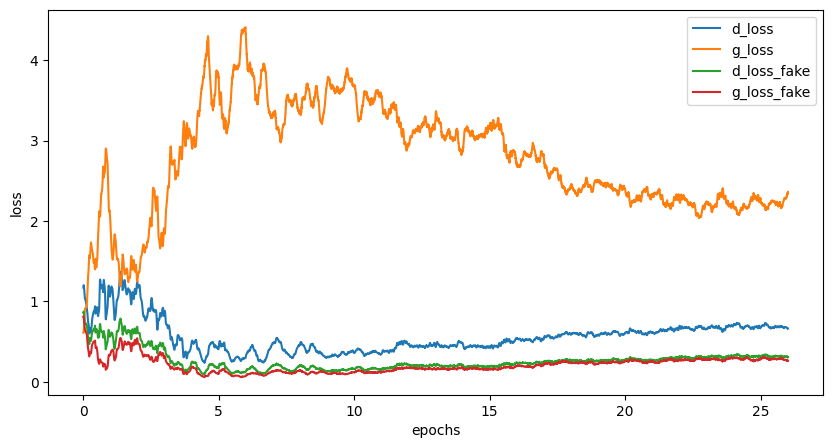

Epoch [27/500], Step[100/469], d_loss: 0.5973, d_loss_fake: 0.3093, g_loss: 1.7290, g_loss_fake: 0.4498, D(x): 0.82, D(G(z)): 0.21
Epoch [27/500], Step[200/469], d_loss: 0.5697, d_loss_fake: 0.2313, g_loss: 2.3991, g_loss_fake: 0.1982, D(x): 0.80, D(G(z)): 0.17
Epoch [27/500], Step[300/469], d_loss: 0.5424, d_loss_fake: 0.2113, g_loss: 2.3303, g_loss_fake: 0.2439, D(x): 0.80, D(G(z)): 0.17
Epoch [27/500], Step[400/469], d_loss: 0.6165, d_loss_fake: 0.2438, g_loss: 1.7853, g_loss_fake: 0.4156, D(x): 0.78, D(G(z)): 0.18


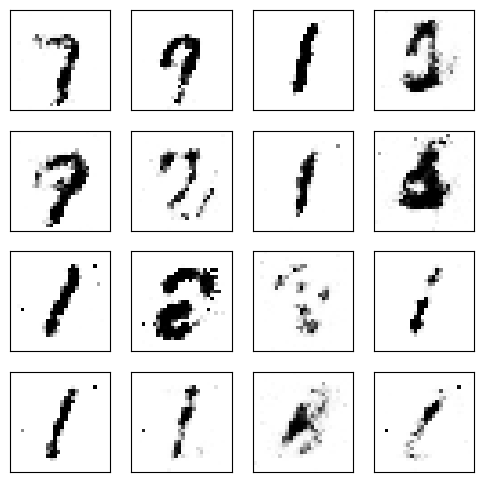

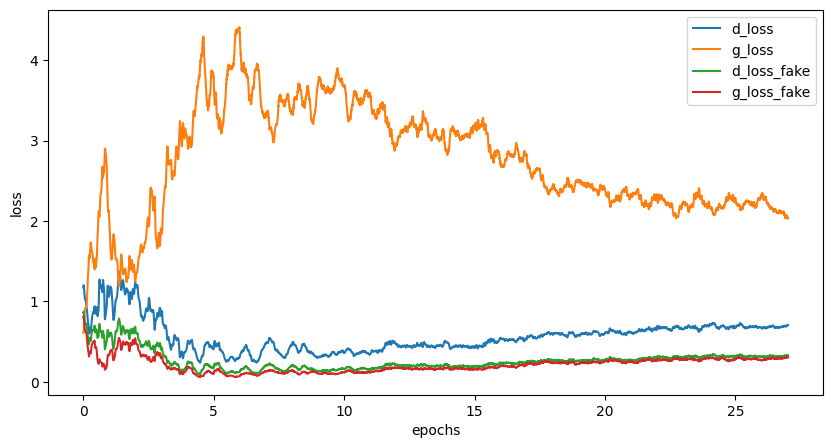

Epoch [28/500], Step[100/469], d_loss: 0.5902, d_loss_fake: 0.3765, g_loss: 1.5870, g_loss_fake: 0.4599, D(x): 0.85, D(G(z)): 0.24
Epoch [28/500], Step[200/469], d_loss: 0.6941, d_loss_fake: 0.2266, g_loss: 2.0325, g_loss_fake: 0.2705, D(x): 0.73, D(G(z)): 0.19
Epoch [28/500], Step[300/469], d_loss: 0.8664, d_loss_fake: 0.5401, g_loss: 2.4444, g_loss_fake: 0.2325, D(x): 0.80, D(G(z)): 0.31
Epoch [28/500], Step[400/469], d_loss: 0.8824, d_loss_fake: 0.4283, g_loss: 2.0178, g_loss_fake: 0.2850, D(x): 0.73, D(G(z)): 0.28


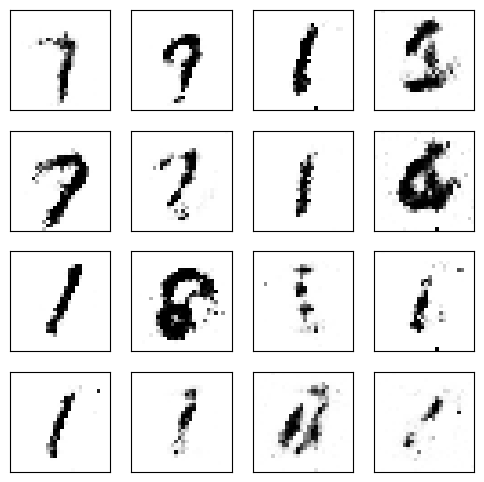

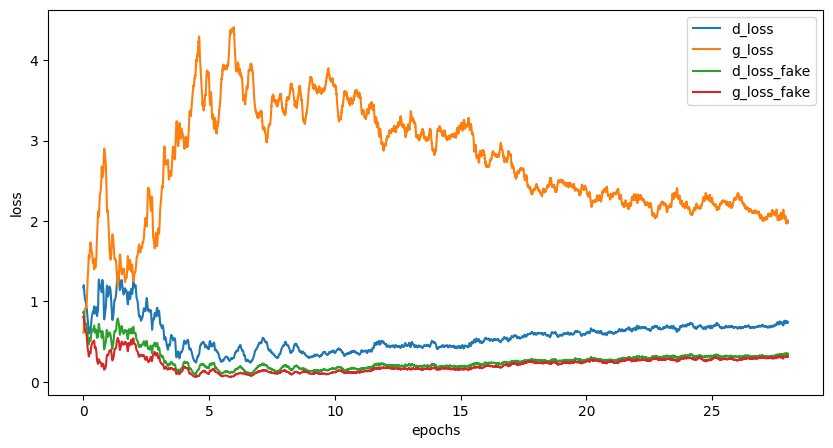

Epoch [29/500], Step[100/469], d_loss: 0.7183, d_loss_fake: 0.4755, g_loss: 2.0076, g_loss_fake: 0.3104, D(x): 0.84, D(G(z)): 0.29
Epoch [29/500], Step[200/469], d_loss: 0.7966, d_loss_fake: 0.4192, g_loss: 1.9468, g_loss_fake: 0.3207, D(x): 0.77, D(G(z)): 0.29
Epoch [29/500], Step[300/469], d_loss: 0.9118, d_loss_fake: 0.3663, g_loss: 1.7727, g_loss_fake: 0.4052, D(x): 0.70, D(G(z)): 0.23
Epoch [29/500], Step[400/469], d_loss: 0.6748, d_loss_fake: 0.2292, g_loss: 1.6781, g_loss_fake: 0.3580, D(x): 0.76, D(G(z)): 0.19


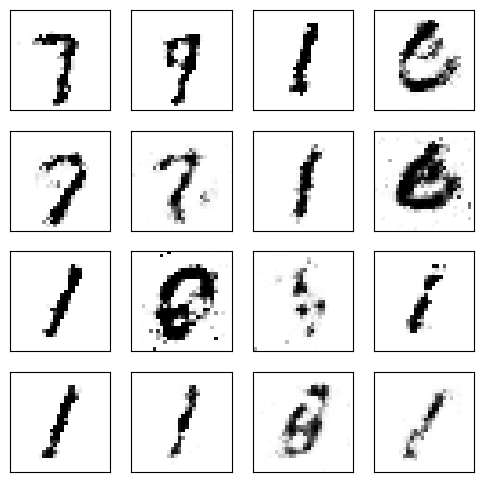

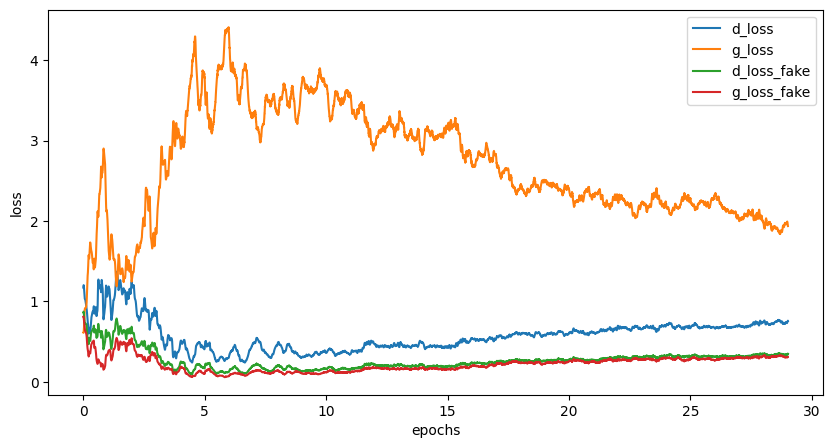

Epoch [30/500], Step[100/469], d_loss: 0.7899, d_loss_fake: 0.4339, g_loss: 2.2586, g_loss_fake: 0.2489, D(x): 0.78, D(G(z)): 0.28
Epoch [30/500], Step[200/469], d_loss: 0.7150, d_loss_fake: 0.3823, g_loss: 1.9428, g_loss_fake: 0.2880, D(x): 0.78, D(G(z)): 0.27
Epoch [30/500], Step[300/469], d_loss: 0.8086, d_loss_fake: 0.3533, g_loss: 1.9521, g_loss_fake: 0.3520, D(x): 0.74, D(G(z)): 0.21
Epoch [30/500], Step[400/469], d_loss: 0.7351, d_loss_fake: 0.3393, g_loss: 1.8591, g_loss_fake: 0.2976, D(x): 0.75, D(G(z)): 0.25


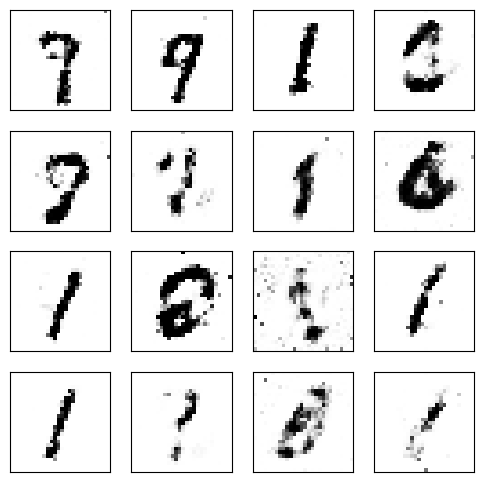

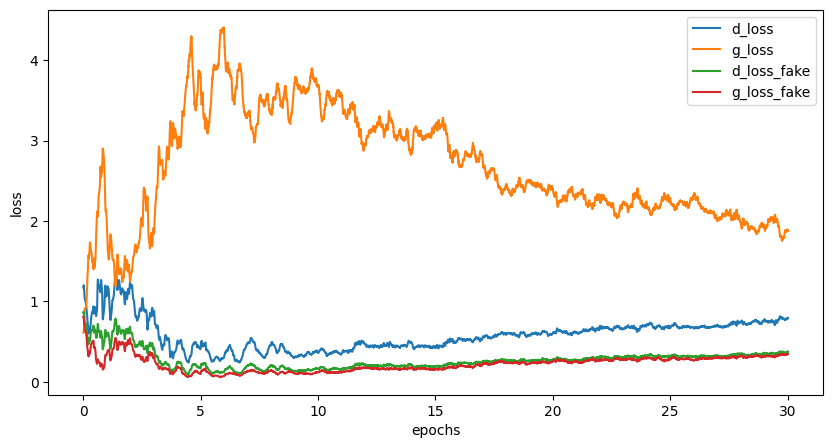

Epoch [31/500], Step[100/469], d_loss: 0.7872, d_loss_fake: 0.4367, g_loss: 1.7004, g_loss_fake: 0.3696, D(x): 0.78, D(G(z)): 0.30
Epoch [31/500], Step[200/469], d_loss: 1.0398, d_loss_fake: 0.4749, g_loss: 1.6455, g_loss_fake: 0.3716, D(x): 0.68, D(G(z)): 0.31
Epoch [31/500], Step[300/469], d_loss: 0.7706, d_loss_fake: 0.3147, g_loss: 1.3840, g_loss_fake: 0.4970, D(x): 0.72, D(G(z)): 0.24
Epoch [31/500], Step[400/469], d_loss: 0.6677, d_loss_fake: 0.2904, g_loss: 1.9665, g_loss_fake: 0.3233, D(x): 0.76, D(G(z)): 0.22


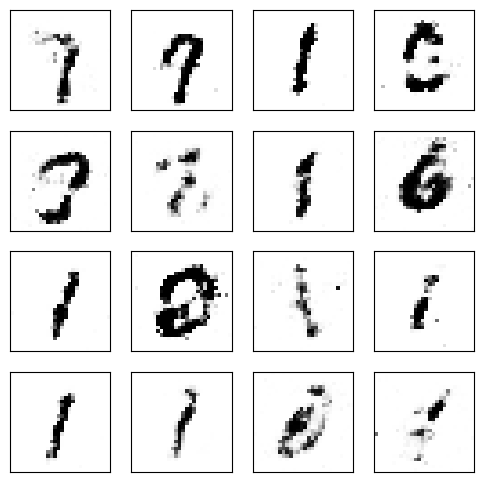

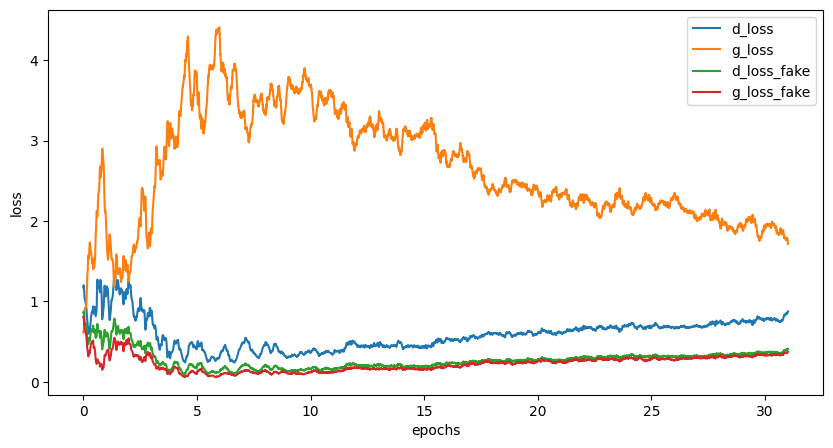

Epoch [32/500], Step[100/469], d_loss: 0.7370, d_loss_fake: 0.3621, g_loss: 1.5224, g_loss_fake: 0.4425, D(x): 0.76, D(G(z)): 0.26
Epoch [32/500], Step[200/469], d_loss: 0.7860, d_loss_fake: 0.3385, g_loss: 2.2535, g_loss_fake: 0.1875, D(x): 0.74, D(G(z)): 0.23
Epoch [32/500], Step[300/469], d_loss: 0.7572, d_loss_fake: 0.2870, g_loss: 1.9052, g_loss_fake: 0.2487, D(x): 0.73, D(G(z)): 0.22
Epoch [32/500], Step[400/469], d_loss: 0.7058, d_loss_fake: 0.2493, g_loss: 2.2460, g_loss_fake: 0.1994, D(x): 0.74, D(G(z)): 0.18


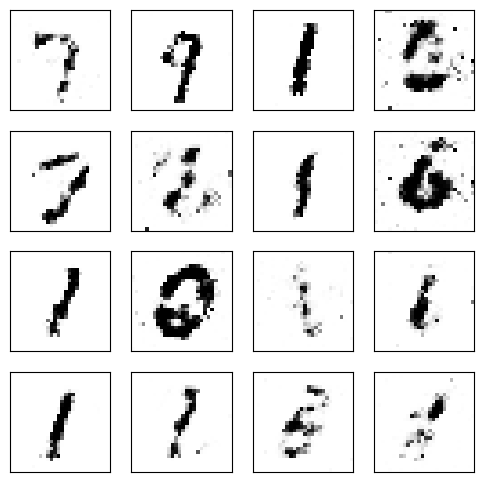

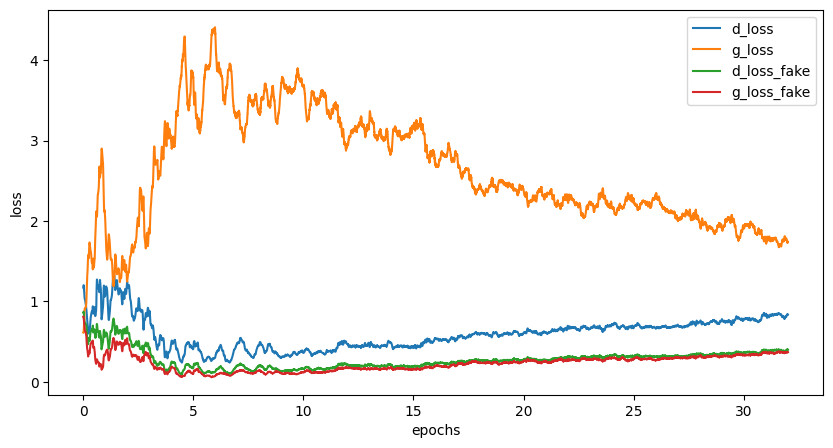

Epoch [33/500], Step[100/469], d_loss: 0.6337, d_loss_fake: 0.2255, g_loss: 2.2638, g_loss_fake: 0.2254, D(x): 0.75, D(G(z)): 0.18
Epoch [33/500], Step[200/469], d_loss: 0.9205, d_loss_fake: 0.5641, g_loss: 1.9189, g_loss_fake: 0.3026, D(x): 0.78, D(G(z)): 0.36
Epoch [33/500], Step[300/469], d_loss: 0.9960, d_loss_fake: 0.5733, g_loss: 1.1975, g_loss_fake: 0.5848, D(x): 0.72, D(G(z)): 0.37
Epoch [33/500], Step[400/469], d_loss: 0.9817, d_loss_fake: 0.3574, g_loss: 1.7623, g_loss_fake: 0.3349, D(x): 0.62, D(G(z)): 0.26


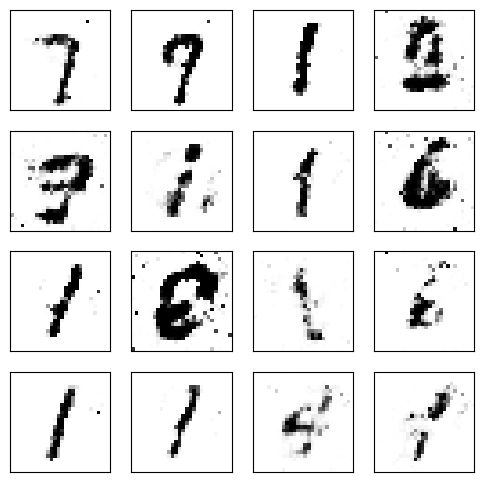

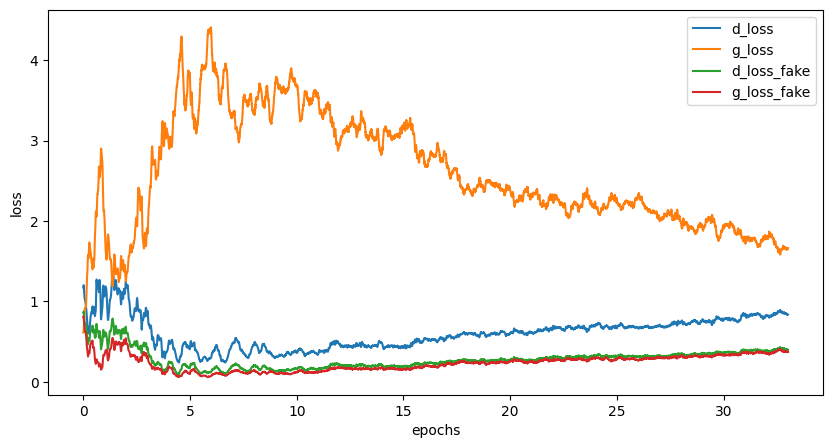

Epoch [34/500], Step[100/469], d_loss: 0.9421, d_loss_fake: 0.3998, g_loss: 1.9822, g_loss_fake: 0.2769, D(x): 0.70, D(G(z)): 0.25
Epoch [34/500], Step[200/469], d_loss: 0.8876, d_loss_fake: 0.4012, g_loss: 1.5043, g_loss_fake: 0.3476, D(x): 0.70, D(G(z)): 0.30
Epoch [34/500], Step[300/469], d_loss: 0.6299, d_loss_fake: 0.3181, g_loss: 2.2007, g_loss_fake: 0.2576, D(x): 0.81, D(G(z)): 0.23
Epoch [34/500], Step[400/469], d_loss: 0.9223, d_loss_fake: 0.5312, g_loss: 1.2813, g_loss_fake: 0.5481, D(x): 0.74, D(G(z)): 0.33


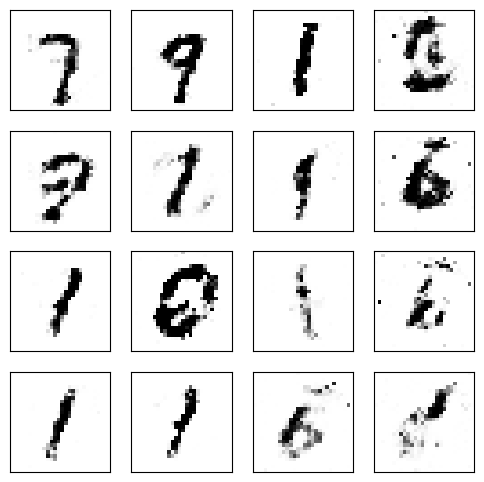

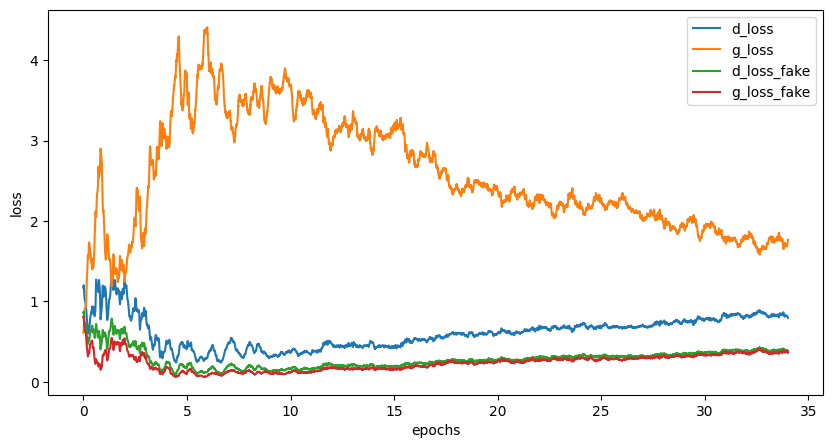

Epoch [35/500], Step[100/469], d_loss: 0.5830, d_loss_fake: 0.2645, g_loss: 2.1845, g_loss_fake: 0.2539, D(x): 0.80, D(G(z)): 0.20
Epoch [35/500], Step[200/469], d_loss: 0.7829, d_loss_fake: 0.4749, g_loss: 1.5231, g_loss_fake: 0.3920, D(x): 0.79, D(G(z)): 0.32
Epoch [35/500], Step[300/469], d_loss: 0.7984, d_loss_fake: 0.2529, g_loss: 1.7281, g_loss_fake: 0.3403, D(x): 0.67, D(G(z)): 0.20
Epoch [35/500], Step[400/469], d_loss: 0.7415, d_loss_fake: 0.3866, g_loss: 2.0713, g_loss_fake: 0.2516, D(x): 0.76, D(G(z)): 0.27


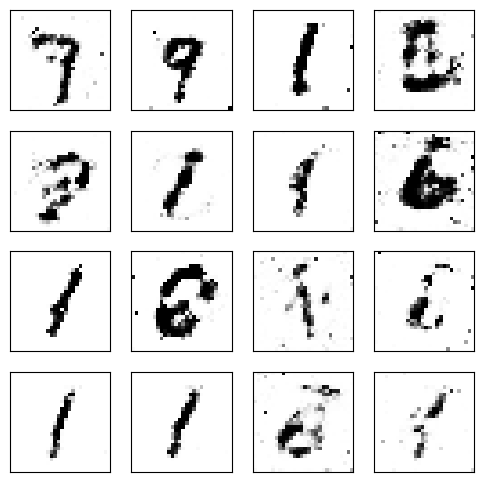

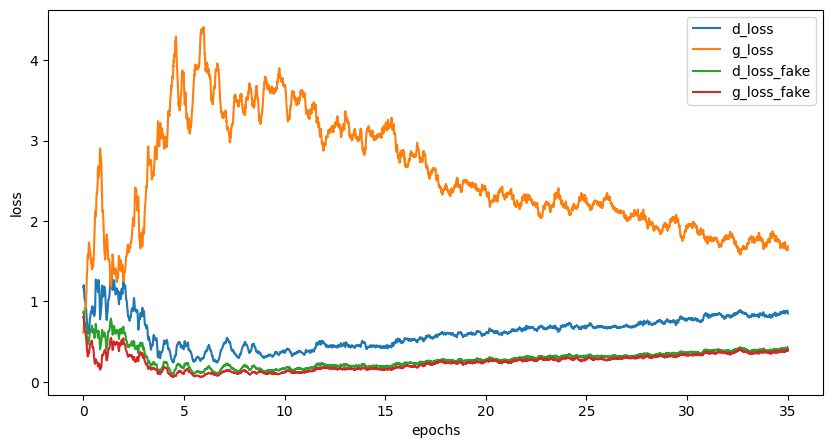

Epoch [36/500], Step[100/469], d_loss: 0.7204, d_loss_fake: 0.2834, g_loss: 2.0477, g_loss_fake: 0.2392, D(x): 0.75, D(G(z)): 0.21
Epoch [36/500], Step[200/469], d_loss: 0.8535, d_loss_fake: 0.5041, g_loss: 1.7348, g_loss_fake: 0.4260, D(x): 0.76, D(G(z)): 0.32
Epoch [36/500], Step[300/469], d_loss: 0.9271, d_loss_fake: 0.5829, g_loss: 1.3233, g_loss_fake: 0.5102, D(x): 0.76, D(G(z)): 0.36
Epoch [36/500], Step[400/469], d_loss: 0.9184, d_loss_fake: 0.4309, g_loss: 1.5315, g_loss_fake: 0.4832, D(x): 0.71, D(G(z)): 0.30


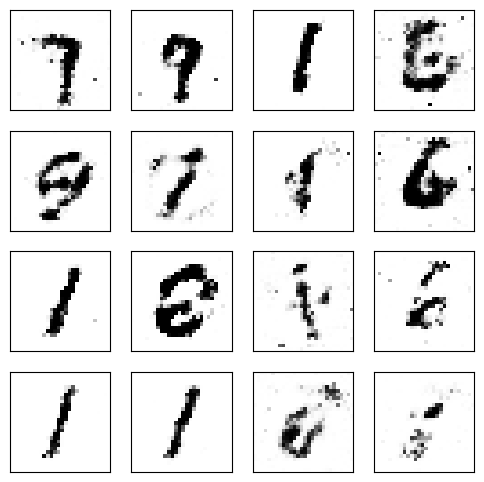

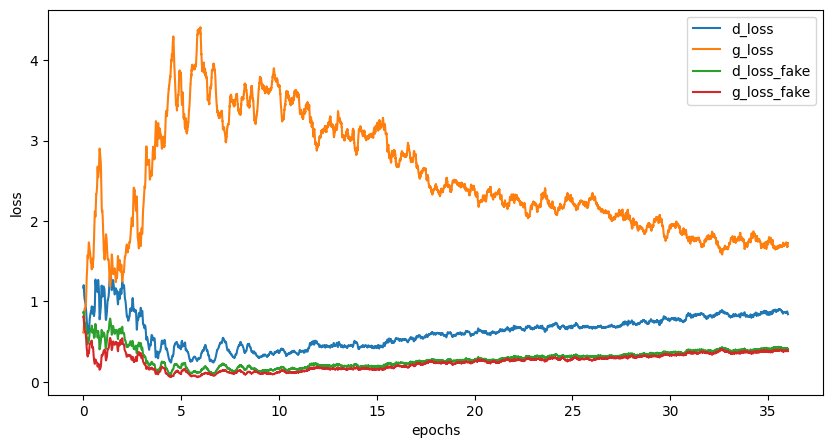

Epoch [37/500], Step[100/469], d_loss: 0.8219, d_loss_fake: 0.4283, g_loss: 1.6102, g_loss_fake: 0.4400, D(x): 0.75, D(G(z)): 0.29
Epoch [37/500], Step[200/469], d_loss: 0.7430, d_loss_fake: 0.3244, g_loss: 1.9315, g_loss_fake: 0.3614, D(x): 0.73, D(G(z)): 0.23
Epoch [37/500], Step[300/469], d_loss: 0.8768, d_loss_fake: 0.3982, g_loss: 1.6372, g_loss_fake: 0.4591, D(x): 0.70, D(G(z)): 0.27
Epoch [37/500], Step[400/469], d_loss: 1.0402, d_loss_fake: 0.5862, g_loss: 1.5859, g_loss_fake: 0.4012, D(x): 0.72, D(G(z)): 0.38


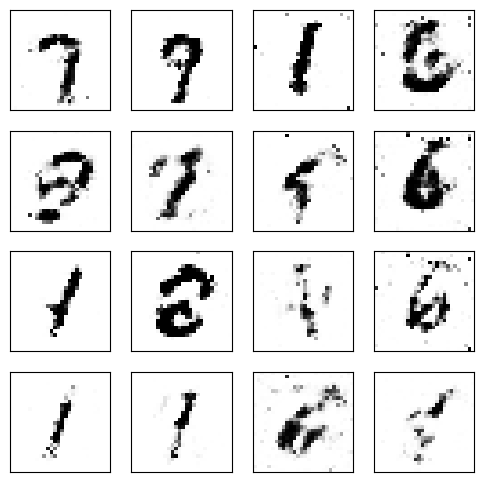

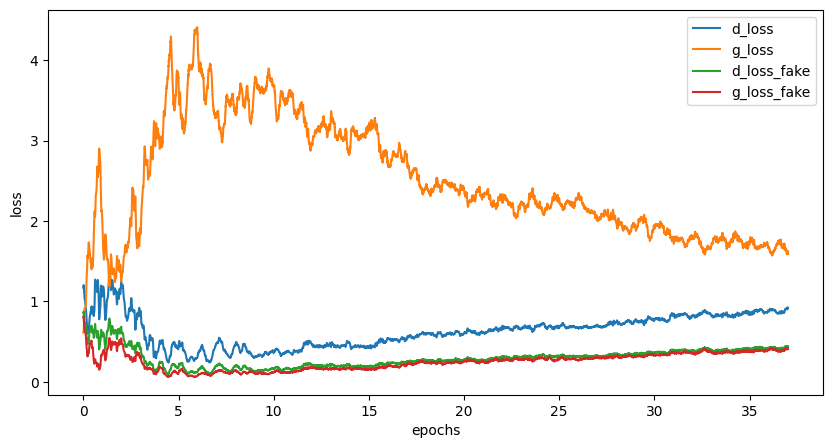

Epoch [38/500], Step[100/469], d_loss: 0.8808, d_loss_fake: 0.4740, g_loss: 1.6409, g_loss_fake: 0.3959, D(x): 0.73, D(G(z)): 0.31
Epoch [38/500], Step[200/469], d_loss: 0.8154, d_loss_fake: 0.4607, g_loss: 1.7625, g_loss_fake: 0.3503, D(x): 0.76, D(G(z)): 0.30
Epoch [38/500], Step[300/469], d_loss: 0.8625, d_loss_fake: 0.3770, g_loss: 1.7542, g_loss_fake: 0.3053, D(x): 0.69, D(G(z)): 0.27
Epoch [38/500], Step[400/469], d_loss: 0.9533, d_loss_fake: 0.4952, g_loss: 1.5990, g_loss_fake: 0.3733, D(x): 0.71, D(G(z)): 0.34


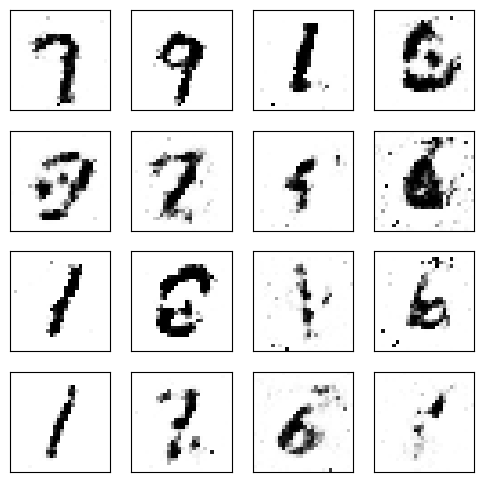

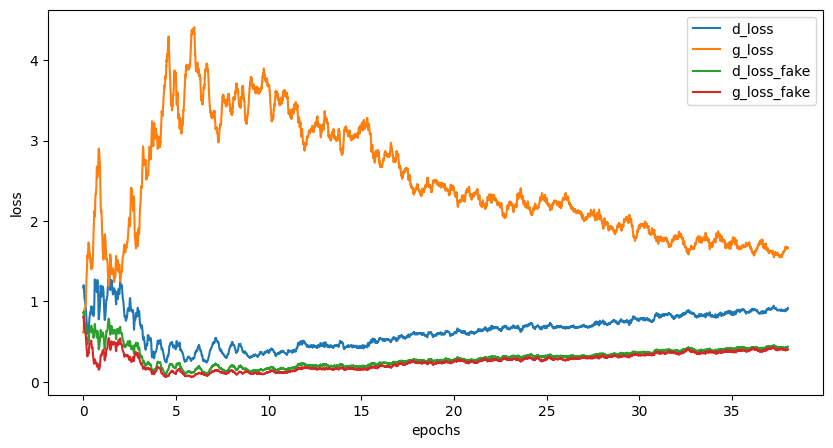

Epoch [39/500], Step[100/469], d_loss: 0.9789, d_loss_fake: 0.5013, g_loss: 1.5606, g_loss_fake: 0.3806, D(x): 0.70, D(G(z)): 0.34
Epoch [39/500], Step[200/469], d_loss: 0.9284, d_loss_fake: 0.4328, g_loss: 1.4827, g_loss_fake: 0.4091, D(x): 0.69, D(G(z)): 0.30
Epoch [39/500], Step[300/469], d_loss: 0.9362, d_loss_fake: 0.3814, g_loss: 1.9737, g_loss_fake: 0.2395, D(x): 0.66, D(G(z)): 0.26
Epoch [39/500], Step[400/469], d_loss: 0.7357, d_loss_fake: 0.2774, g_loss: 1.8709, g_loss_fake: 0.3204, D(x): 0.72, D(G(z)): 0.20


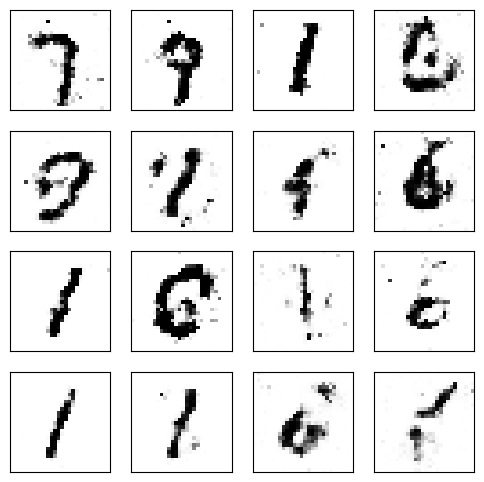

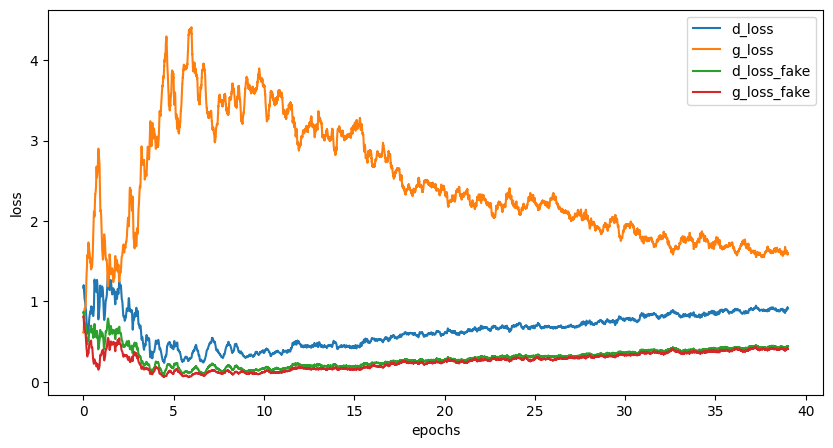

Epoch [40/500], Step[100/469], d_loss: 0.7010, d_loss_fake: 0.3673, g_loss: 1.9355, g_loss_fake: 0.3518, D(x): 0.78, D(G(z)): 0.25
Epoch [40/500], Step[200/469], d_loss: 1.0119, d_loss_fake: 0.5268, g_loss: 1.5556, g_loss_fake: 0.4407, D(x): 0.70, D(G(z)): 0.33
Epoch [40/500], Step[300/469], d_loss: 0.8908, d_loss_fake: 0.5181, g_loss: 1.4052, g_loss_fake: 0.4277, D(x): 0.75, D(G(z)): 0.35
Epoch [40/500], Step[400/469], d_loss: 0.9457, d_loss_fake: 0.4210, g_loss: 1.4811, g_loss_fake: 0.4243, D(x): 0.67, D(G(z)): 0.29


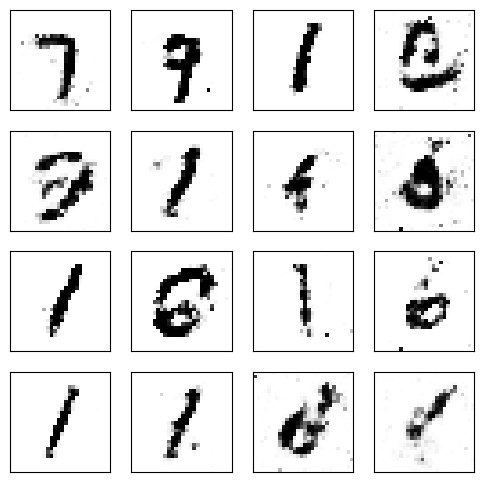

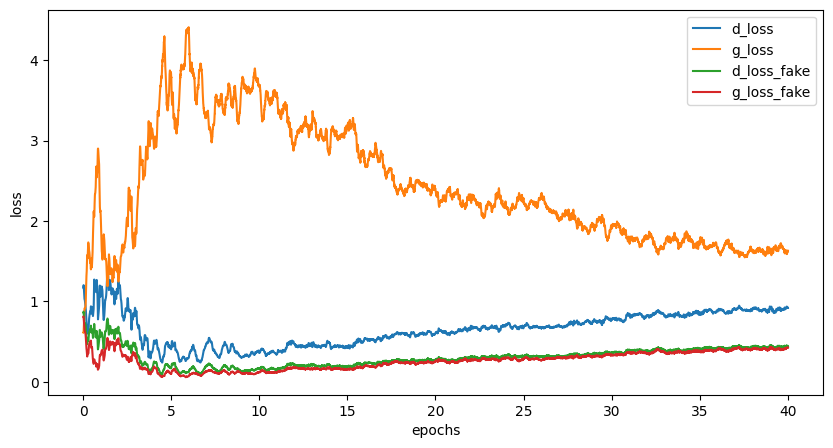

Epoch [41/500], Step[100/469], d_loss: 0.7337, d_loss_fake: 0.3297, g_loss: 1.9427, g_loss_fake: 0.3147, D(x): 0.73, D(G(z)): 0.25
Epoch [41/500], Step[200/469], d_loss: 1.0200, d_loss_fake: 0.5883, g_loss: 1.1156, g_loss_fake: 0.7122, D(x): 0.72, D(G(z)): 0.38
Epoch [41/500], Step[300/469], d_loss: 0.8726, d_loss_fake: 0.4386, g_loss: 1.3778, g_loss_fake: 0.4473, D(x): 0.71, D(G(z)): 0.32
Epoch [41/500], Step[400/469], d_loss: 0.8796, d_loss_fake: 0.4482, g_loss: 1.3749, g_loss_fake: 0.5011, D(x): 0.71, D(G(z)): 0.32


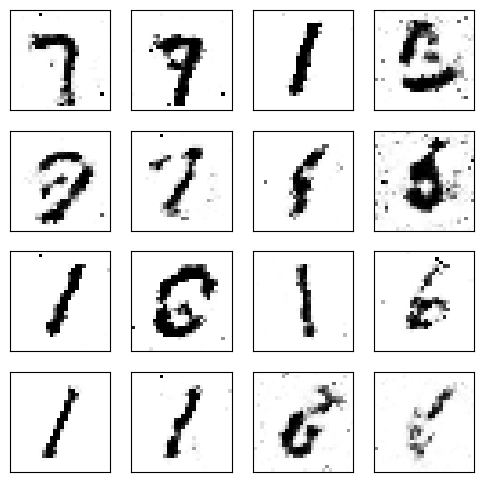

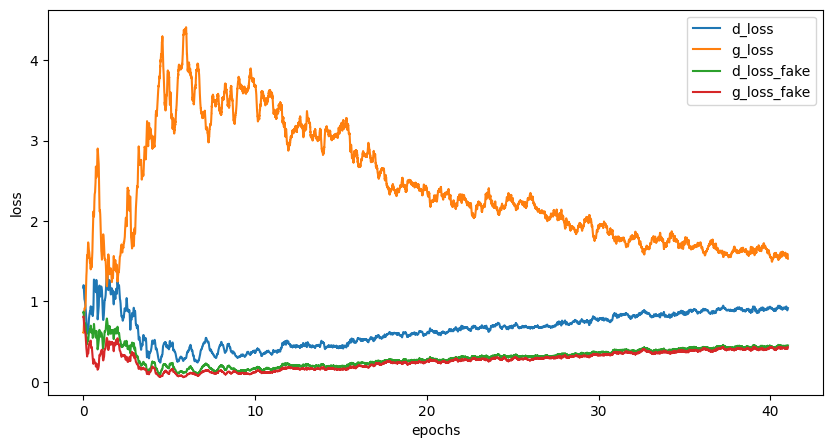

Epoch [42/500], Step[100/469], d_loss: 0.8546, d_loss_fake: 0.4358, g_loss: 1.9582, g_loss_fake: 0.2789, D(x): 0.74, D(G(z)): 0.28
Epoch [42/500], Step[200/469], d_loss: 0.8977, d_loss_fake: 0.4327, g_loss: 1.5879, g_loss_fake: 0.3824, D(x): 0.71, D(G(z)): 0.30
Epoch [42/500], Step[300/469], d_loss: 0.8804, d_loss_fake: 0.3829, g_loss: 1.7693, g_loss_fake: 0.3687, D(x): 0.68, D(G(z)): 0.27
Epoch [42/500], Step[400/469], d_loss: 1.0855, d_loss_fake: 0.6279, g_loss: 1.4493, g_loss_fake: 0.4411, D(x): 0.70, D(G(z)): 0.38


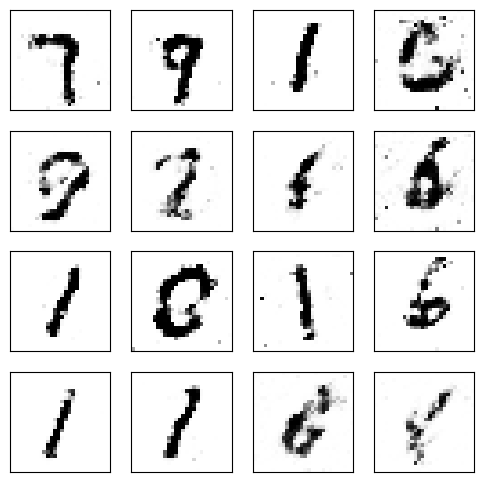

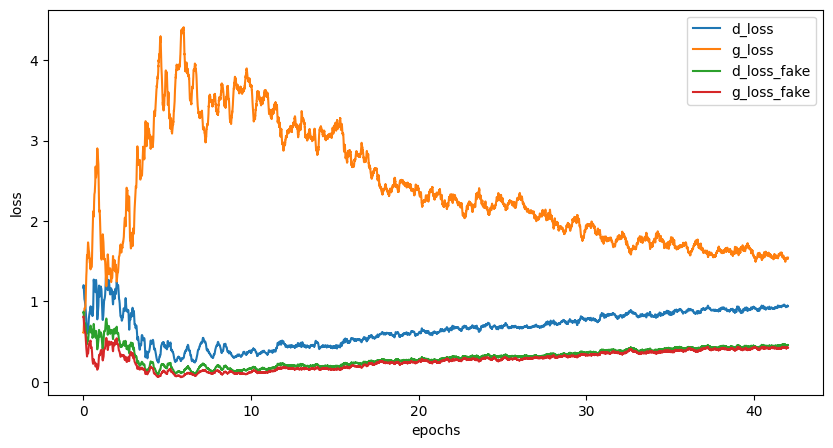

Epoch [43/500], Step[100/469], d_loss: 0.8721, d_loss_fake: 0.4467, g_loss: 1.5996, g_loss_fake: 0.4037, D(x): 0.72, D(G(z)): 0.31
Epoch [43/500], Step[200/469], d_loss: 0.8635, d_loss_fake: 0.4502, g_loss: 1.3754, g_loss_fake: 0.4727, D(x): 0.74, D(G(z)): 0.30
Epoch [43/500], Step[300/469], d_loss: 1.0574, d_loss_fake: 0.4644, g_loss: 1.3927, g_loss_fake: 0.5473, D(x): 0.66, D(G(z)): 0.32
Epoch [43/500], Step[400/469], d_loss: 0.8760, d_loss_fake: 0.3977, g_loss: 1.5341, g_loss_fake: 0.4730, D(x): 0.70, D(G(z)): 0.29


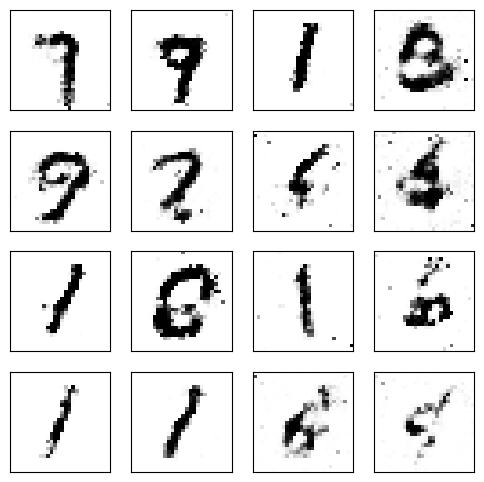

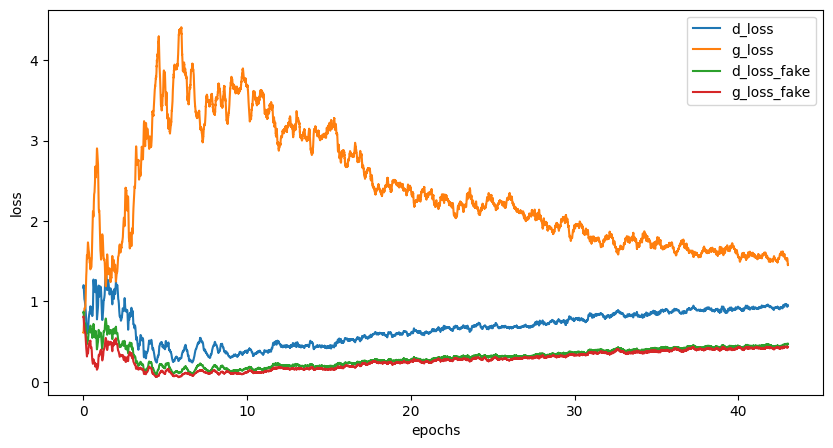

Epoch [44/500], Step[100/469], d_loss: 1.0672, d_loss_fake: 0.5299, g_loss: 1.4310, g_loss_fake: 0.4533, D(x): 0.67, D(G(z)): 0.33
Epoch [44/500], Step[200/469], d_loss: 0.9962, d_loss_fake: 0.3589, g_loss: 1.7200, g_loss_fake: 0.3214, D(x): 0.62, D(G(z)): 0.26
Epoch [44/500], Step[300/469], d_loss: 0.9592, d_loss_fake: 0.5217, g_loss: 1.6253, g_loss_fake: 0.4228, D(x): 0.72, D(G(z)): 0.34
Epoch [44/500], Step[400/469], d_loss: 1.0510, d_loss_fake: 0.4592, g_loss: 1.5100, g_loss_fake: 0.3683, D(x): 0.61, D(G(z)): 0.33


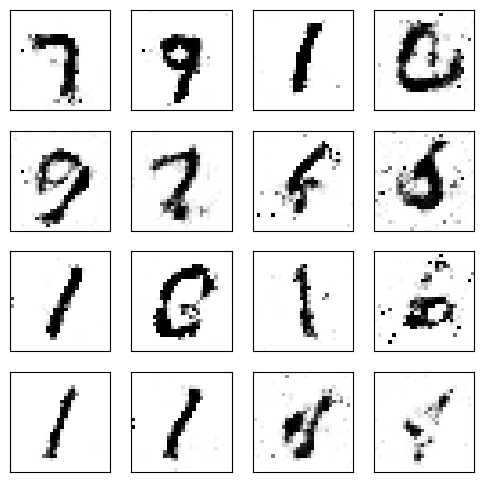

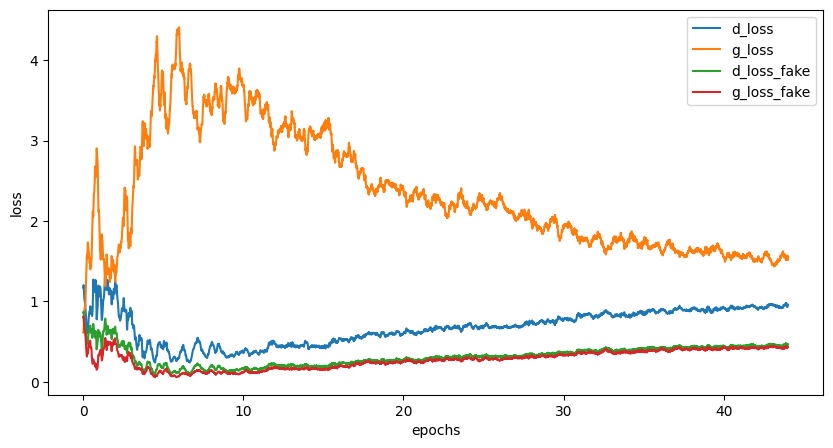

Epoch [45/500], Step[100/469], d_loss: 0.9121, d_loss_fake: 0.4359, g_loss: 1.9544, g_loss_fake: 0.3286, D(x): 0.71, D(G(z)): 0.29
Epoch [45/500], Step[200/469], d_loss: 0.9368, d_loss_fake: 0.4948, g_loss: 1.9203, g_loss_fake: 0.3371, D(x): 0.72, D(G(z)): 0.30
Epoch [45/500], Step[300/469], d_loss: 1.0303, d_loss_fake: 0.4843, g_loss: 1.3674, g_loss_fake: 0.5200, D(x): 0.68, D(G(z)): 0.33
Epoch [45/500], Step[400/469], d_loss: 1.0315, d_loss_fake: 0.4287, g_loss: 1.5571, g_loss_fake: 0.4273, D(x): 0.63, D(G(z)): 0.30


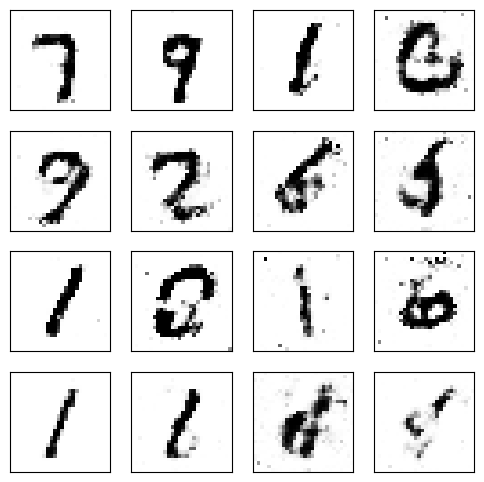

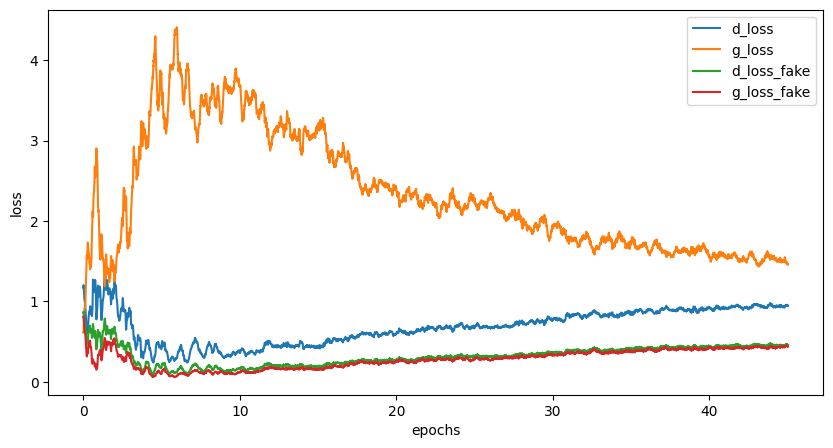

Epoch [46/500], Step[100/469], d_loss: 0.8379, d_loss_fake: 0.2647, g_loss: 1.8707, g_loss_fake: 0.3319, D(x): 0.66, D(G(z)): 0.20
Epoch [46/500], Step[200/469], d_loss: 0.9697, d_loss_fake: 0.5282, g_loss: 1.8118, g_loss_fake: 0.3660, D(x): 0.71, D(G(z)): 0.33
Epoch [46/500], Step[300/469], d_loss: 1.0136, d_loss_fake: 0.5079, g_loss: 1.9840, g_loss_fake: 0.2943, D(x): 0.68, D(G(z)): 0.34
Epoch [46/500], Step[400/469], d_loss: 1.2140, d_loss_fake: 0.2512, g_loss: 1.5568, g_loss_fake: 0.3849, D(x): 0.52, D(G(z)): 0.20


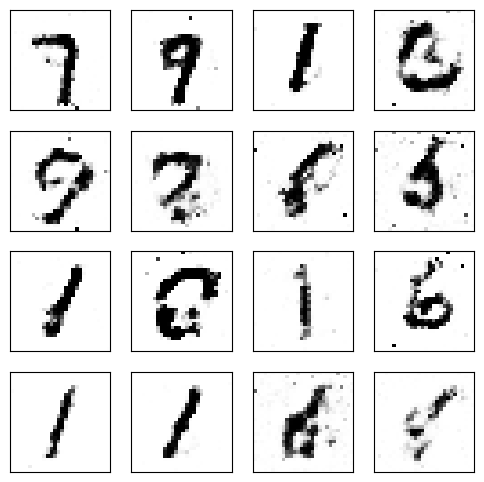

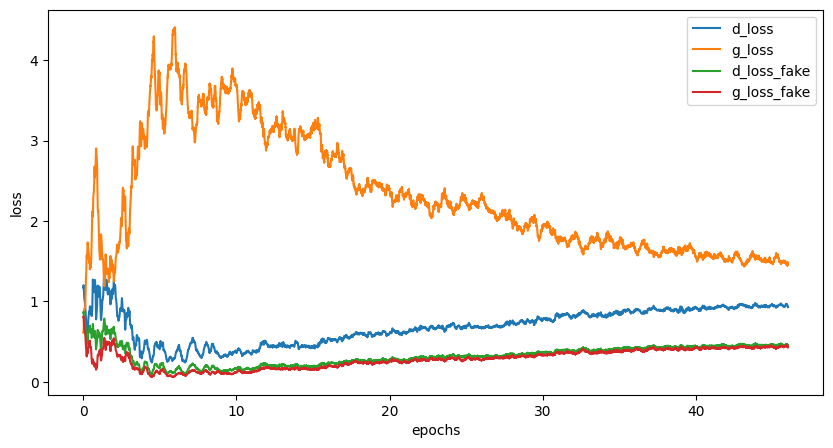

Epoch [47/500], Step[100/469], d_loss: 0.8683, d_loss_fake: 0.3538, g_loss: 1.3861, g_loss_fake: 0.4476, D(x): 0.67, D(G(z)): 0.27
Epoch [47/500], Step[200/469], d_loss: 1.0257, d_loss_fake: 0.5783, g_loss: 1.3161, g_loss_fake: 0.5105, D(x): 0.72, D(G(z)): 0.38
Epoch [47/500], Step[300/469], d_loss: 1.1046, d_loss_fake: 0.5028, g_loss: 1.1592, g_loss_fake: 0.5308, D(x): 0.61, D(G(z)): 0.35
Epoch [47/500], Step[400/469], d_loss: 0.8324, d_loss_fake: 0.4392, g_loss: 1.2721, g_loss_fake: 0.5086, D(x): 0.73, D(G(z)): 0.32


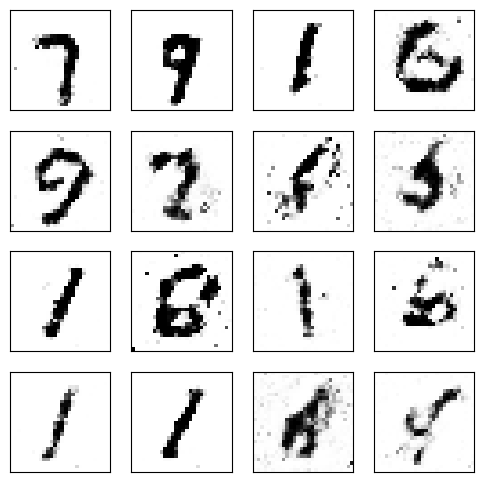

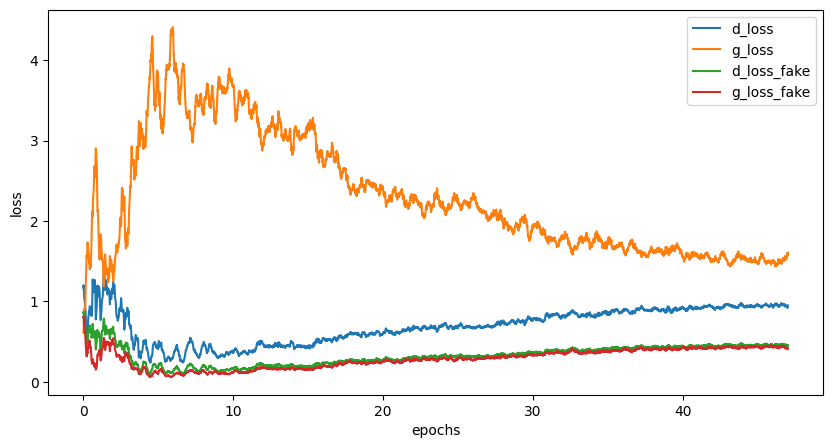

Epoch [48/500], Step[100/469], d_loss: 1.0235, d_loss_fake: 0.4770, g_loss: 1.1589, g_loss_fake: 0.5130, D(x): 0.66, D(G(z)): 0.33
Epoch [48/500], Step[200/469], d_loss: 0.9893, d_loss_fake: 0.4870, g_loss: 1.4041, g_loss_fake: 0.4176, D(x): 0.68, D(G(z)): 0.33
Epoch [48/500], Step[300/469], d_loss: 0.7883, d_loss_fake: 0.3727, g_loss: 1.6508, g_loss_fake: 0.3941, D(x): 0.72, D(G(z)): 0.25
Epoch [48/500], Step[400/469], d_loss: 0.8867, d_loss_fake: 0.5004, g_loss: 1.2566, g_loss_fake: 0.4752, D(x): 0.73, D(G(z)): 0.36


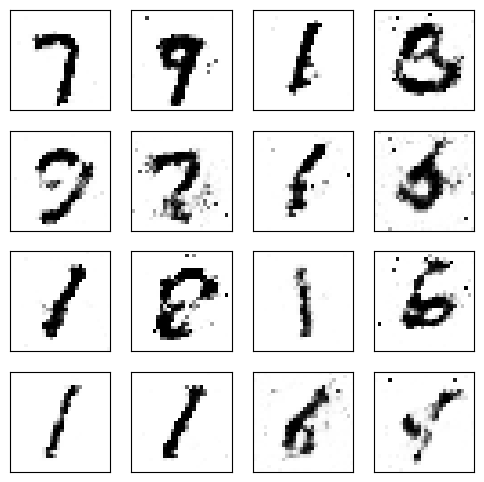

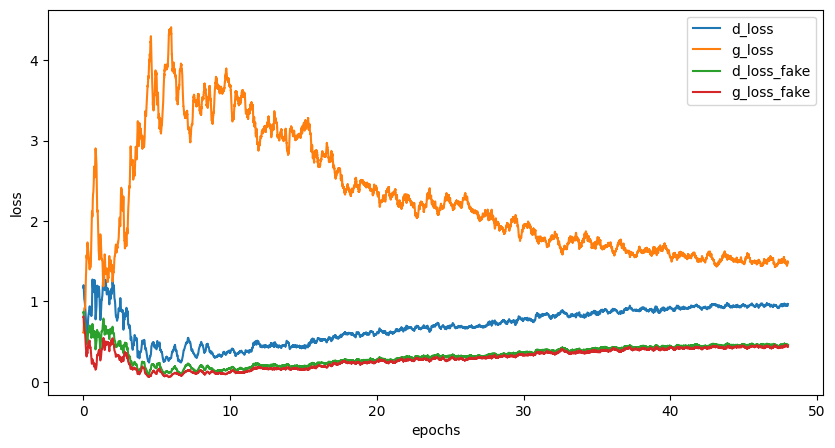

Epoch [49/500], Step[100/469], d_loss: 1.0754, d_loss_fake: 0.5402, g_loss: 1.3216, g_loss_fake: 0.4333, D(x): 0.66, D(G(z)): 0.36
Epoch [49/500], Step[200/469], d_loss: 0.7303, d_loss_fake: 0.3141, g_loss: 1.4689, g_loss_fake: 0.4629, D(x): 0.72, D(G(z)): 0.25
Epoch [49/500], Step[300/469], d_loss: 0.9745, d_loss_fake: 0.4902, g_loss: 1.6399, g_loss_fake: 0.3691, D(x): 0.70, D(G(z)): 0.32
Epoch [49/500], Step[400/469], d_loss: 0.9744, d_loss_fake: 0.4472, g_loss: 1.3689, g_loss_fake: 0.4913, D(x): 0.67, D(G(z)): 0.31


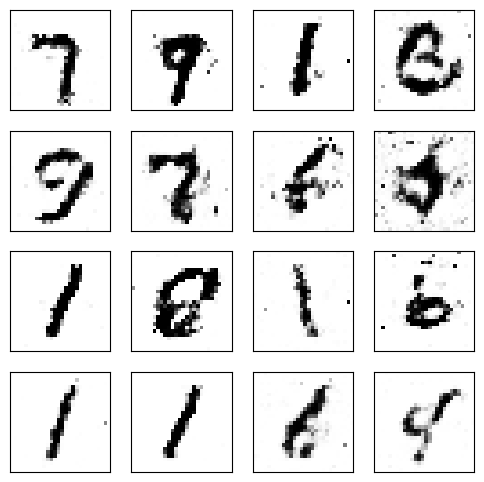

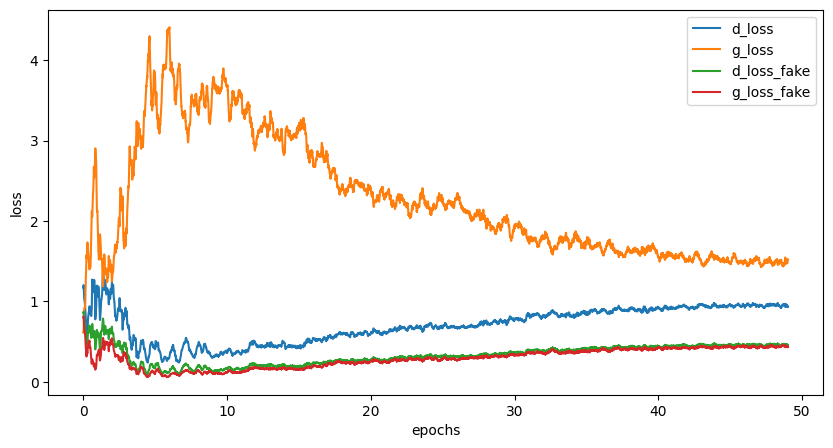

Epoch [50/500], Step[100/469], d_loss: 1.0509, d_loss_fake: 0.4621, g_loss: 1.3669, g_loss_fake: 0.5257, D(x): 0.64, D(G(z)): 0.30
Epoch [50/500], Step[200/469], d_loss: 0.8527, d_loss_fake: 0.3743, g_loss: 1.5739, g_loss_fake: 0.4205, D(x): 0.69, D(G(z)): 0.28
Epoch [50/500], Step[300/469], d_loss: 0.9628, d_loss_fake: 0.4840, g_loss: 1.3225, g_loss_fake: 0.4463, D(x): 0.68, D(G(z)): 0.34
Epoch [50/500], Step[400/469], d_loss: 0.9036, d_loss_fake: 0.3668, g_loss: 1.6036, g_loss_fake: 0.4209, D(x): 0.66, D(G(z)): 0.27


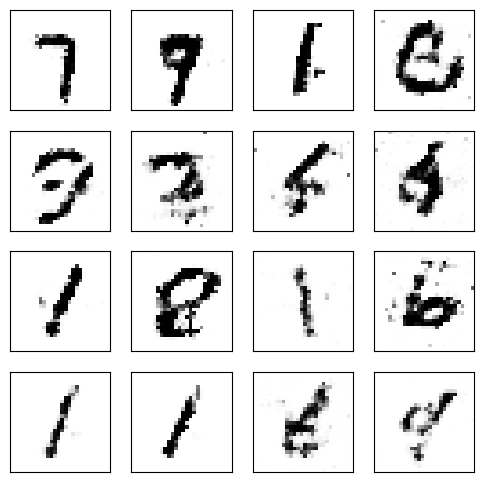

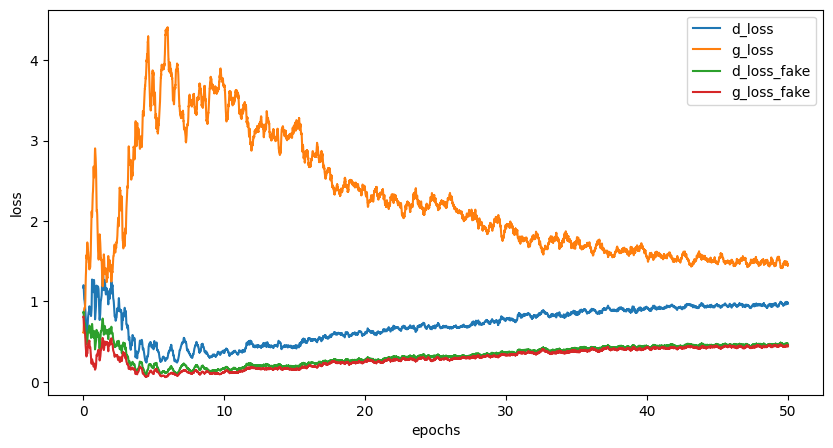

Epoch [51/500], Step[100/469], d_loss: 1.1817, d_loss_fake: 0.5304, g_loss: 1.2992, g_loss_fake: 0.5186, D(x): 0.59, D(G(z)): 0.35
Epoch [51/500], Step[200/469], d_loss: 1.0446, d_loss_fake: 0.5917, g_loss: 1.1406, g_loss_fake: 0.5479, D(x): 0.70, D(G(z)): 0.40
Epoch [51/500], Step[300/469], d_loss: 0.9688, d_loss_fake: 0.4536, g_loss: 1.6772, g_loss_fake: 0.3384, D(x): 0.66, D(G(z)): 0.32
Epoch [51/500], Step[400/469], d_loss: 1.0268, d_loss_fake: 0.6224, g_loss: 1.1607, g_loss_fake: 0.5413, D(x): 0.72, D(G(z)): 0.41


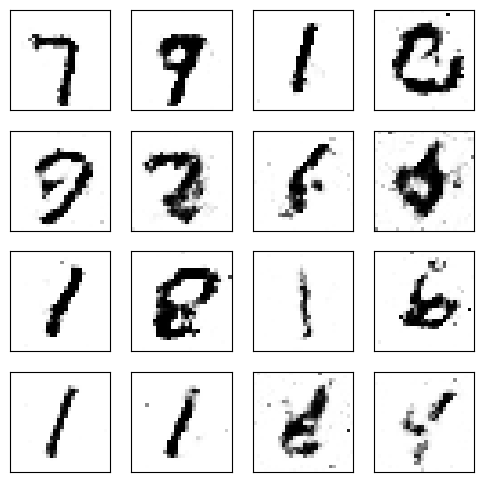

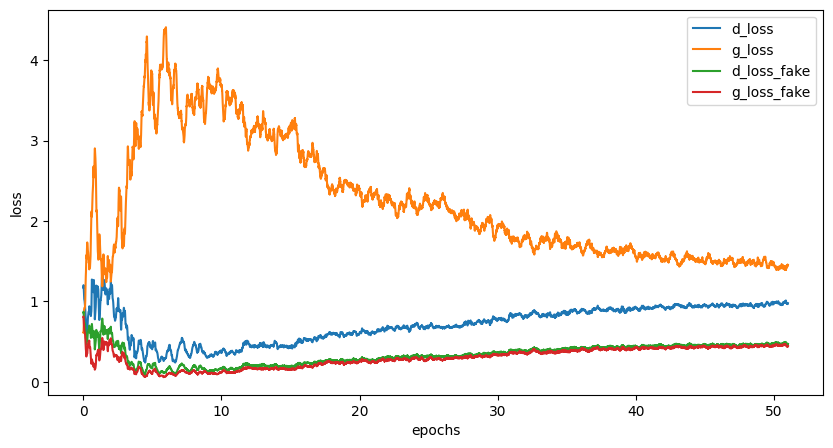

Epoch [52/500], Step[100/469], d_loss: 0.9367, d_loss_fake: 0.4654, g_loss: 1.5966, g_loss_fake: 0.4218, D(x): 0.68, D(G(z)): 0.31
Epoch [52/500], Step[200/469], d_loss: 0.9843, d_loss_fake: 0.5147, g_loss: 1.3391, g_loss_fake: 0.4675, D(x): 0.68, D(G(z)): 0.35
Epoch [52/500], Step[300/469], d_loss: 1.2148, d_loss_fake: 0.5904, g_loss: 1.6566, g_loss_fake: 0.3658, D(x): 0.63, D(G(z)): 0.36
Epoch [52/500], Step[400/469], d_loss: 0.9477, d_loss_fake: 0.3431, g_loss: 1.5808, g_loss_fake: 0.3540, D(x): 0.61, D(G(z)): 0.27


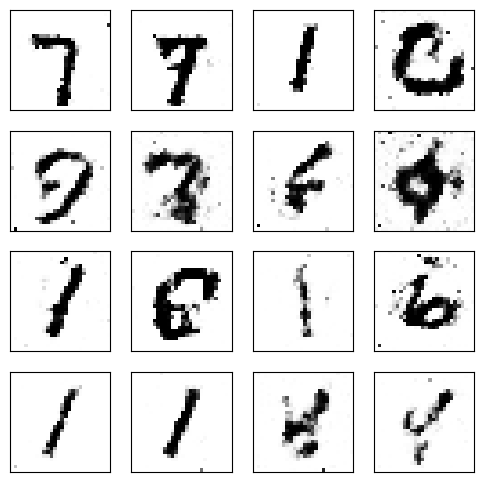

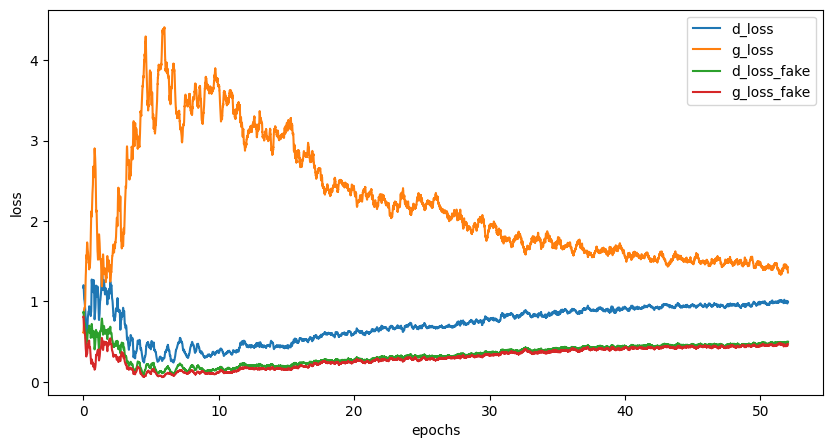

Epoch [53/500], Step[100/469], d_loss: 0.9812, d_loss_fake: 0.5271, g_loss: 1.2435, g_loss_fake: 0.5233, D(x): 0.70, D(G(z)): 0.36
Epoch [53/500], Step[200/469], d_loss: 1.1728, d_loss_fake: 0.5893, g_loss: 1.2718, g_loss_fake: 0.5031, D(x): 0.62, D(G(z)): 0.40
Epoch [53/500], Step[300/469], d_loss: 1.1316, d_loss_fake: 0.4478, g_loss: 1.4029, g_loss_fake: 0.4076, D(x): 0.59, D(G(z)): 0.33
Epoch [53/500], Step[400/469], d_loss: 0.9248, d_loss_fake: 0.3945, g_loss: 1.4908, g_loss_fake: 0.4776, D(x): 0.65, D(G(z)): 0.28


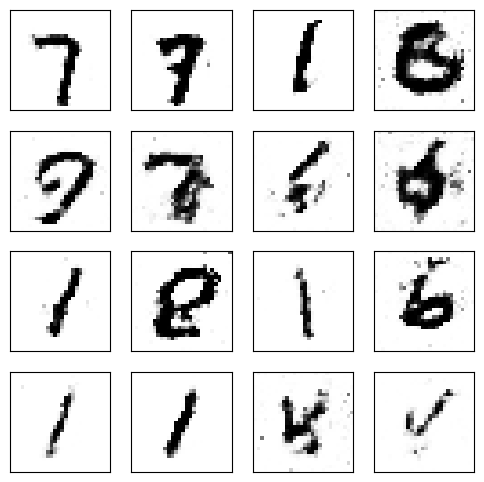

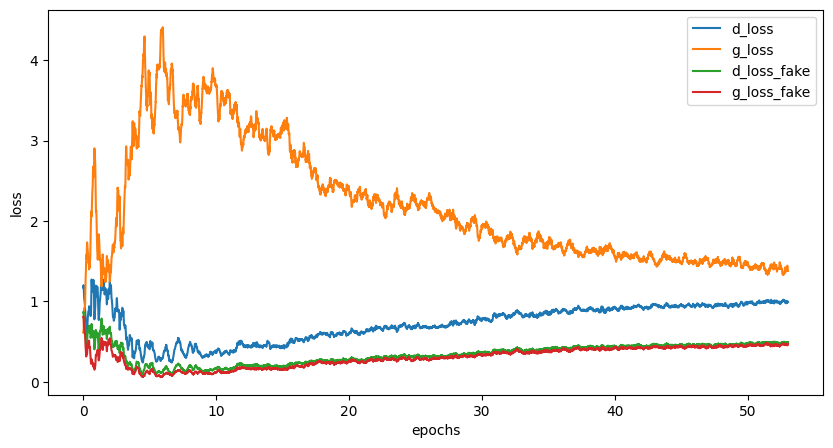

Epoch [54/500], Step[100/469], d_loss: 1.0358, d_loss_fake: 0.4768, g_loss: 1.5306, g_loss_fake: 0.4752, D(x): 0.67, D(G(z)): 0.31
Epoch [54/500], Step[200/469], d_loss: 1.0759, d_loss_fake: 0.5052, g_loss: 1.3164, g_loss_fake: 0.4657, D(x): 0.64, D(G(z)): 0.34
Epoch [54/500], Step[300/469], d_loss: 1.0848, d_loss_fake: 0.6190, g_loss: 1.3834, g_loss_fake: 0.4582, D(x): 0.70, D(G(z)): 0.38
Epoch [54/500], Step[400/469], d_loss: 0.9928, d_loss_fake: 0.5466, g_loss: 1.1682, g_loss_fake: 0.5272, D(x): 0.70, D(G(z)): 0.37


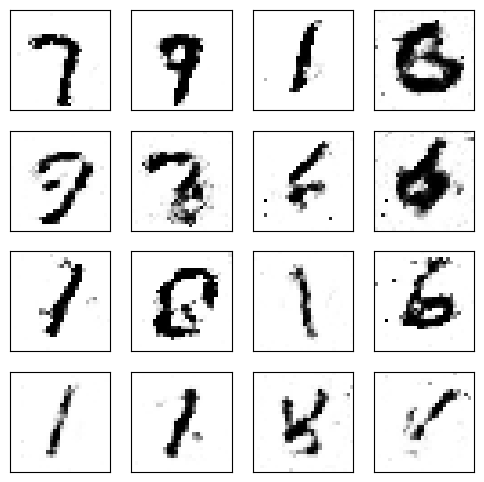

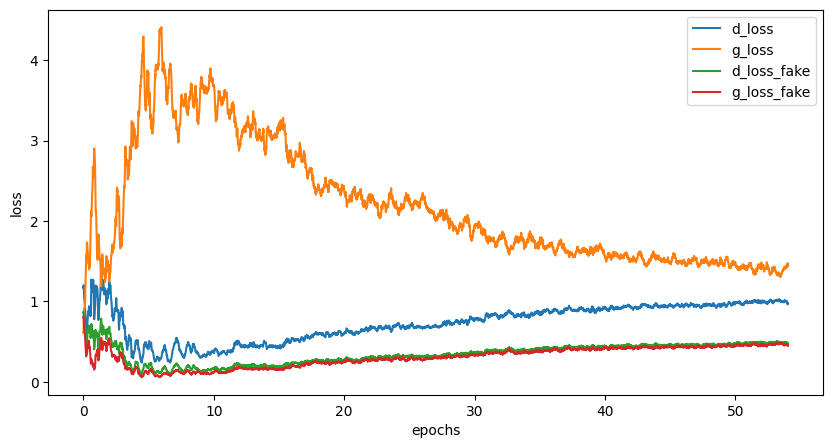

Epoch [55/500], Step[100/469], d_loss: 1.0230, d_loss_fake: 0.4214, g_loss: 1.3977, g_loss_fake: 0.4408, D(x): 0.63, D(G(z)): 0.30
Epoch [55/500], Step[200/469], d_loss: 1.1590, d_loss_fake: 0.6864, g_loss: 1.3543, g_loss_fake: 0.4600, D(x): 0.69, D(G(z)): 0.43
Epoch [55/500], Step[300/469], d_loss: 1.1274, d_loss_fake: 0.5872, g_loss: 1.1261, g_loss_fake: 0.5314, D(x): 0.64, D(G(z)): 0.40
Epoch [55/500], Step[400/469], d_loss: 0.9244, d_loss_fake: 0.4552, g_loss: 1.2881, g_loss_fake: 0.5083, D(x): 0.69, D(G(z)): 0.33


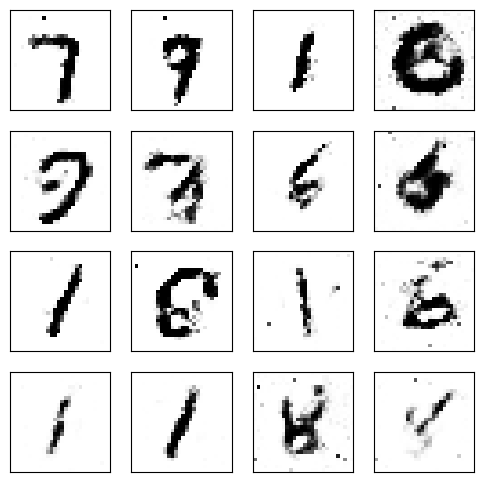

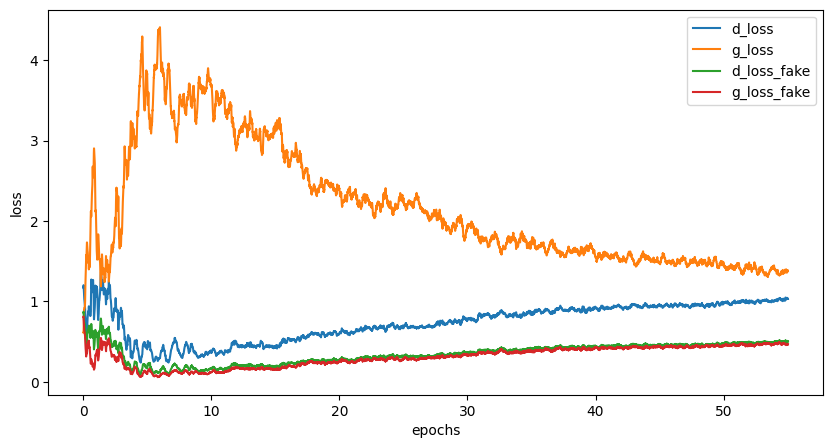

Epoch [56/500], Step[100/469], d_loss: 0.9882, d_loss_fake: 0.4455, g_loss: 1.4608, g_loss_fake: 0.4133, D(x): 0.65, D(G(z)): 0.30
Epoch [56/500], Step[200/469], d_loss: 0.9321, d_loss_fake: 0.3925, g_loss: 1.3084, g_loss_fake: 0.4853, D(x): 0.65, D(G(z)): 0.29
Epoch [56/500], Step[300/469], d_loss: 0.9847, d_loss_fake: 0.4819, g_loss: 1.1950, g_loss_fake: 0.6295, D(x): 0.67, D(G(z)): 0.33
Epoch [56/500], Step[400/469], d_loss: 1.0557, d_loss_fake: 0.3990, g_loss: 1.3011, g_loss_fake: 0.5545, D(x): 0.62, D(G(z)): 0.29


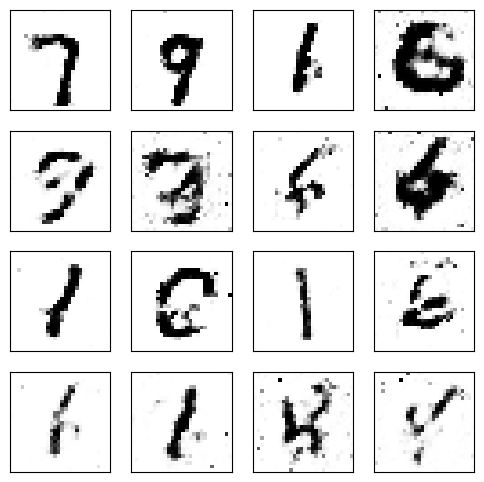

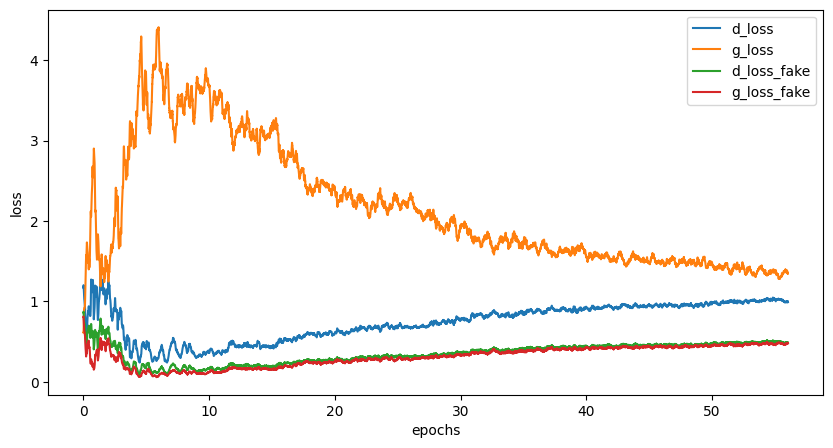

Epoch [57/500], Step[100/469], d_loss: 1.0781, d_loss_fake: 0.5039, g_loss: 1.0145, g_loss_fake: 0.6604, D(x): 0.64, D(G(z)): 0.34
Epoch [57/500], Step[200/469], d_loss: 1.0099, d_loss_fake: 0.4854, g_loss: 1.2597, g_loss_fake: 0.6169, D(x): 0.65, D(G(z)): 0.33
Epoch [57/500], Step[300/469], d_loss: 1.0804, d_loss_fake: 0.5287, g_loss: 1.3395, g_loss_fake: 0.4737, D(x): 0.64, D(G(z)): 0.36
Epoch [57/500], Step[400/469], d_loss: 0.8678, d_loss_fake: 0.4211, g_loss: 1.5001, g_loss_fake: 0.4702, D(x): 0.72, D(G(z)): 0.28


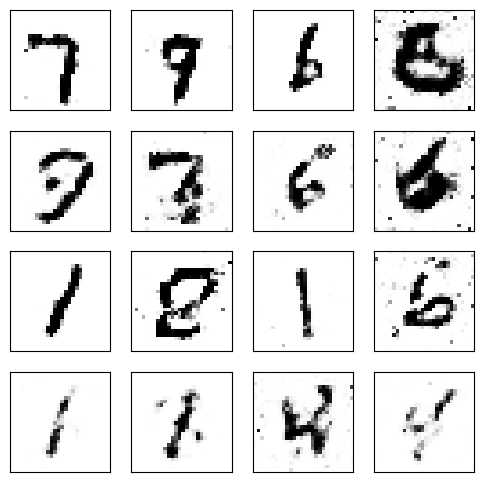

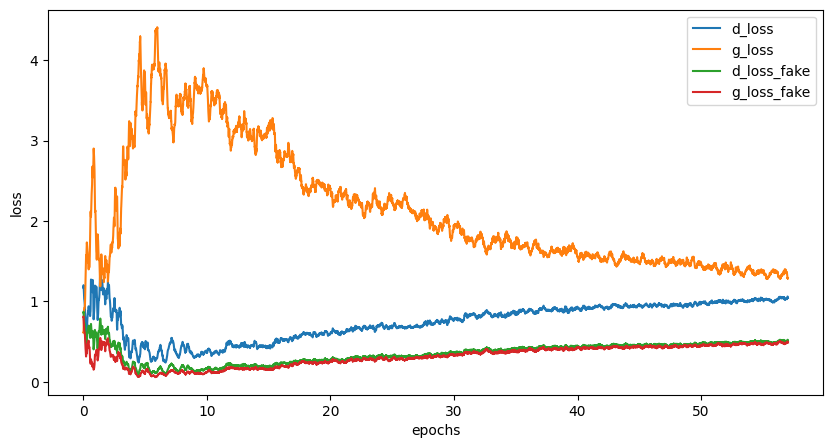

Epoch [58/500], Step[100/469], d_loss: 1.1207, d_loss_fake: 0.5237, g_loss: 1.1208, g_loss_fake: 0.5474, D(x): 0.62, D(G(z)): 0.38
Epoch [58/500], Step[200/469], d_loss: 0.9695, d_loss_fake: 0.4832, g_loss: 1.3226, g_loss_fake: 0.4753, D(x): 0.66, D(G(z)): 0.35
Epoch [58/500], Step[300/469], d_loss: 0.9902, d_loss_fake: 0.5511, g_loss: 1.1508, g_loss_fake: 0.6111, D(x): 0.70, D(G(z)): 0.38
Epoch [58/500], Step[400/469], d_loss: 1.2262, d_loss_fake: 0.6499, g_loss: 1.3819, g_loss_fake: 0.4867, D(x): 0.63, D(G(z)): 0.42


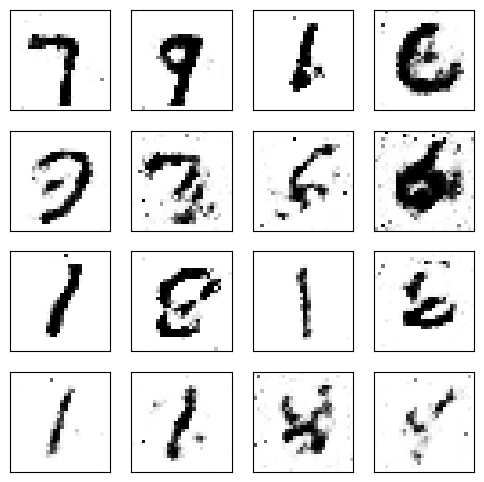

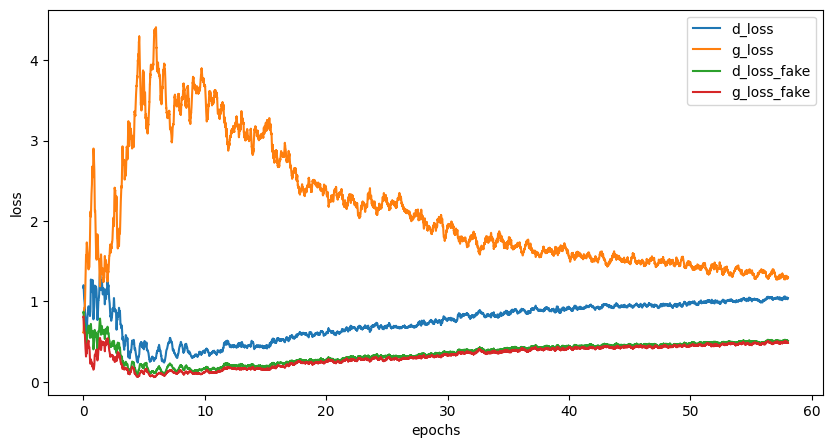

Epoch [59/500], Step[100/469], d_loss: 1.0768, d_loss_fake: 0.5546, g_loss: 1.3301, g_loss_fake: 0.5484, D(x): 0.66, D(G(z)): 0.36
Epoch [59/500], Step[200/469], d_loss: 1.0220, d_loss_fake: 0.4815, g_loss: 1.2424, g_loss_fake: 0.5449, D(x): 0.66, D(G(z)): 0.33
Epoch [59/500], Step[300/469], d_loss: 1.2103, d_loss_fake: 0.6057, g_loss: 1.1600, g_loss_fake: 0.5534, D(x): 0.62, D(G(z)): 0.40
Epoch [59/500], Step[400/469], d_loss: 1.2250, d_loss_fake: 0.5666, g_loss: 1.0565, g_loss_fake: 0.6590, D(x): 0.59, D(G(z)): 0.38


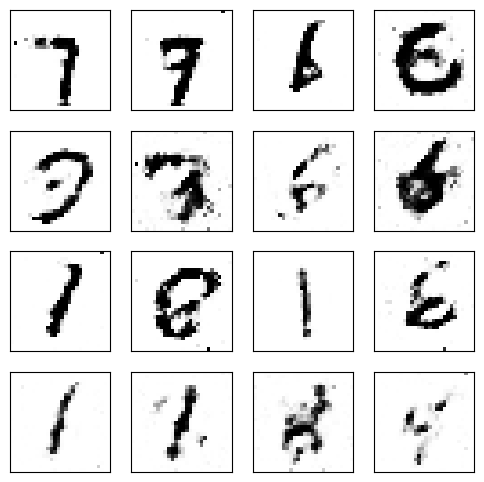

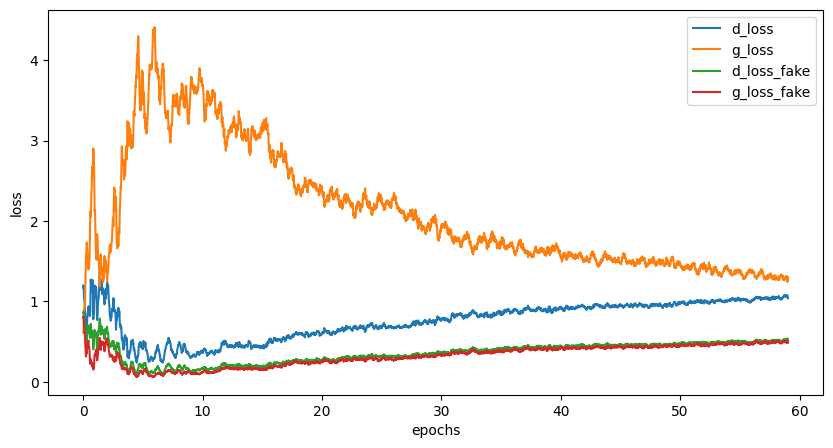

Epoch [60/500], Step[100/469], d_loss: 0.9434, d_loss_fake: 0.4907, g_loss: 1.2489, g_loss_fake: 0.4489, D(x): 0.70, D(G(z)): 0.36
Epoch [60/500], Step[200/469], d_loss: 0.9155, d_loss_fake: 0.4383, g_loss: 1.6292, g_loss_fake: 0.4350, D(x): 0.68, D(G(z)): 0.31
Epoch [60/500], Step[300/469], d_loss: 1.1032, d_loss_fake: 0.6681, g_loss: 1.0628, g_loss_fake: 0.5712, D(x): 0.69, D(G(z)): 0.43
Epoch [60/500], Step[400/469], d_loss: 0.9515, d_loss_fake: 0.4567, g_loss: 1.3302, g_loss_fake: 0.4437, D(x): 0.67, D(G(z)): 0.33


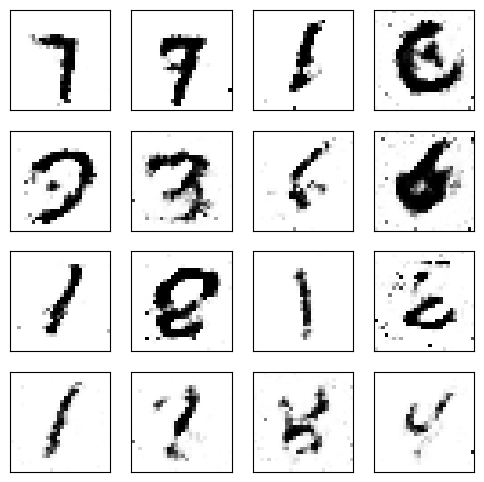

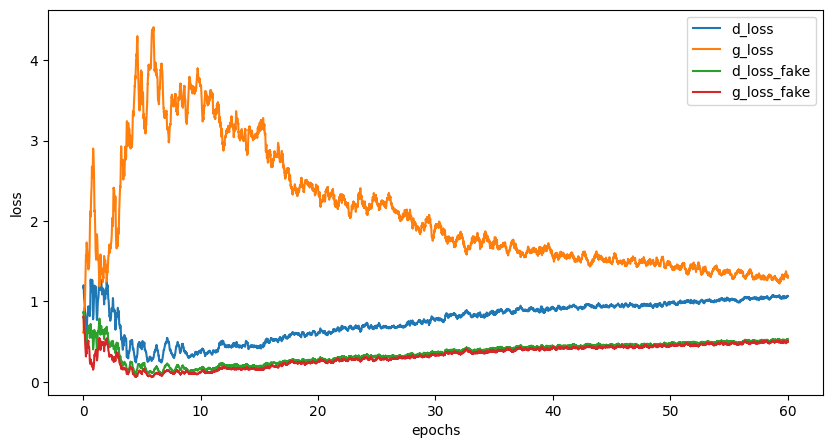

Epoch [61/500], Step[100/469], d_loss: 1.0809, d_loss_fake: 0.4869, g_loss: 1.1867, g_loss_fake: 0.5385, D(x): 0.63, D(G(z)): 0.35
Epoch [61/500], Step[200/469], d_loss: 0.9990, d_loss_fake: 0.4273, g_loss: 1.3511, g_loss_fake: 0.4390, D(x): 0.64, D(G(z)): 0.32
Epoch [61/500], Step[300/469], d_loss: 1.0275, d_loss_fake: 0.4953, g_loss: 1.1561, g_loss_fake: 0.5110, D(x): 0.64, D(G(z)): 0.36
Epoch [61/500], Step[400/469], d_loss: 1.2208, d_loss_fake: 0.6465, g_loss: 1.2186, g_loss_fake: 0.5250, D(x): 0.63, D(G(z)): 0.42


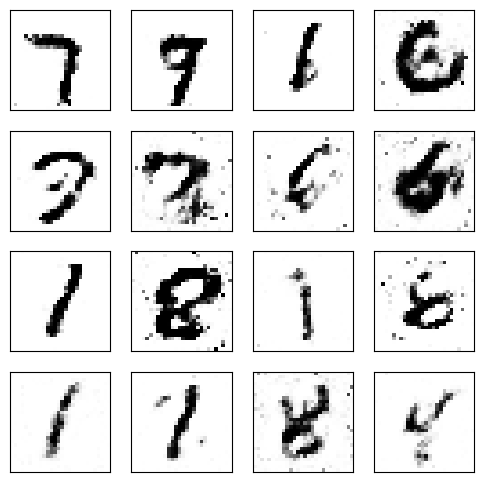

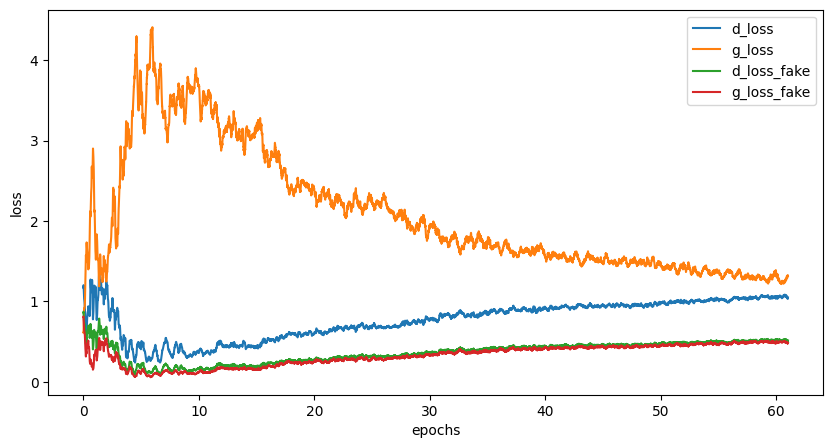

Epoch [62/500], Step[100/469], d_loss: 1.2094, d_loss_fake: 0.6652, g_loss: 1.2253, g_loss_fake: 0.5408, D(x): 0.63, D(G(z)): 0.42
Epoch [62/500], Step[200/469], d_loss: 1.1689, d_loss_fake: 0.5806, g_loss: 1.1315, g_loss_fake: 0.5515, D(x): 0.62, D(G(z)): 0.40
Epoch [62/500], Step[300/469], d_loss: 1.0777, d_loss_fake: 0.5821, g_loss: 1.1235, g_loss_fake: 0.5970, D(x): 0.68, D(G(z)): 0.38
Epoch [62/500], Step[400/469], d_loss: 1.0609, d_loss_fake: 0.5423, g_loss: 1.0392, g_loss_fake: 0.5998, D(x): 0.65, D(G(z)): 0.39


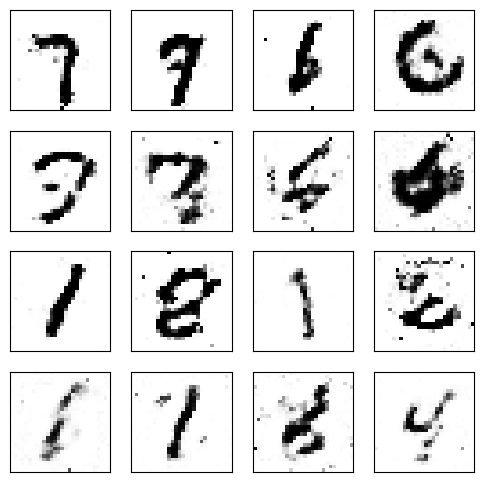

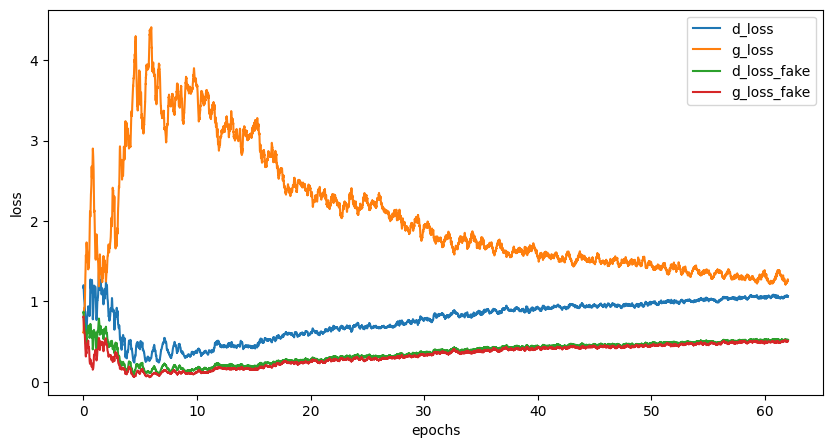

Epoch [63/500], Step[100/469], d_loss: 1.1326, d_loss_fake: 0.5086, g_loss: 1.3633, g_loss_fake: 0.5169, D(x): 0.61, D(G(z)): 0.33
Epoch [63/500], Step[200/469], d_loss: 0.9917, d_loss_fake: 0.5104, g_loss: 1.2886, g_loss_fake: 0.4692, D(x): 0.67, D(G(z)): 0.36
Epoch [63/500], Step[300/469], d_loss: 1.0399, d_loss_fake: 0.4696, g_loss: 1.2830, g_loss_fake: 0.5007, D(x): 0.62, D(G(z)): 0.33
Epoch [63/500], Step[400/469], d_loss: 0.9852, d_loss_fake: 0.5612, g_loss: 1.4364, g_loss_fake: 0.4647, D(x): 0.72, D(G(z)): 0.37


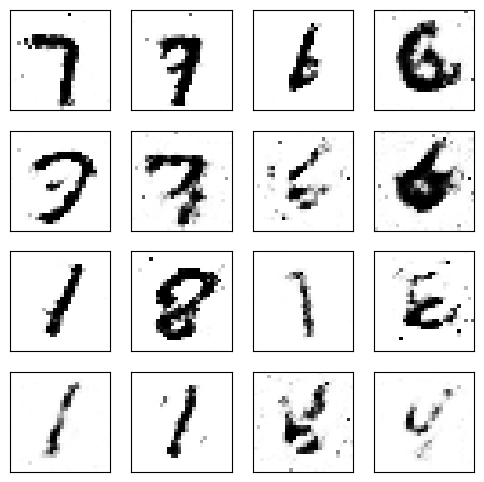

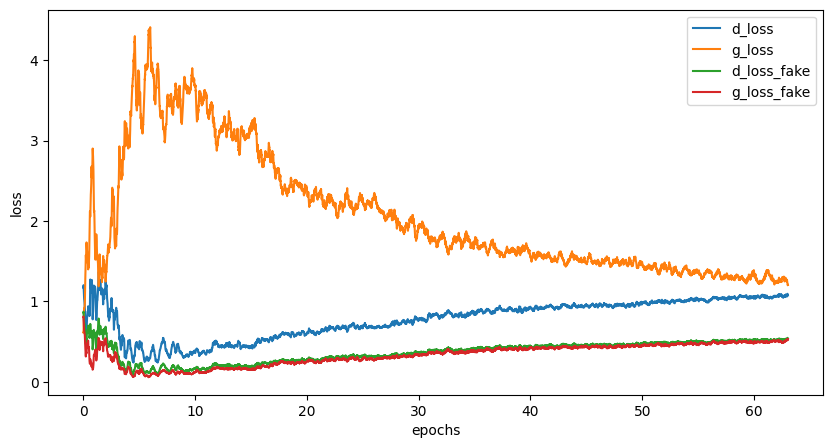

Epoch [64/500], Step[100/469], d_loss: 0.9092, d_loss_fake: 0.4741, g_loss: 1.3086, g_loss_fake: 0.4358, D(x): 0.69, D(G(z)): 0.34
Epoch [64/500], Step[200/469], d_loss: 0.9792, d_loss_fake: 0.4180, g_loss: 1.4344, g_loss_fake: 0.4028, D(x): 0.62, D(G(z)): 0.30
Epoch [64/500], Step[300/469], d_loss: 0.9853, d_loss_fake: 0.4963, g_loss: 1.2246, g_loss_fake: 0.4611, D(x): 0.66, D(G(z)): 0.37
Epoch [64/500], Step[400/469], d_loss: 0.9832, d_loss_fake: 0.4922, g_loss: 1.2319, g_loss_fake: 0.4865, D(x): 0.66, D(G(z)): 0.36


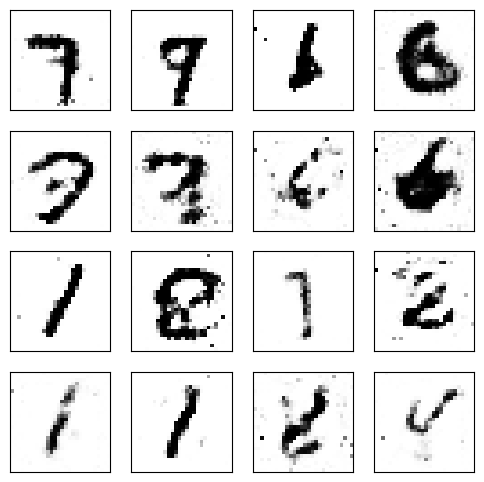

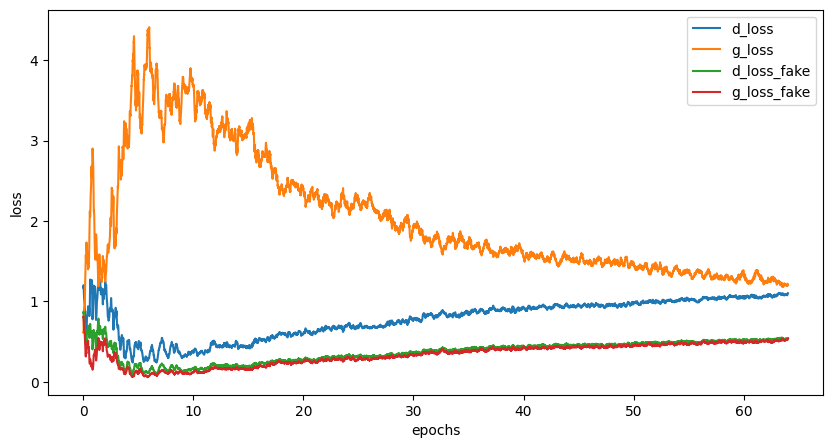

Epoch [65/500], Step[100/469], d_loss: 1.2499, d_loss_fake: 0.4231, g_loss: 1.5202, g_loss_fake: 0.3778, D(x): 0.54, D(G(z)): 0.31
Epoch [65/500], Step[200/469], d_loss: 1.0231, d_loss_fake: 0.5495, g_loss: 1.1747, g_loss_fake: 0.5474, D(x): 0.67, D(G(z)): 0.39
Epoch [65/500], Step[300/469], d_loss: 1.2581, d_loss_fake: 0.5750, g_loss: 1.1209, g_loss_fake: 0.5780, D(x): 0.58, D(G(z)): 0.39
Epoch [65/500], Step[400/469], d_loss: 1.1302, d_loss_fake: 0.5525, g_loss: 1.5318, g_loss_fake: 0.4394, D(x): 0.62, D(G(z)): 0.38


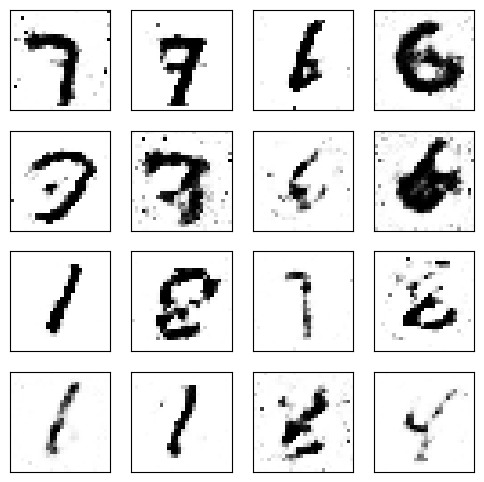

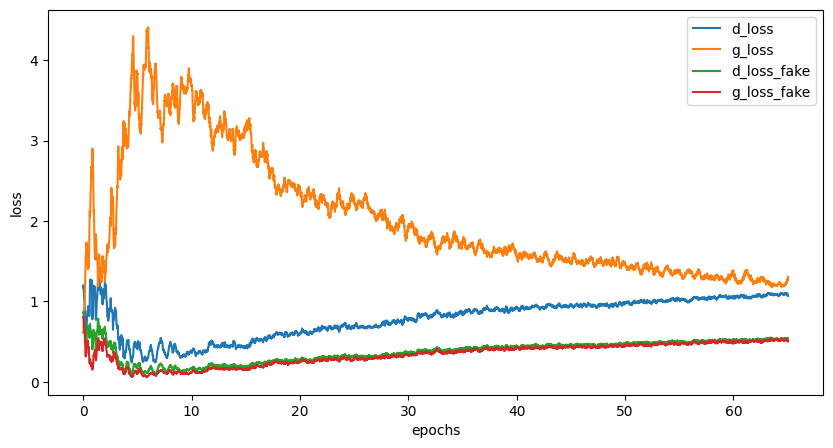

Epoch [66/500], Step[100/469], d_loss: 1.0294, d_loss_fake: 0.5002, g_loss: 1.2092, g_loss_fake: 0.4893, D(x): 0.63, D(G(z)): 0.36
Epoch [66/500], Step[200/469], d_loss: 1.0693, d_loss_fake: 0.4330, g_loss: 1.3360, g_loss_fake: 0.4821, D(x): 0.61, D(G(z)): 0.29
Epoch [66/500], Step[300/469], d_loss: 1.0116, d_loss_fake: 0.4641, g_loss: 1.4573, g_loss_fake: 0.3829, D(x): 0.64, D(G(z)): 0.33
Epoch [66/500], Step[400/469], d_loss: 1.1379, d_loss_fake: 0.5623, g_loss: 1.2707, g_loss_fake: 0.5415, D(x): 0.63, D(G(z)): 0.38


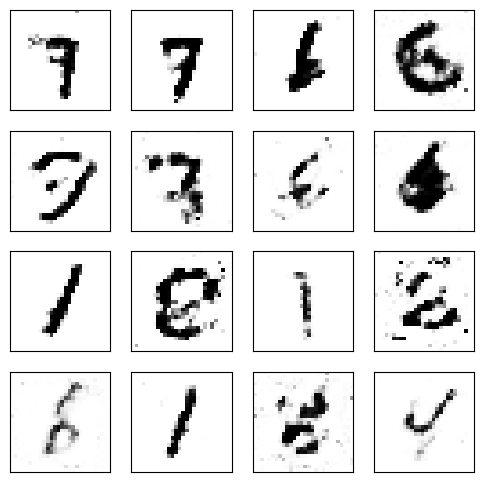

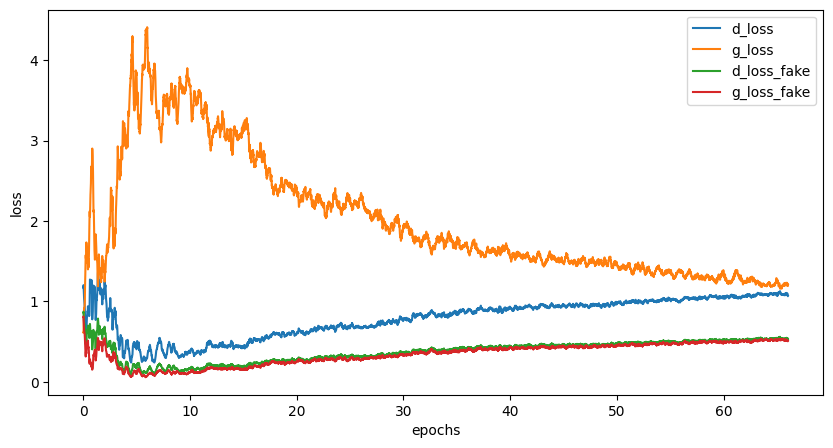

Epoch [67/500], Step[100/469], d_loss: 1.0410, d_loss_fake: 0.5270, g_loss: 1.1021, g_loss_fake: 0.5400, D(x): 0.65, D(G(z)): 0.38
Epoch [67/500], Step[200/469], d_loss: 1.1839, d_loss_fake: 0.6931, g_loss: 1.0137, g_loss_fake: 0.5687, D(x): 0.67, D(G(z)): 0.46
Epoch [67/500], Step[300/469], d_loss: 1.1663, d_loss_fake: 0.4739, g_loss: 1.2557, g_loss_fake: 0.4593, D(x): 0.56, D(G(z)): 0.35
Epoch [67/500], Step[400/469], d_loss: 1.0577, d_loss_fake: 0.4150, g_loss: 1.3875, g_loss_fake: 0.4295, D(x): 0.57, D(G(z)): 0.31


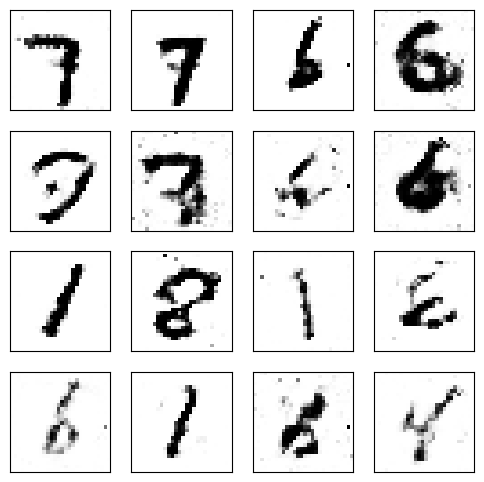

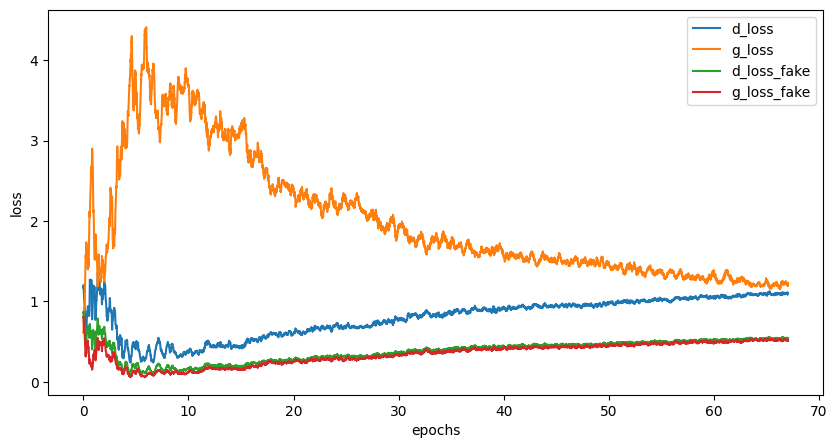

Epoch [68/500], Step[100/469], d_loss: 1.1924, d_loss_fake: 0.5160, g_loss: 1.2178, g_loss_fake: 0.4876, D(x): 0.57, D(G(z)): 0.36
Epoch [68/500], Step[200/469], d_loss: 1.0534, d_loss_fake: 0.4481, g_loss: 1.2759, g_loss_fake: 0.4177, D(x): 0.59, D(G(z)): 0.34
Epoch [68/500], Step[300/469], d_loss: 1.0313, d_loss_fake: 0.4975, g_loss: 1.3535, g_loss_fake: 0.5168, D(x): 0.66, D(G(z)): 0.34
Epoch [68/500], Step[400/469], d_loss: 1.3283, d_loss_fake: 0.6300, g_loss: 1.2192, g_loss_fake: 0.4628, D(x): 0.57, D(G(z)): 0.39


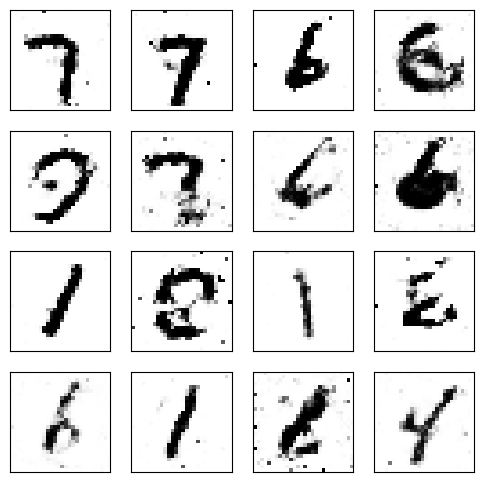

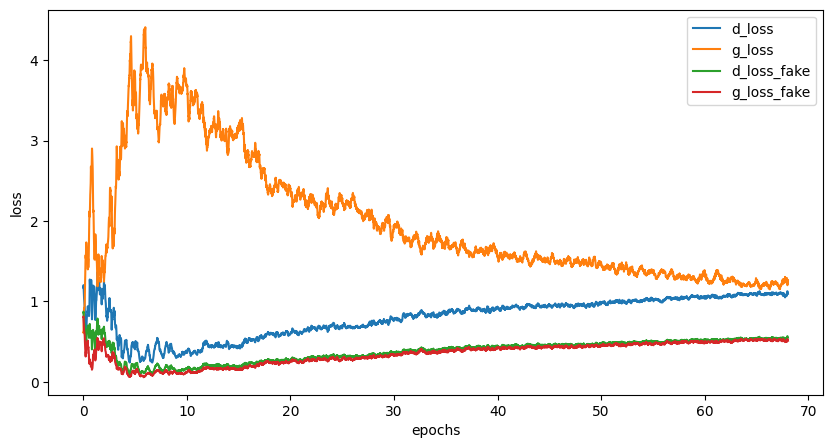

Epoch [69/500], Step[100/469], d_loss: 1.0928, d_loss_fake: 0.5544, g_loss: 1.2301, g_loss_fake: 0.4826, D(x): 0.63, D(G(z)): 0.38
Epoch [69/500], Step[200/469], d_loss: 1.0600, d_loss_fake: 0.5266, g_loss: 1.0515, g_loss_fake: 0.5594, D(x): 0.64, D(G(z)): 0.38
Epoch [69/500], Step[300/469], d_loss: 1.0994, d_loss_fake: 0.5403, g_loss: 1.0943, g_loss_fake: 0.5098, D(x): 0.62, D(G(z)): 0.38
Epoch [69/500], Step[400/469], d_loss: 1.0388, d_loss_fake: 0.5675, g_loss: 1.3647, g_loss_fake: 0.4668, D(x): 0.67, D(G(z)): 0.37


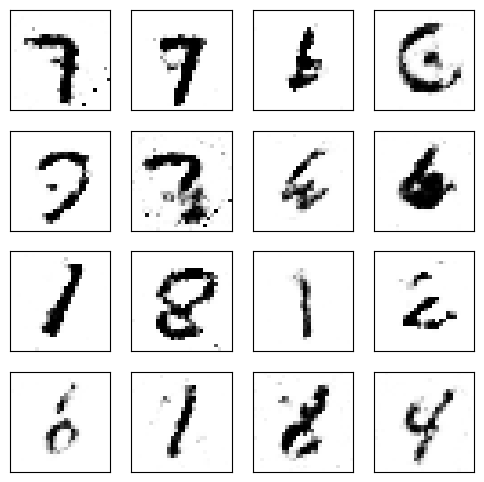

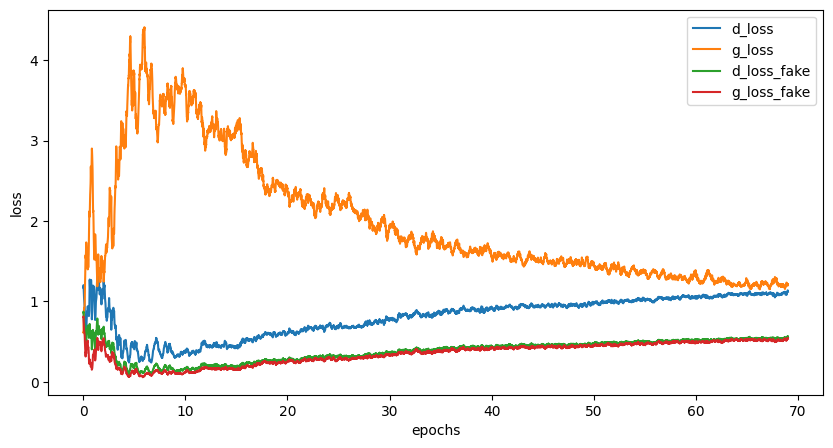

Epoch [70/500], Step[100/469], d_loss: 1.1414, d_loss_fake: 0.5750, g_loss: 1.1676, g_loss_fake: 0.4938, D(x): 0.63, D(G(z)): 0.40
Epoch [70/500], Step[200/469], d_loss: 1.0650, d_loss_fake: 0.6126, g_loss: 1.1210, g_loss_fake: 0.5509, D(x): 0.69, D(G(z)): 0.41
Epoch [70/500], Step[300/469], d_loss: 0.9255, d_loss_fake: 0.4236, g_loss: 1.0997, g_loss_fake: 0.5491, D(x): 0.65, D(G(z)): 0.33
Epoch [70/500], Step[400/469], d_loss: 0.9720, d_loss_fake: 0.3935, g_loss: 1.3623, g_loss_fake: 0.4408, D(x): 0.62, D(G(z)): 0.29


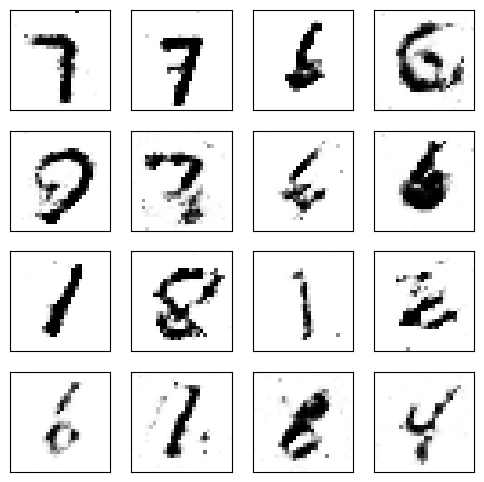

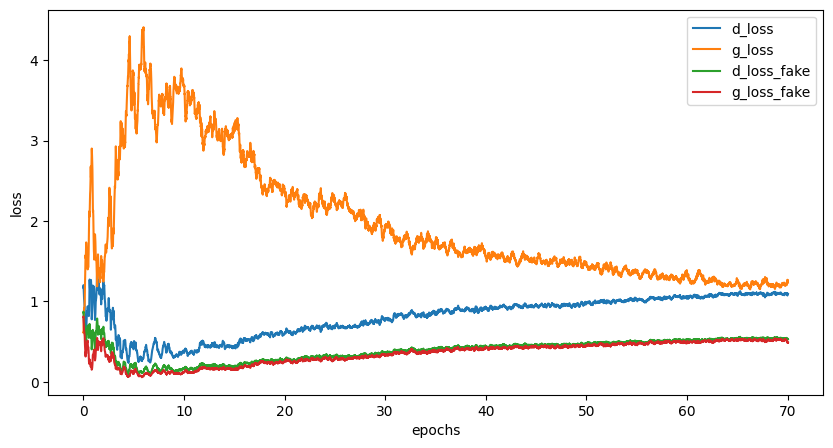

Epoch [71/500], Step[100/469], d_loss: 1.0397, d_loss_fake: 0.4637, g_loss: 1.2459, g_loss_fake: 0.4489, D(x): 0.62, D(G(z)): 0.34
Epoch [71/500], Step[200/469], d_loss: 1.0853, d_loss_fake: 0.4646, g_loss: 1.2573, g_loss_fake: 0.5029, D(x): 0.60, D(G(z)): 0.34
Epoch [71/500], Step[300/469], d_loss: 1.0727, d_loss_fake: 0.6624, g_loss: 1.1431, g_loss_fake: 0.5611, D(x): 0.72, D(G(z)): 0.44
Epoch [71/500], Step[400/469], d_loss: 1.1127, d_loss_fake: 0.5507, g_loss: 1.0408, g_loss_fake: 0.5649, D(x): 0.61, D(G(z)): 0.39


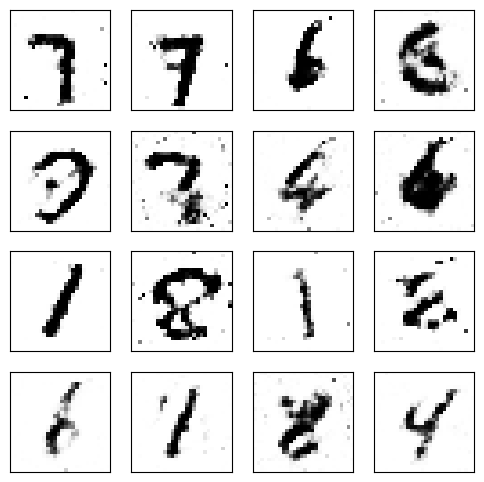

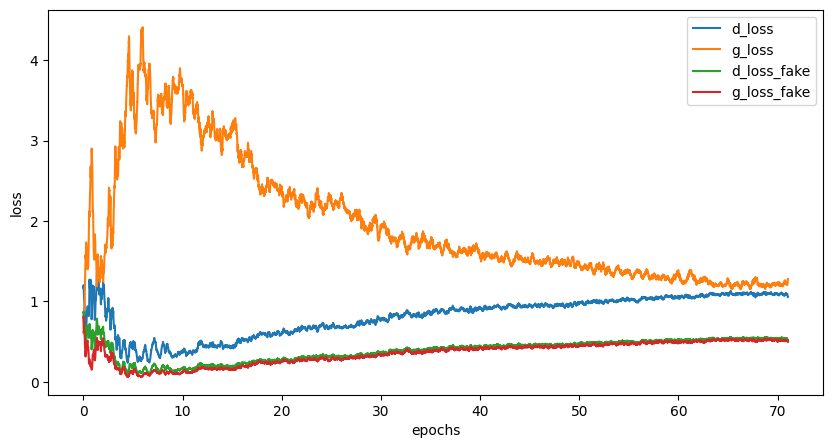

Epoch [72/500], Step[100/469], d_loss: 0.9283, d_loss_fake: 0.3622, g_loss: 1.4320, g_loss_fake: 0.4530, D(x): 0.63, D(G(z)): 0.27
Epoch [72/500], Step[200/469], d_loss: 1.0612, d_loss_fake: 0.4325, g_loss: 1.3705, g_loss_fake: 0.4629, D(x): 0.61, D(G(z)): 0.31
Epoch [72/500], Step[300/469], d_loss: 1.0711, d_loss_fake: 0.5180, g_loss: 1.2235, g_loss_fake: 0.5709, D(x): 0.63, D(G(z)): 0.36
Epoch [72/500], Step[400/469], d_loss: 1.1173, d_loss_fake: 0.4931, g_loss: 1.3310, g_loss_fake: 0.4480, D(x): 0.60, D(G(z)): 0.35


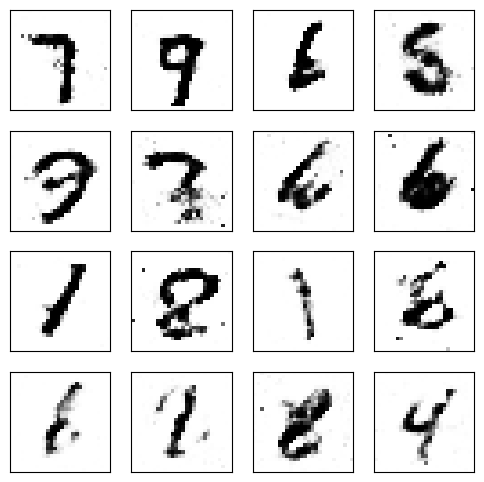

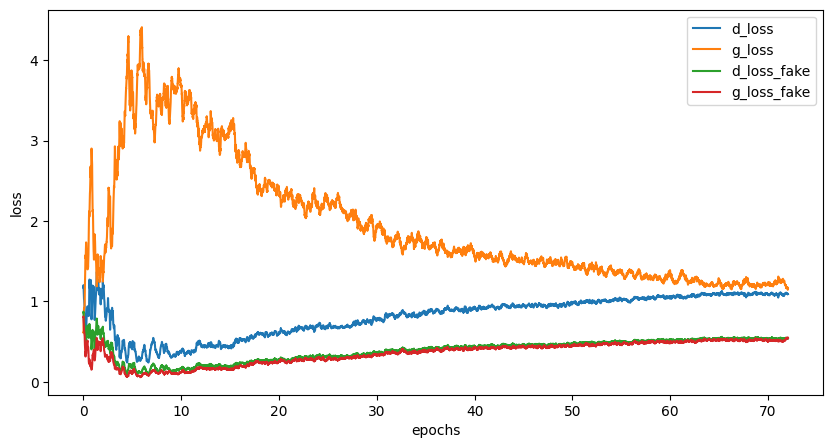

Epoch [73/500], Step[100/469], d_loss: 0.9856, d_loss_fake: 0.4490, g_loss: 1.3963, g_loss_fake: 0.4699, D(x): 0.66, D(G(z)): 0.31
Epoch [73/500], Step[200/469], d_loss: 1.1812, d_loss_fake: 0.5185, g_loss: 1.0391, g_loss_fake: 0.5421, D(x): 0.57, D(G(z)): 0.38
Epoch [73/500], Step[300/469], d_loss: 1.2098, d_loss_fake: 0.5965, g_loss: 1.1518, g_loss_fake: 0.5081, D(x): 0.59, D(G(z)): 0.41
Epoch [73/500], Step[400/469], d_loss: 0.9802, d_loss_fake: 0.5222, g_loss: 1.5160, g_loss_fake: 0.3961, D(x): 0.69, D(G(z)): 0.36


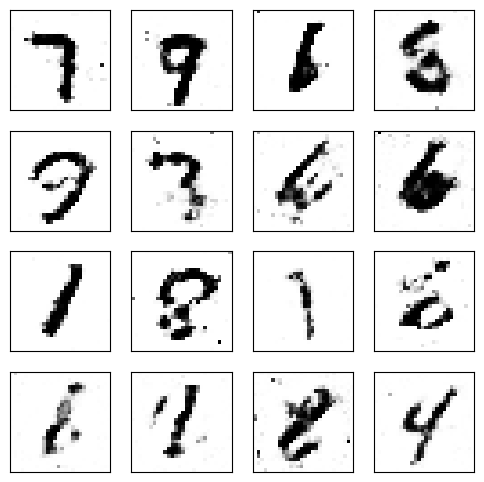

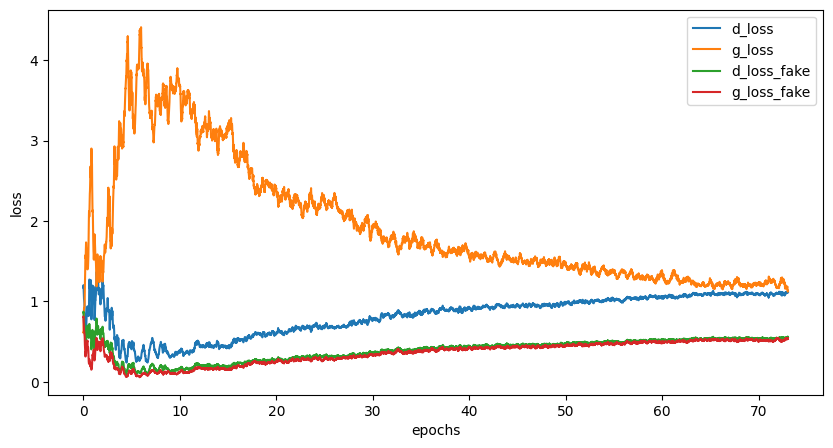

Epoch [74/500], Step[100/469], d_loss: 1.2042, d_loss_fake: 0.6919, g_loss: 1.0745, g_loss_fake: 0.5396, D(x): 0.64, D(G(z)): 0.45
Epoch [74/500], Step[200/469], d_loss: 1.1167, d_loss_fake: 0.5590, g_loss: 1.2182, g_loss_fake: 0.5487, D(x): 0.63, D(G(z)): 0.38
Epoch [74/500], Step[300/469], d_loss: 1.2672, d_loss_fake: 0.5211, g_loss: 1.4139, g_loss_fake: 0.4283, D(x): 0.57, D(G(z)): 0.36
Epoch [74/500], Step[400/469], d_loss: 1.1913, d_loss_fake: 0.5440, g_loss: 1.2054, g_loss_fake: 0.4565, D(x): 0.57, D(G(z)): 0.39


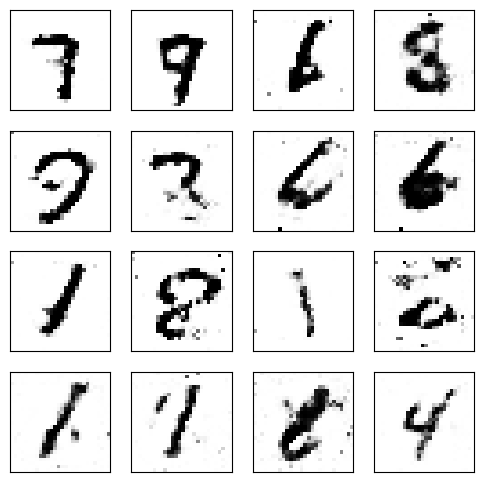

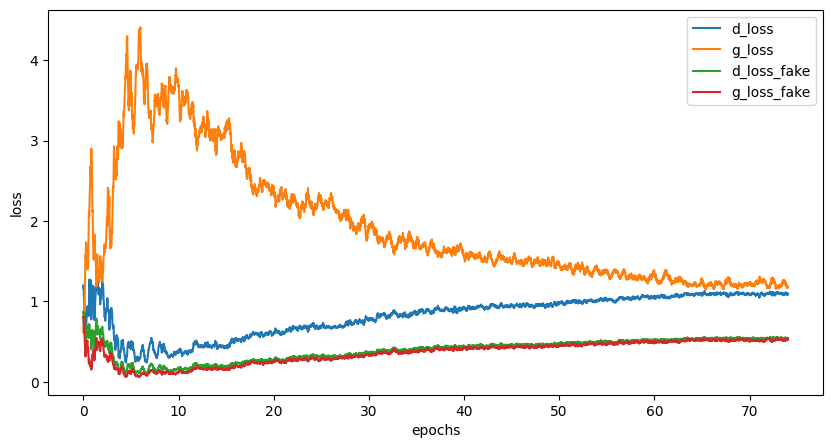

Epoch [75/500], Step[100/469], d_loss: 1.2117, d_loss_fake: 0.6837, g_loss: 1.2945, g_loss_fake: 0.4959, D(x): 0.64, D(G(z)): 0.43
Epoch [75/500], Step[200/469], d_loss: 1.1094, d_loss_fake: 0.5379, g_loss: 1.2358, g_loss_fake: 0.4868, D(x): 0.63, D(G(z)): 0.36
Epoch [75/500], Step[300/469], d_loss: 1.2048, d_loss_fake: 0.5649, g_loss: 1.1097, g_loss_fake: 0.6437, D(x): 0.58, D(G(z)): 0.38
Epoch [75/500], Step[400/469], d_loss: 1.1075, d_loss_fake: 0.5137, g_loss: 1.0926, g_loss_fake: 0.5773, D(x): 0.61, D(G(z)): 0.37


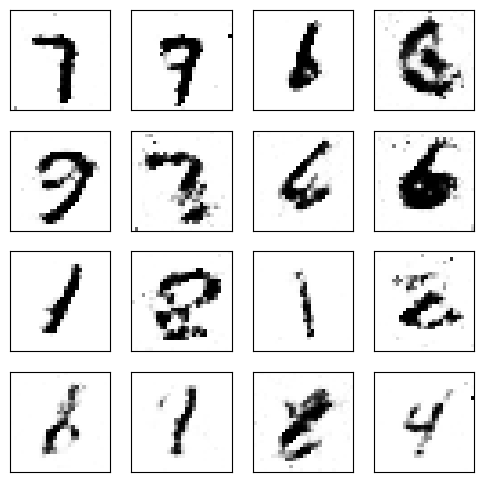

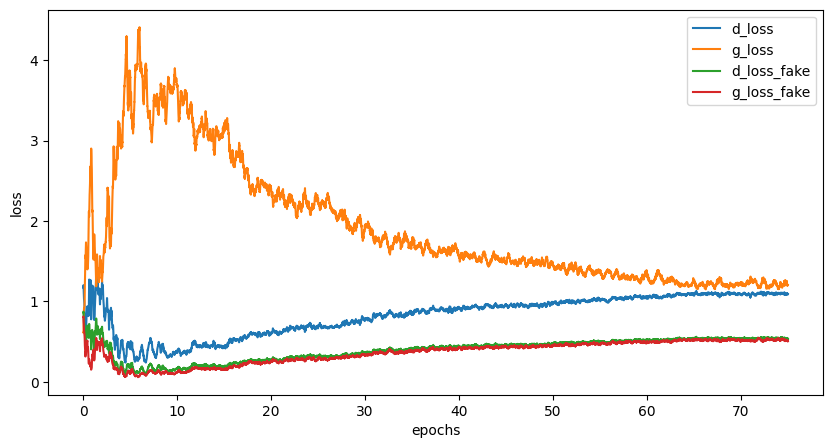

Epoch [76/500], Step[100/469], d_loss: 1.0070, d_loss_fake: 0.5564, g_loss: 1.1746, g_loss_fake: 0.5169, D(x): 0.68, D(G(z)): 0.39
Epoch [76/500], Step[200/469], d_loss: 1.0720, d_loss_fake: 0.5196, g_loss: 1.2548, g_loss_fake: 0.4569, D(x): 0.63, D(G(z)): 0.36
Epoch [76/500], Step[300/469], d_loss: 1.0225, d_loss_fake: 0.4998, g_loss: 1.1945, g_loss_fake: 0.5253, D(x): 0.66, D(G(z)): 0.36
Epoch [76/500], Step[400/469], d_loss: 1.1502, d_loss_fake: 0.5134, g_loss: 1.2086, g_loss_fake: 0.5395, D(x): 0.59, D(G(z)): 0.36


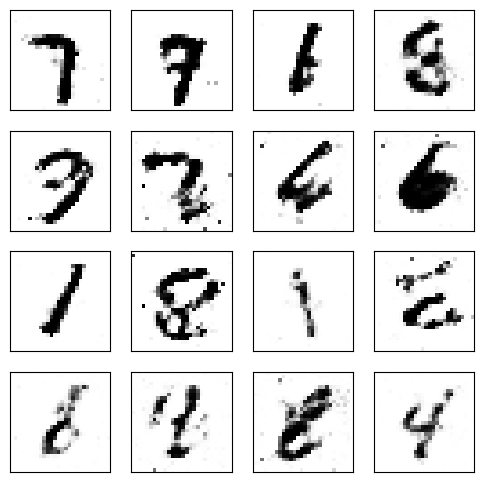

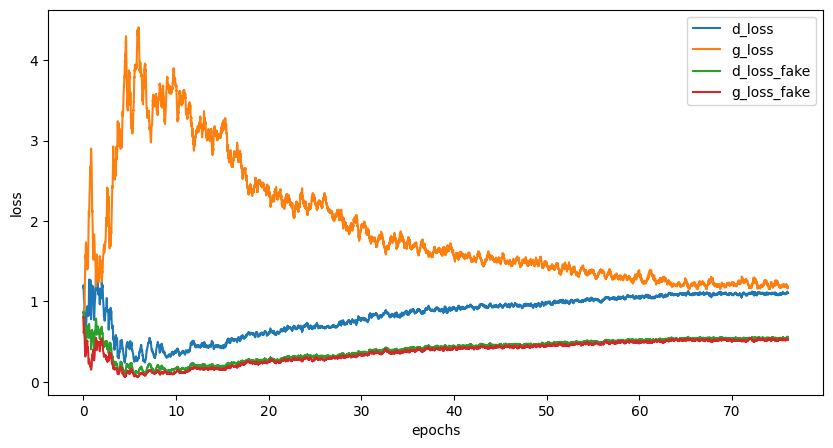

Epoch [77/500], Step[100/469], d_loss: 1.0194, d_loss_fake: 0.4903, g_loss: 1.3361, g_loss_fake: 0.4975, D(x): 0.65, D(G(z)): 0.35
Epoch [77/500], Step[200/469], d_loss: 0.8986, d_loss_fake: 0.4199, g_loss: 1.2137, g_loss_fake: 0.5421, D(x): 0.68, D(G(z)): 0.31
Epoch [77/500], Step[300/469], d_loss: 0.9895, d_loss_fake: 0.4191, g_loss: 1.3430, g_loss_fake: 0.4690, D(x): 0.63, D(G(z)): 0.30
Epoch [77/500], Step[400/469], d_loss: 1.0931, d_loss_fake: 0.5494, g_loss: 0.9722, g_loss_fake: 0.6442, D(x): 0.64, D(G(z)): 0.39


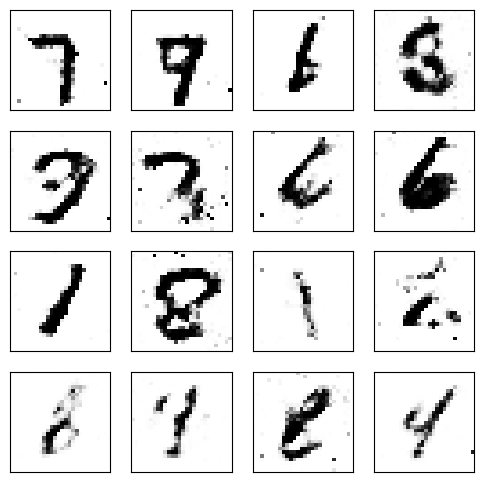

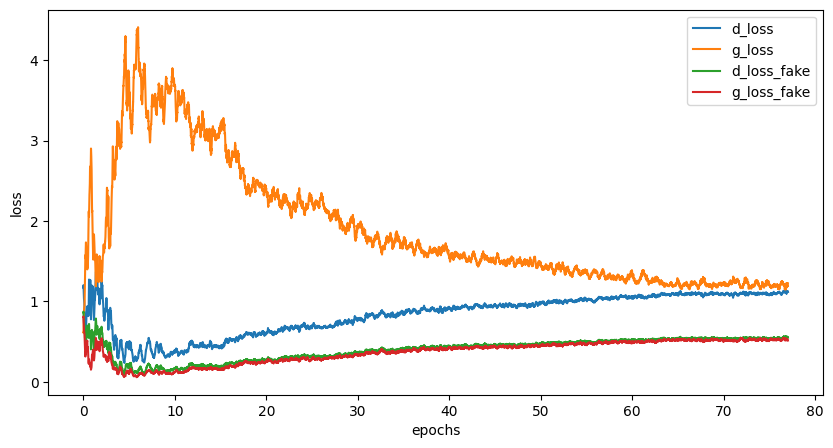

Epoch [78/500], Step[100/469], d_loss: 1.1871, d_loss_fake: 0.6047, g_loss: 1.1575, g_loss_fake: 0.4943, D(x): 0.61, D(G(z)): 0.40
Epoch [78/500], Step[200/469], d_loss: 1.1508, d_loss_fake: 0.5903, g_loss: 1.2064, g_loss_fake: 0.4650, D(x): 0.63, D(G(z)): 0.40
Epoch [78/500], Step[300/469], d_loss: 1.0336, d_loss_fake: 0.5050, g_loss: 1.1712, g_loss_fake: 0.4760, D(x): 0.63, D(G(z)): 0.37
Epoch [78/500], Step[400/469], d_loss: 1.0696, d_loss_fake: 0.4822, g_loss: 1.1751, g_loss_fake: 0.4891, D(x): 0.60, D(G(z)): 0.35


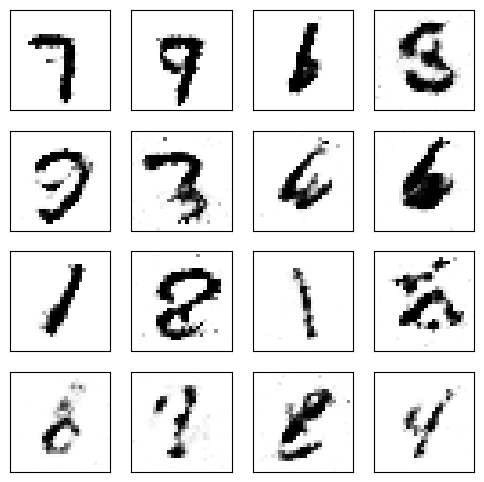

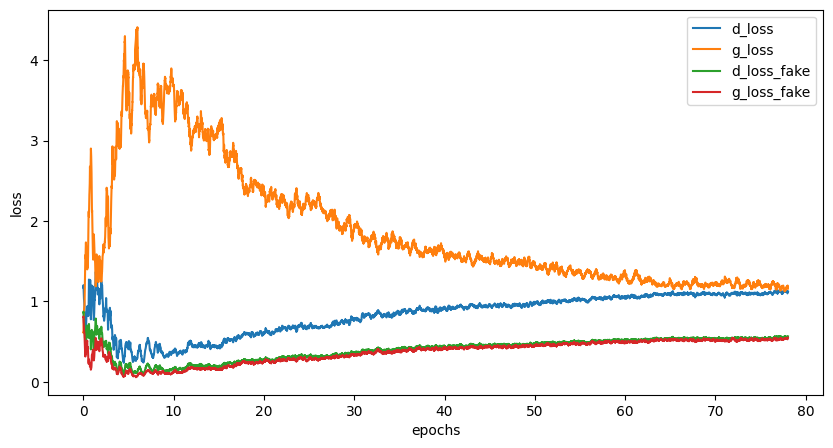

Epoch [79/500], Step[100/469], d_loss: 0.9751, d_loss_fake: 0.4868, g_loss: 1.4618, g_loss_fake: 0.4281, D(x): 0.66, D(G(z)): 0.34
Epoch [79/500], Step[200/469], d_loss: 1.0556, d_loss_fake: 0.5729, g_loss: 0.9789, g_loss_fake: 0.7022, D(x): 0.67, D(G(z)): 0.37
Epoch [79/500], Step[300/469], d_loss: 0.9464, d_loss_fake: 0.4904, g_loss: 1.3753, g_loss_fake: 0.4380, D(x): 0.68, D(G(z)): 0.35
Epoch [79/500], Step[400/469], d_loss: 1.1444, d_loss_fake: 0.5415, g_loss: 1.3866, g_loss_fake: 0.4421, D(x): 0.61, D(G(z)): 0.37


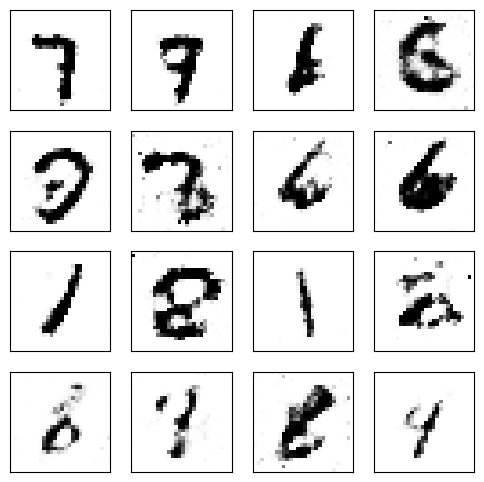

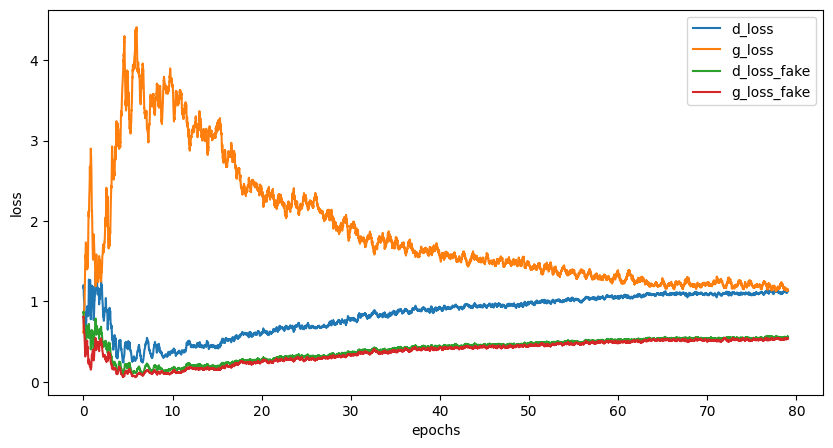

Epoch [80/500], Step[100/469], d_loss: 1.1765, d_loss_fake: 0.4920, g_loss: 1.2068, g_loss_fake: 0.4712, D(x): 0.56, D(G(z)): 0.35
Epoch [80/500], Step[200/469], d_loss: 1.1548, d_loss_fake: 0.4650, g_loss: 1.1222, g_loss_fake: 0.5059, D(x): 0.55, D(G(z)): 0.34
Epoch [80/500], Step[300/469], d_loss: 1.1610, d_loss_fake: 0.5150, g_loss: 1.0092, g_loss_fake: 0.6009, D(x): 0.57, D(G(z)): 0.37
Epoch [80/500], Step[400/469], d_loss: 1.0400, d_loss_fake: 0.4753, g_loss: 1.2824, g_loss_fake: 0.5284, D(x): 0.62, D(G(z)): 0.33


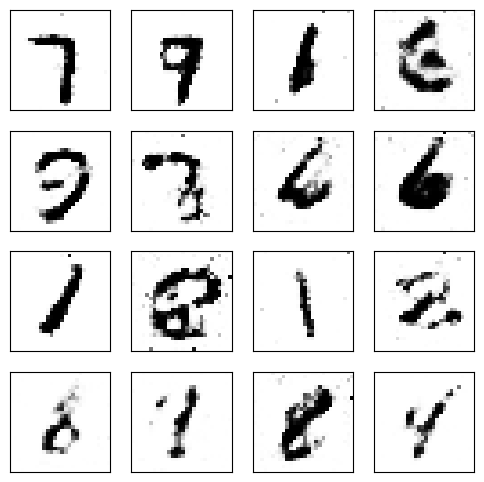

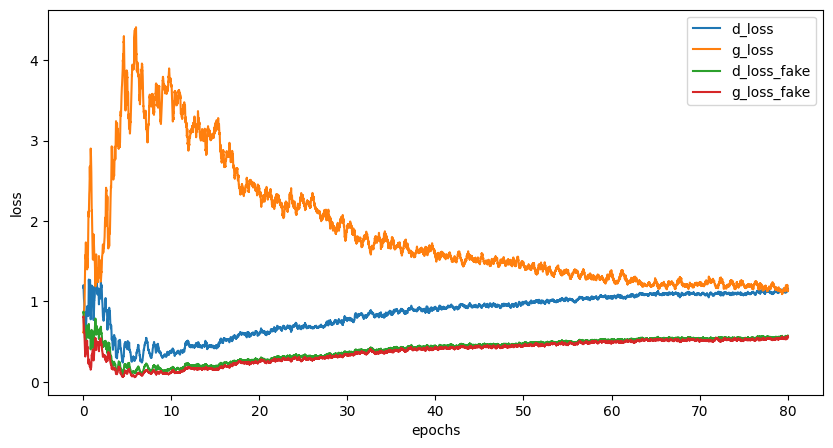

Epoch [81/500], Step[100/469], d_loss: 1.1266, d_loss_fake: 0.5448, g_loss: 1.0232, g_loss_fake: 0.6102, D(x): 0.60, D(G(z)): 0.38
Epoch [81/500], Step[200/469], d_loss: 1.2262, d_loss_fake: 0.6517, g_loss: 1.1484, g_loss_fake: 0.5842, D(x): 0.60, D(G(z)): 0.43
Epoch [81/500], Step[300/469], d_loss: 1.2929, d_loss_fake: 0.6309, g_loss: 0.8852, g_loss_fake: 0.6582, D(x): 0.55, D(G(z)): 0.43
Epoch [81/500], Step[400/469], d_loss: 1.1817, d_loss_fake: 0.5748, g_loss: 1.0242, g_loss_fake: 0.5690, D(x): 0.59, D(G(z)): 0.40


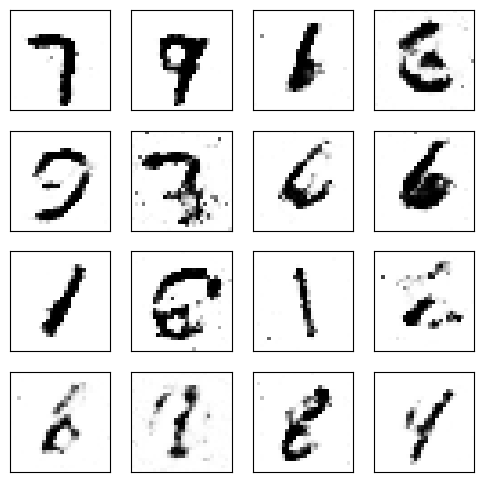

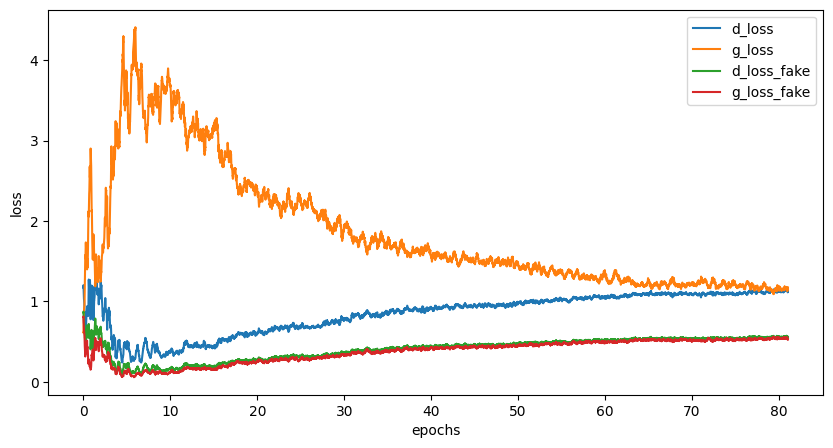

Epoch [82/500], Step[100/469], d_loss: 1.0329, d_loss_fake: 0.4957, g_loss: 1.2796, g_loss_fake: 0.4554, D(x): 0.64, D(G(z)): 0.35
Epoch [82/500], Step[200/469], d_loss: 1.1337, d_loss_fake: 0.6469, g_loss: 0.9404, g_loss_fake: 0.6686, D(x): 0.65, D(G(z)): 0.44
Epoch [82/500], Step[300/469], d_loss: 1.1548, d_loss_fake: 0.6248, g_loss: 0.9325, g_loss_fake: 0.6700, D(x): 0.63, D(G(z)): 0.43
Epoch [82/500], Step[400/469], d_loss: 1.2968, d_loss_fake: 0.6255, g_loss: 0.9833, g_loss_fake: 0.6206, D(x): 0.56, D(G(z)): 0.41


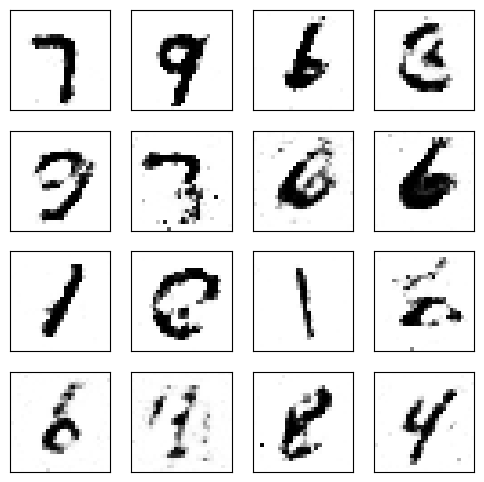

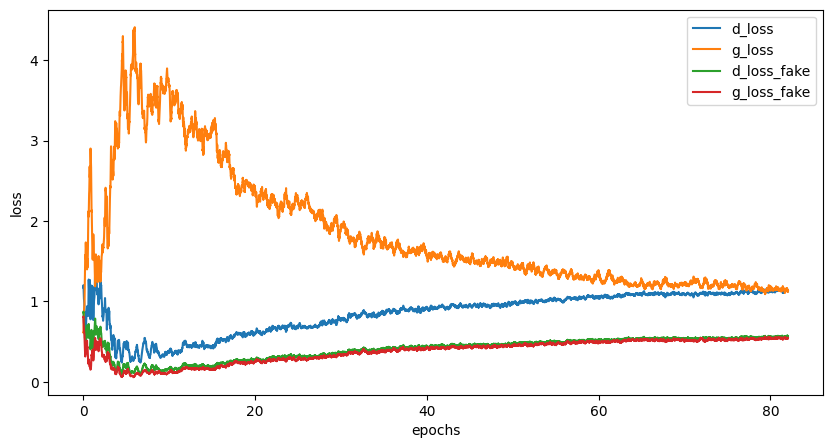

Epoch [83/500], Step[100/469], d_loss: 1.0583, d_loss_fake: 0.5100, g_loss: 1.1166, g_loss_fake: 0.4950, D(x): 0.63, D(G(z)): 0.36
Epoch [83/500], Step[200/469], d_loss: 1.1238, d_loss_fake: 0.5752, g_loss: 1.0871, g_loss_fake: 0.5313, D(x): 0.62, D(G(z)): 0.41
Epoch [83/500], Step[300/469], d_loss: 0.9854, d_loss_fake: 0.5216, g_loss: 1.1318, g_loss_fake: 0.5090, D(x): 0.67, D(G(z)): 0.38
Epoch [83/500], Step[400/469], d_loss: 0.9725, d_loss_fake: 0.4985, g_loss: 1.5128, g_loss_fake: 0.4469, D(x): 0.67, D(G(z)): 0.34


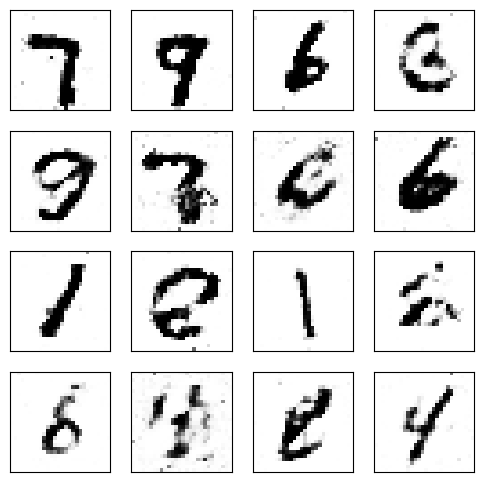

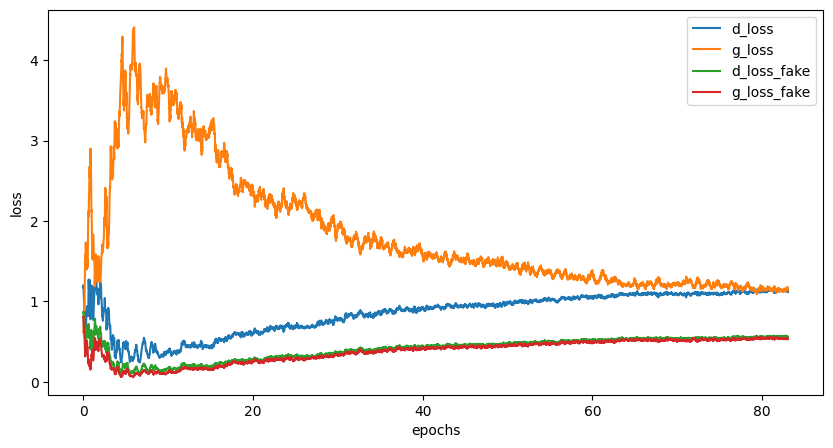

Epoch [84/500], Step[100/469], d_loss: 1.2273, d_loss_fake: 0.5816, g_loss: 1.0154, g_loss_fake: 0.6021, D(x): 0.58, D(G(z)): 0.41
Epoch [84/500], Step[200/469], d_loss: 1.1868, d_loss_fake: 0.5720, g_loss: 1.0143, g_loss_fake: 0.5767, D(x): 0.58, D(G(z)): 0.41
Epoch [84/500], Step[300/469], d_loss: 1.2189, d_loss_fake: 0.6410, g_loss: 0.9889, g_loss_fake: 0.6363, D(x): 0.61, D(G(z)): 0.44
Epoch [84/500], Step[400/469], d_loss: 1.0183, d_loss_fake: 0.4840, g_loss: 1.1162, g_loss_fake: 0.5433, D(x): 0.63, D(G(z)): 0.35


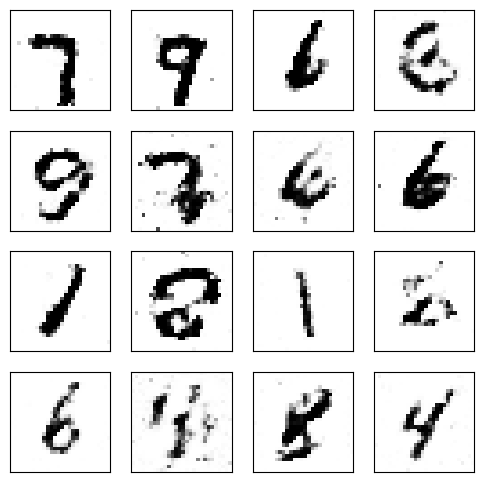

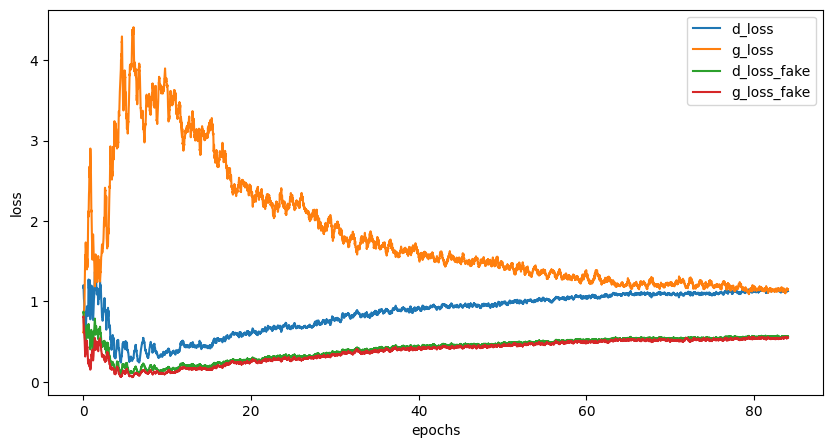

Epoch [85/500], Step[100/469], d_loss: 1.2162, d_loss_fake: 0.6019, g_loss: 1.0777, g_loss_fake: 0.5556, D(x): 0.59, D(G(z)): 0.42
Epoch [85/500], Step[200/469], d_loss: 1.0976, d_loss_fake: 0.5703, g_loss: 1.1153, g_loss_fake: 0.5729, D(x): 0.64, D(G(z)): 0.39
Epoch [85/500], Step[300/469], d_loss: 1.0101, d_loss_fake: 0.5163, g_loss: 1.0462, g_loss_fake: 0.5518, D(x): 0.65, D(G(z)): 0.36
Epoch [85/500], Step[400/469], d_loss: 1.1166, d_loss_fake: 0.6479, g_loss: 1.2398, g_loss_fake: 0.5060, D(x): 0.67, D(G(z)): 0.42


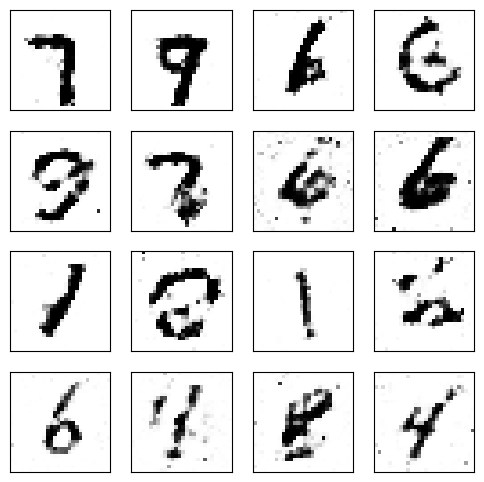

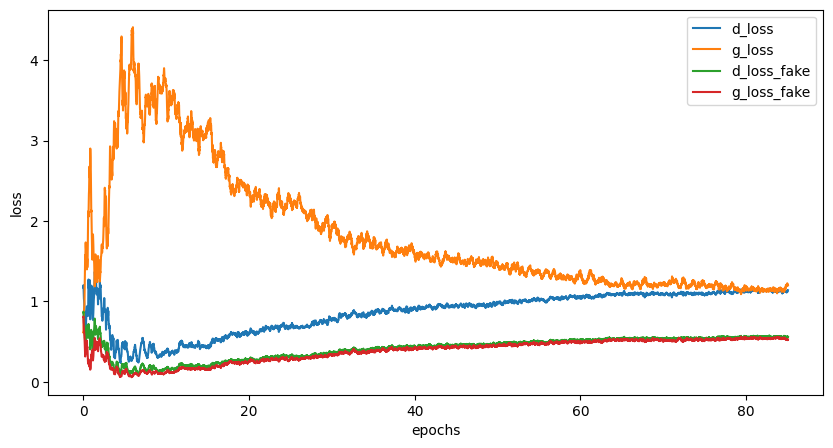

Epoch [86/500], Step[100/469], d_loss: 1.3092, d_loss_fake: 0.6044, g_loss: 1.0311, g_loss_fake: 0.6037, D(x): 0.56, D(G(z)): 0.41
Epoch [86/500], Step[200/469], d_loss: 1.1370, d_loss_fake: 0.5524, g_loss: 1.0075, g_loss_fake: 0.6060, D(x): 0.63, D(G(z)): 0.37
Epoch [86/500], Step[300/469], d_loss: 1.1584, d_loss_fake: 0.6694, g_loss: 1.2522, g_loss_fake: 0.4892, D(x): 0.66, D(G(z)): 0.42
Epoch [86/500], Step[400/469], d_loss: 1.0767, d_loss_fake: 0.5616, g_loss: 1.2120, g_loss_fake: 0.4713, D(x): 0.64, D(G(z)): 0.38


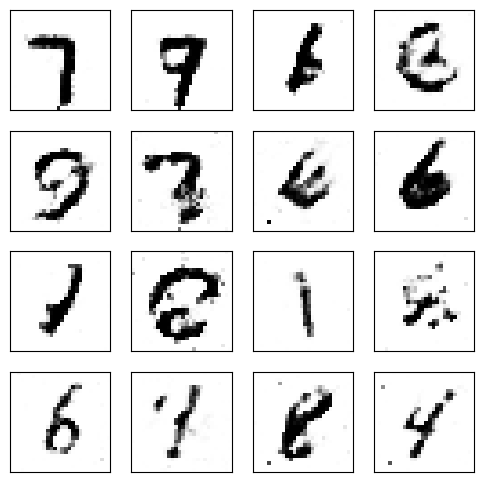

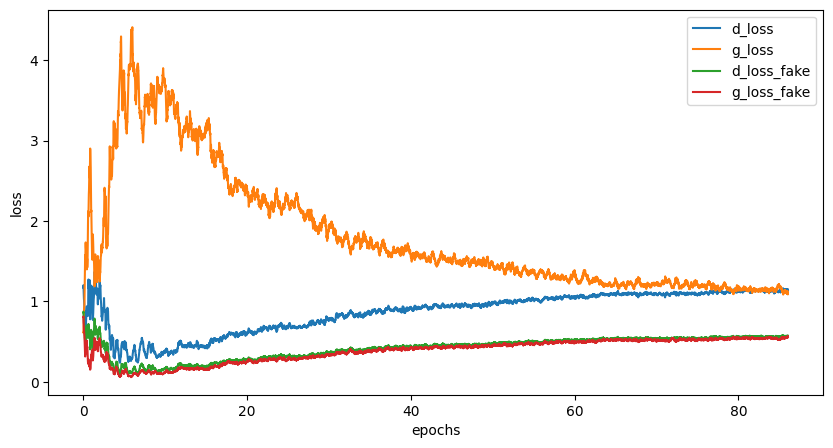

Epoch [87/500], Step[100/469], d_loss: 1.2400, d_loss_fake: 0.6407, g_loss: 1.1481, g_loss_fake: 0.5429, D(x): 0.60, D(G(z)): 0.44
Epoch [87/500], Step[200/469], d_loss: 1.1502, d_loss_fake: 0.5717, g_loss: 0.9596, g_loss_fake: 0.5640, D(x): 0.59, D(G(z)): 0.41
Epoch [87/500], Step[300/469], d_loss: 1.2607, d_loss_fake: 0.6082, g_loss: 0.9875, g_loss_fake: 0.6012, D(x): 0.57, D(G(z)): 0.42
Epoch [87/500], Step[400/469], d_loss: 1.1349, d_loss_fake: 0.5752, g_loss: 1.0715, g_loss_fake: 0.5895, D(x): 0.62, D(G(z)): 0.40


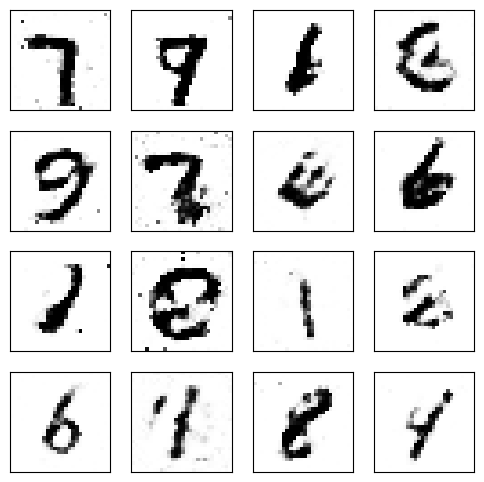

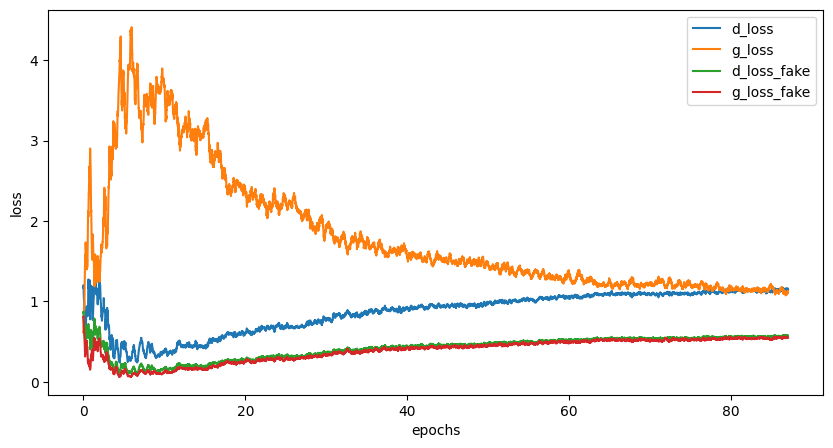

Epoch [88/500], Step[100/469], d_loss: 1.1694, d_loss_fake: 0.5224, g_loss: 0.9897, g_loss_fake: 0.5599, D(x): 0.57, D(G(z)): 0.39
Epoch [88/500], Step[200/469], d_loss: 1.1568, d_loss_fake: 0.6693, g_loss: 0.9476, g_loss_fake: 0.6588, D(x): 0.65, D(G(z)): 0.43
Epoch [88/500], Step[300/469], d_loss: 1.3209, d_loss_fake: 0.7062, g_loss: 1.0131, g_loss_fake: 0.6626, D(x): 0.60, D(G(z)): 0.45
Epoch [88/500], Step[400/469], d_loss: 1.0197, d_loss_fake: 0.5090, g_loss: 1.2602, g_loss_fake: 0.5049, D(x): 0.66, D(G(z)): 0.35


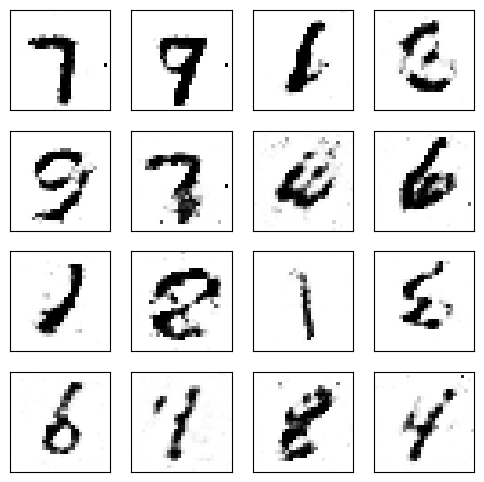

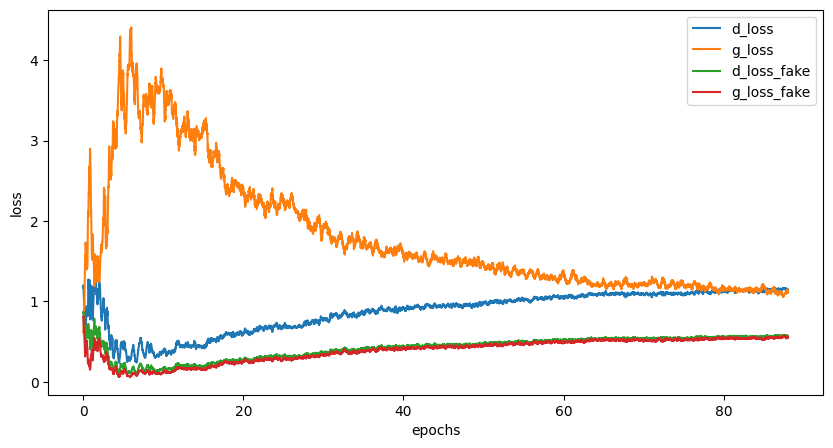

Epoch [89/500], Step[100/469], d_loss: 1.1789, d_loss_fake: 0.5605, g_loss: 1.3238, g_loss_fake: 0.4632, D(x): 0.59, D(G(z)): 0.39
Epoch [89/500], Step[200/469], d_loss: 1.1491, d_loss_fake: 0.5955, g_loss: 1.4112, g_loss_fake: 0.4607, D(x): 0.62, D(G(z)): 0.40
Epoch [89/500], Step[300/469], d_loss: 0.9851, d_loss_fake: 0.4759, g_loss: 1.1979, g_loss_fake: 0.5320, D(x): 0.64, D(G(z)): 0.35
Epoch [89/500], Step[400/469], d_loss: 1.0704, d_loss_fake: 0.6048, g_loss: 0.9926, g_loss_fake: 0.6725, D(x): 0.67, D(G(z)): 0.42


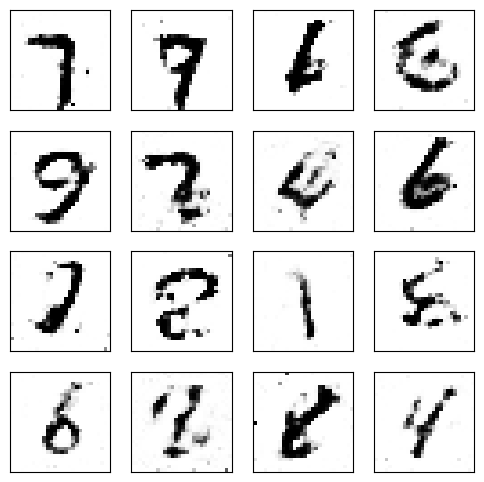

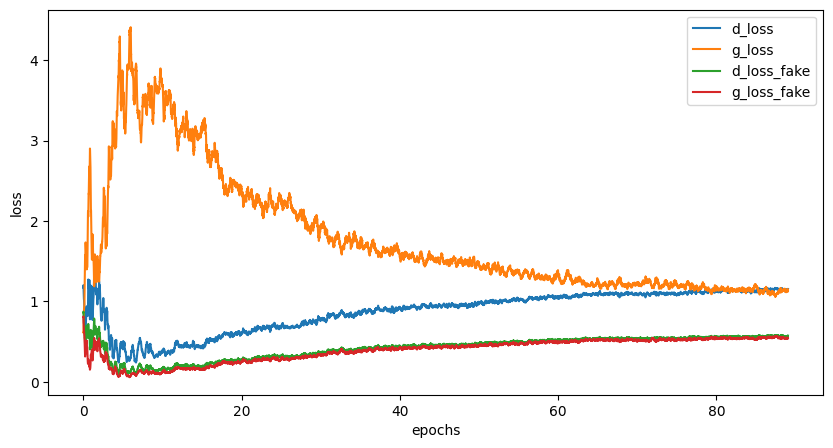

Epoch [90/500], Step[100/469], d_loss: 1.1243, d_loss_fake: 0.6736, g_loss: 1.2052, g_loss_fake: 0.5403, D(x): 0.68, D(G(z)): 0.43
Epoch [90/500], Step[200/469], d_loss: 1.2170, d_loss_fake: 0.6685, g_loss: 0.9363, g_loss_fake: 0.6959, D(x): 0.62, D(G(z)): 0.44
Epoch [90/500], Step[300/469], d_loss: 1.1823, d_loss_fake: 0.4716, g_loss: 1.2147, g_loss_fake: 0.5002, D(x): 0.55, D(G(z)): 0.35
Epoch [90/500], Step[400/469], d_loss: 1.1893, d_loss_fake: 0.6497, g_loss: 1.0484, g_loss_fake: 0.5873, D(x): 0.62, D(G(z)): 0.43


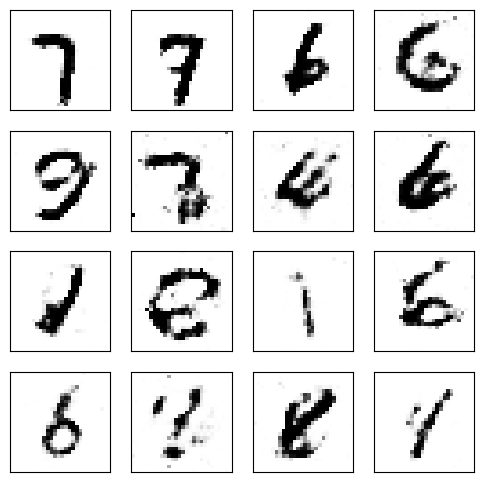

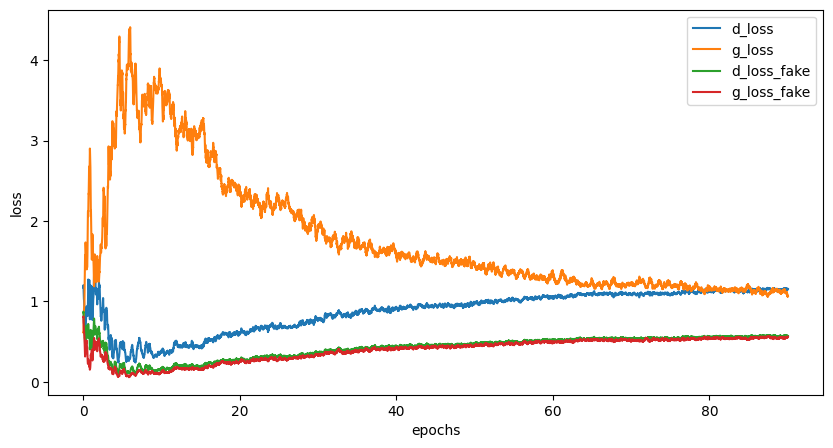

Epoch [91/500], Step[100/469], d_loss: 1.1415, d_loss_fake: 0.5927, g_loss: 1.1315, g_loss_fake: 0.4738, D(x): 0.62, D(G(z)): 0.41
Epoch [91/500], Step[200/469], d_loss: 1.0856, d_loss_fake: 0.4247, g_loss: 1.2269, g_loss_fake: 0.4900, D(x): 0.59, D(G(z)): 0.31
Epoch [91/500], Step[300/469], d_loss: 1.1072, d_loss_fake: 0.5673, g_loss: 1.2092, g_loss_fake: 0.4917, D(x): 0.63, D(G(z)): 0.39
Epoch [91/500], Step[400/469], d_loss: 1.2657, d_loss_fake: 0.6340, g_loss: 1.3715, g_loss_fake: 0.4681, D(x): 0.59, D(G(z)): 0.42


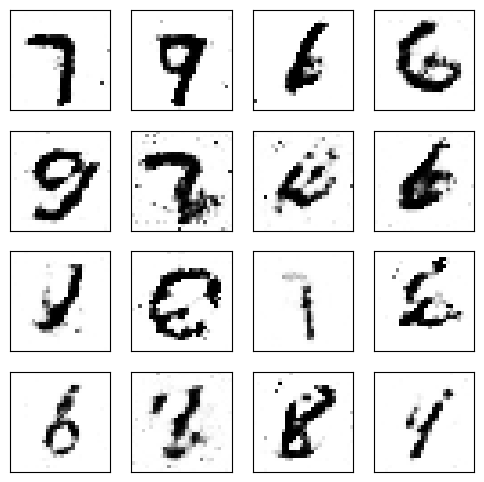

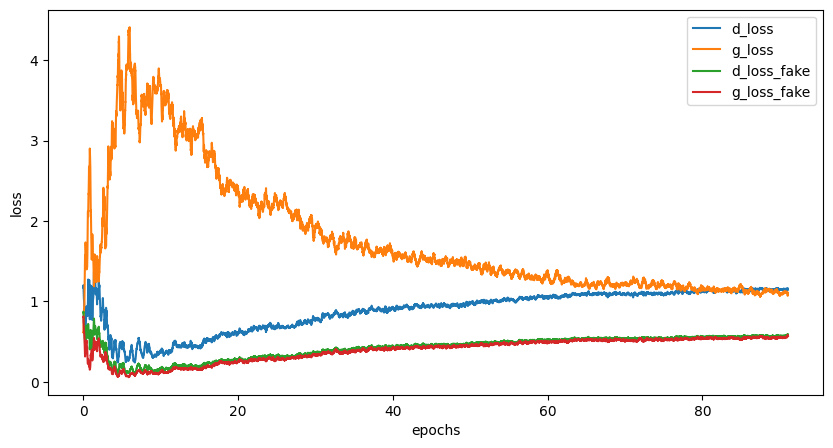

Epoch [92/500], Step[100/469], d_loss: 1.0955, d_loss_fake: 0.4968, g_loss: 0.9934, g_loss_fake: 0.6267, D(x): 0.60, D(G(z)): 0.35
Epoch [92/500], Step[200/469], d_loss: 1.0076, d_loss_fake: 0.4628, g_loss: 1.1806, g_loss_fake: 0.5005, D(x): 0.63, D(G(z)): 0.34
Epoch [92/500], Step[300/469], d_loss: 1.2698, d_loss_fake: 0.6700, g_loss: 1.0157, g_loss_fake: 0.6272, D(x): 0.61, D(G(z)): 0.45
Epoch [92/500], Step[400/469], d_loss: 1.1977, d_loss_fake: 0.6416, g_loss: 1.1002, g_loss_fake: 0.5576, D(x): 0.61, D(G(z)): 0.44


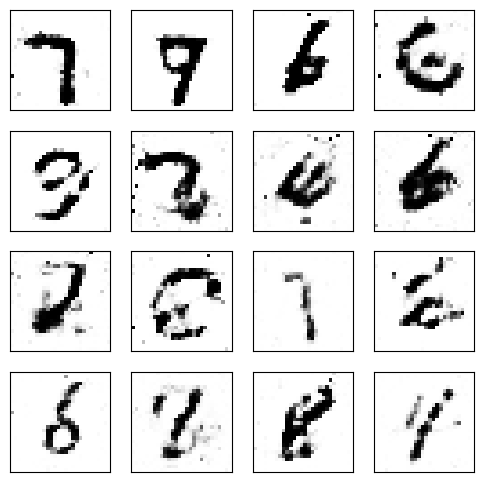

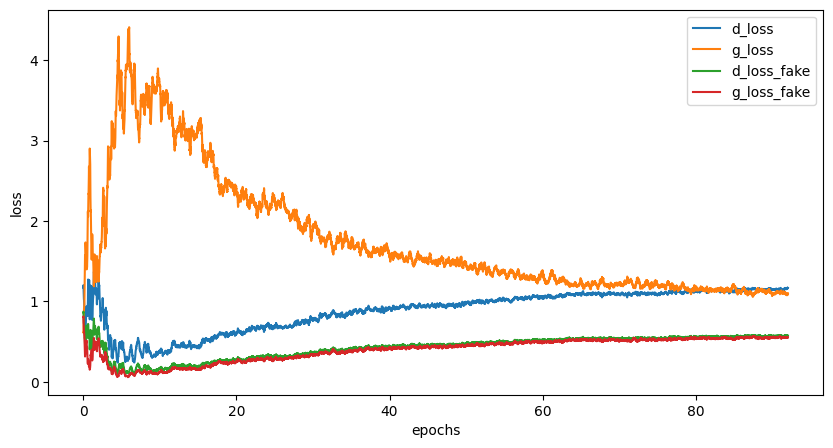

Epoch [93/500], Step[100/469], d_loss: 1.0555, d_loss_fake: 0.5212, g_loss: 1.1120, g_loss_fake: 0.5433, D(x): 0.62, D(G(z)): 0.38
Epoch [93/500], Step[200/469], d_loss: 1.1607, d_loss_fake: 0.5872, g_loss: 1.0238, g_loss_fake: 0.6339, D(x): 0.61, D(G(z)): 0.40
Epoch [93/500], Step[300/469], d_loss: 1.1796, d_loss_fake: 0.4964, g_loss: 1.1611, g_loss_fake: 0.5419, D(x): 0.54, D(G(z)): 0.36
Epoch [93/500], Step[400/469], d_loss: 1.0938, d_loss_fake: 0.5271, g_loss: 1.1287, g_loss_fake: 0.5053, D(x): 0.61, D(G(z)): 0.38


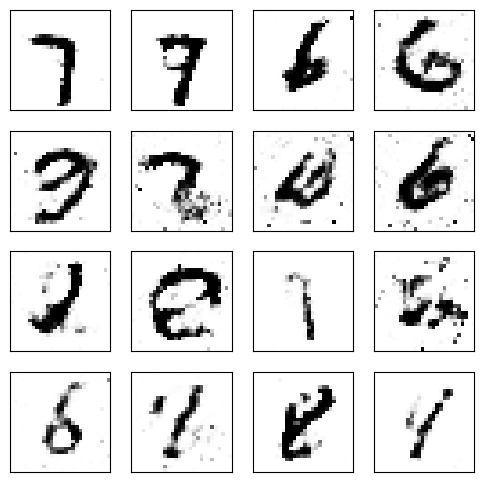

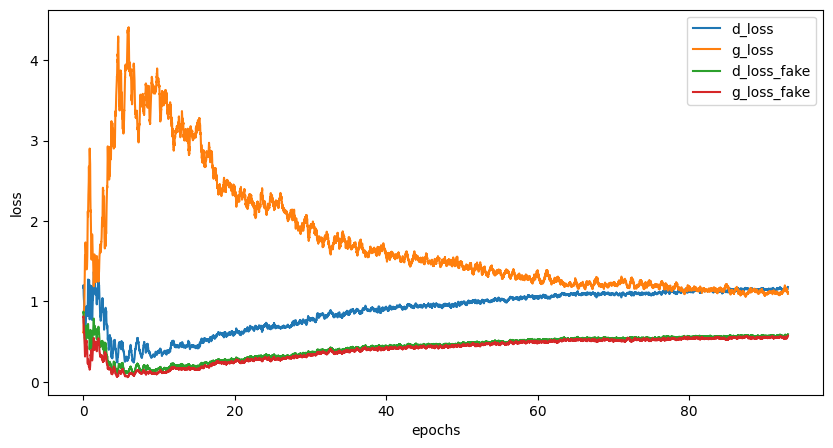

Epoch [94/500], Step[100/469], d_loss: 1.1859, d_loss_fake: 0.5857, g_loss: 0.9985, g_loss_fake: 0.5847, D(x): 0.59, D(G(z)): 0.40
Epoch [94/500], Step[200/469], d_loss: 1.1626, d_loss_fake: 0.5212, g_loss: 1.0469, g_loss_fake: 0.5394, D(x): 0.57, D(G(z)): 0.38
Epoch [94/500], Step[300/469], d_loss: 1.0786, d_loss_fake: 0.4560, g_loss: 1.3526, g_loss_fake: 0.4284, D(x): 0.59, D(G(z)): 0.34
Epoch [94/500], Step[400/469], d_loss: 1.1689, d_loss_fake: 0.5348, g_loss: 1.1334, g_loss_fake: 0.5697, D(x): 0.58, D(G(z)): 0.36


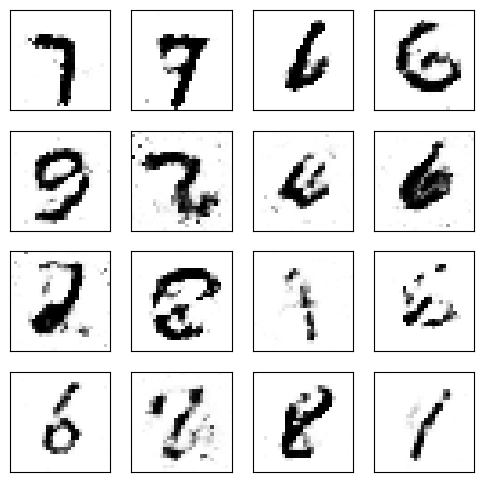

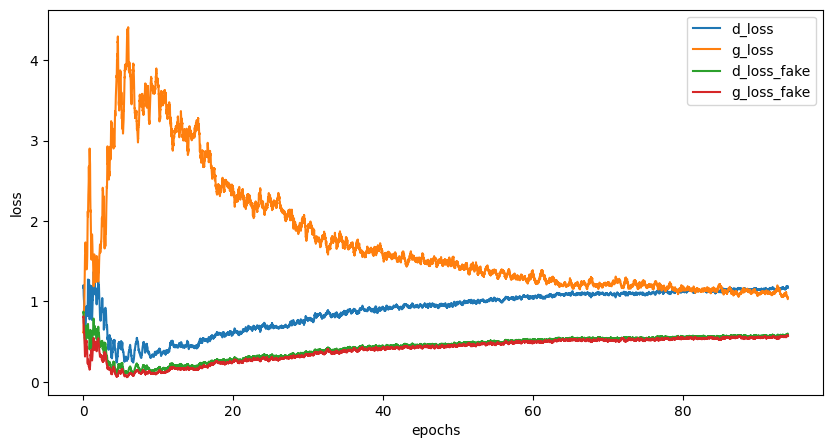

Epoch [95/500], Step[100/469], d_loss: 1.1722, d_loss_fake: 0.5248, g_loss: 1.0899, g_loss_fake: 0.4976, D(x): 0.57, D(G(z)): 0.38
Epoch [95/500], Step[200/469], d_loss: 1.2238, d_loss_fake: 0.7829, g_loss: 0.8365, g_loss_fake: 0.6672, D(x): 0.67, D(G(z)): 0.50
Epoch [95/500], Step[300/469], d_loss: 1.1114, d_loss_fake: 0.6201, g_loss: 0.9802, g_loss_fake: 0.5763, D(x): 0.65, D(G(z)): 0.42
Epoch [95/500], Step[400/469], d_loss: 1.2116, d_loss_fake: 0.5648, g_loss: 1.1365, g_loss_fake: 0.5839, D(x): 0.58, D(G(z)): 0.38


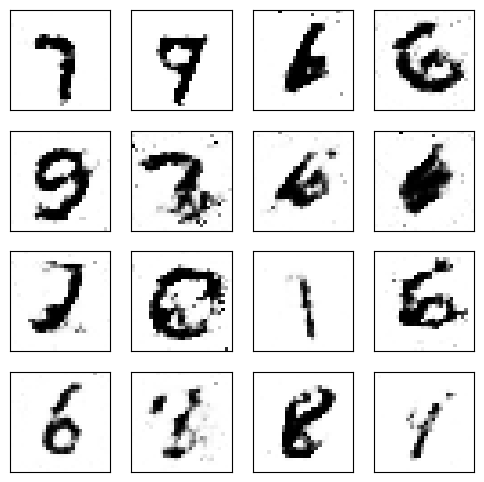

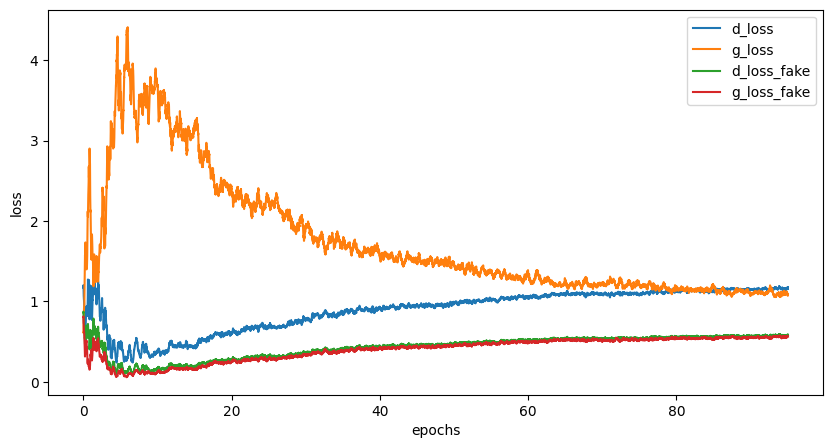

Epoch [96/500], Step[100/469], d_loss: 1.1724, d_loss_fake: 0.5709, g_loss: 1.0039, g_loss_fake: 0.5715, D(x): 0.59, D(G(z)): 0.41
Epoch [96/500], Step[200/469], d_loss: 1.0312, d_loss_fake: 0.4962, g_loss: 1.3203, g_loss_fake: 0.4859, D(x): 0.64, D(G(z)): 0.35
Epoch [96/500], Step[300/469], d_loss: 1.0529, d_loss_fake: 0.4858, g_loss: 1.4047, g_loss_fake: 0.3776, D(x): 0.61, D(G(z)): 0.34
Epoch [96/500], Step[400/469], d_loss: 1.1144, d_loss_fake: 0.4507, g_loss: 1.2765, g_loss_fake: 0.4822, D(x): 0.57, D(G(z)): 0.33


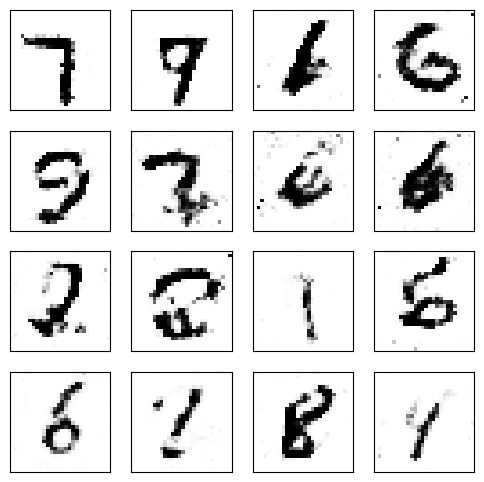

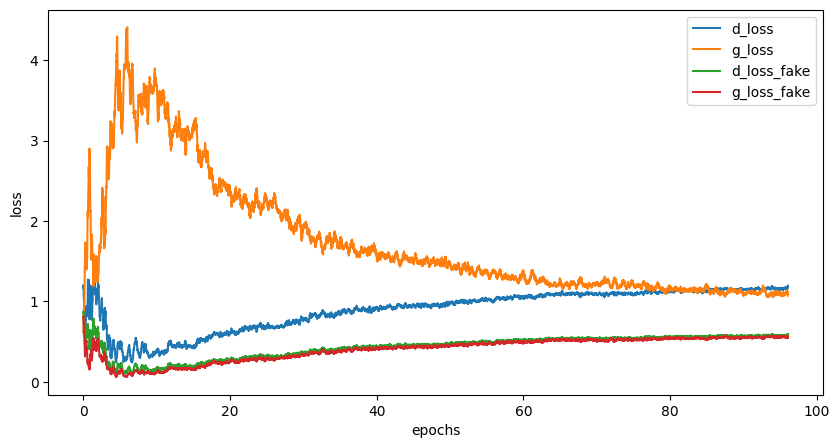

Epoch [97/500], Step[100/469], d_loss: 1.2105, d_loss_fake: 0.6229, g_loss: 1.2134, g_loss_fake: 0.4695, D(x): 0.60, D(G(z)): 0.42
Epoch [97/500], Step[200/469], d_loss: 1.4450, d_loss_fake: 0.6725, g_loss: 0.9753, g_loss_fake: 0.6264, D(x): 0.53, D(G(z)): 0.45
Epoch [97/500], Step[300/469], d_loss: 1.0840, d_loss_fake: 0.5861, g_loss: 1.1106, g_loss_fake: 0.5233, D(x): 0.66, D(G(z)): 0.41
Epoch [97/500], Step[400/469], d_loss: 1.2404, d_loss_fake: 0.6464, g_loss: 1.0289, g_loss_fake: 0.5949, D(x): 0.59, D(G(z)): 0.43


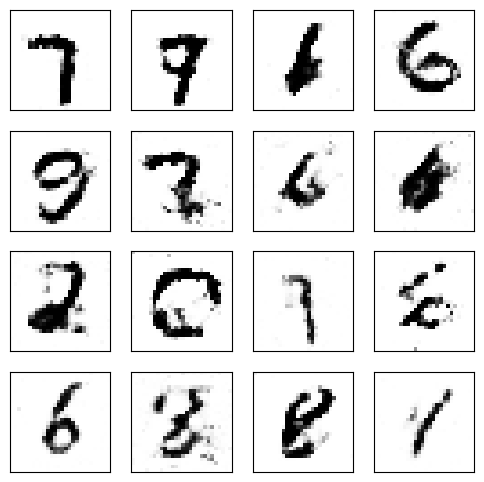

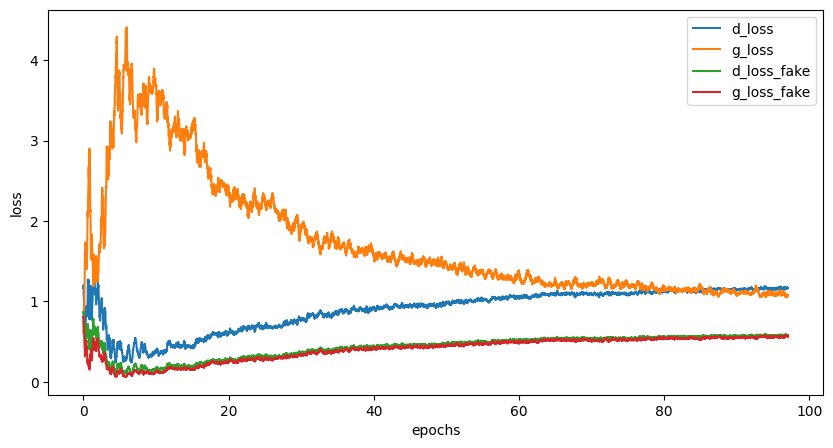

Epoch [98/500], Step[100/469], d_loss: 1.0886, d_loss_fake: 0.5471, g_loss: 1.0867, g_loss_fake: 0.5567, D(x): 0.62, D(G(z)): 0.40
Epoch [98/500], Step[200/469], d_loss: 1.2060, d_loss_fake: 0.5106, g_loss: 1.0675, g_loss_fake: 0.4926, D(x): 0.54, D(G(z)): 0.38
Epoch [98/500], Step[300/469], d_loss: 1.0623, d_loss_fake: 0.4480, g_loss: 1.1901, g_loss_fake: 0.4898, D(x): 0.59, D(G(z)): 0.34
Epoch [98/500], Step[400/469], d_loss: 1.1116, d_loss_fake: 0.5329, g_loss: 1.0131, g_loss_fake: 0.6053, D(x): 0.60, D(G(z)): 0.38


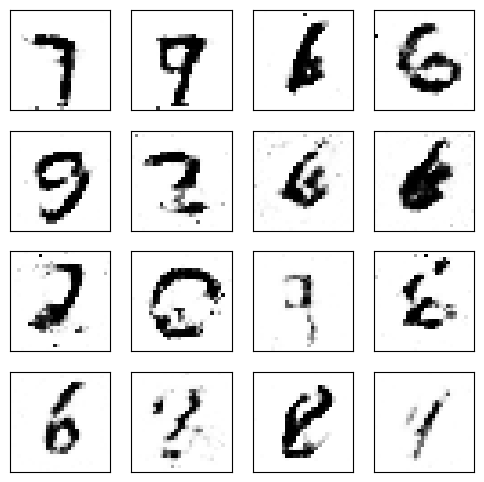

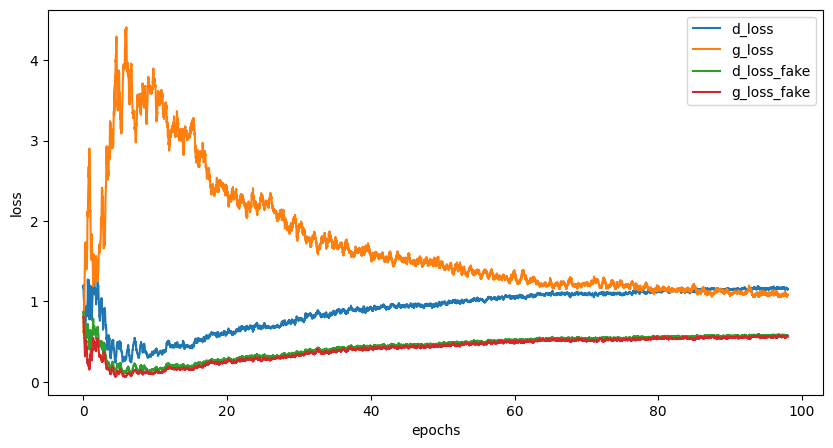

Epoch [99/500], Step[100/469], d_loss: 1.1012, d_loss_fake: 0.5806, g_loss: 1.0541, g_loss_fake: 0.5697, D(x): 0.65, D(G(z)): 0.40
Epoch [99/500], Step[200/469], d_loss: 1.0432, d_loss_fake: 0.5060, g_loss: 1.1955, g_loss_fake: 0.5035, D(x): 0.63, D(G(z)): 0.37
Epoch [99/500], Step[300/469], d_loss: 1.1262, d_loss_fake: 0.5656, g_loss: 1.0204, g_loss_fake: 0.5888, D(x): 0.62, D(G(z)): 0.40
Epoch [99/500], Step[400/469], d_loss: 1.1247, d_loss_fake: 0.4686, g_loss: 1.1144, g_loss_fake: 0.4876, D(x): 0.56, D(G(z)): 0.35


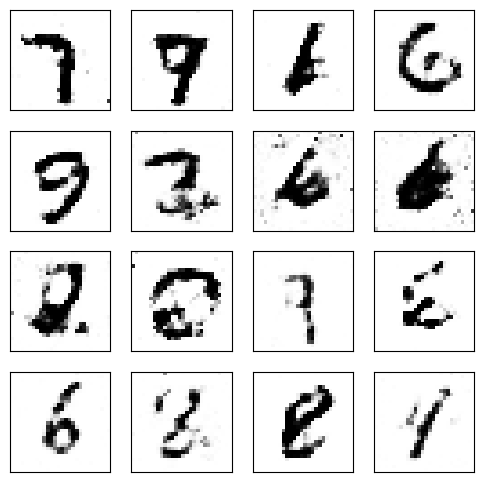

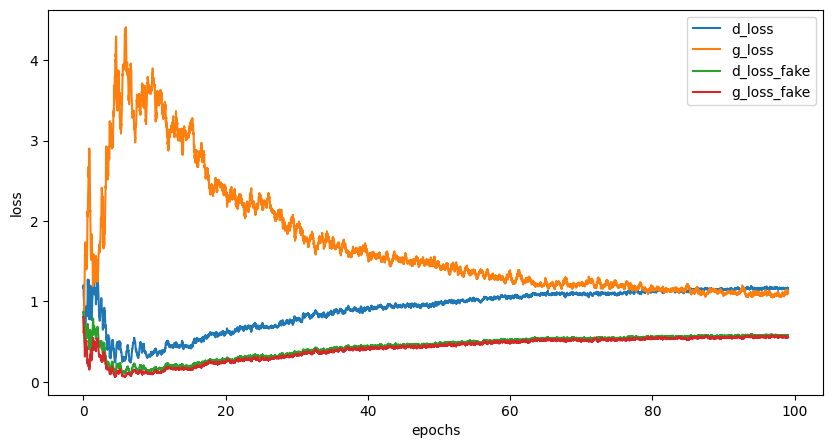

Epoch [100/500], Step[100/469], d_loss: 1.1858, d_loss_fake: 0.6119, g_loss: 1.0792, g_loss_fake: 0.5093, D(x): 0.63, D(G(z)): 0.42
Epoch [100/500], Step[200/469], d_loss: 1.1453, d_loss_fake: 0.6170, g_loss: 1.1454, g_loss_fake: 0.5443, D(x): 0.64, D(G(z)): 0.42
Epoch [100/500], Step[300/469], d_loss: 1.2636, d_loss_fake: 0.7886, g_loss: 0.8808, g_loss_fake: 0.6893, D(x): 0.66, D(G(z)): 0.49
Epoch [100/500], Step[400/469], d_loss: 1.3031, d_loss_fake: 0.5857, g_loss: 1.2920, g_loss_fake: 0.4435, D(x): 0.55, D(G(z)): 0.38


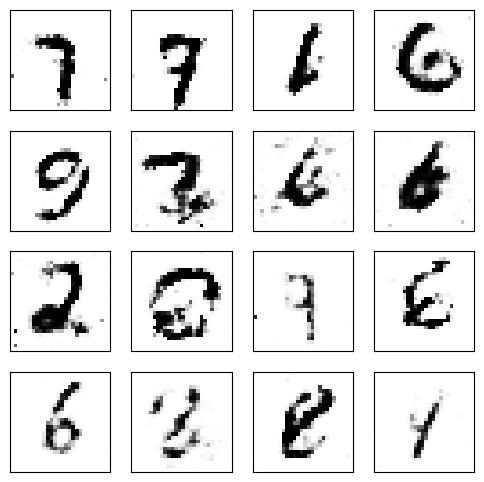

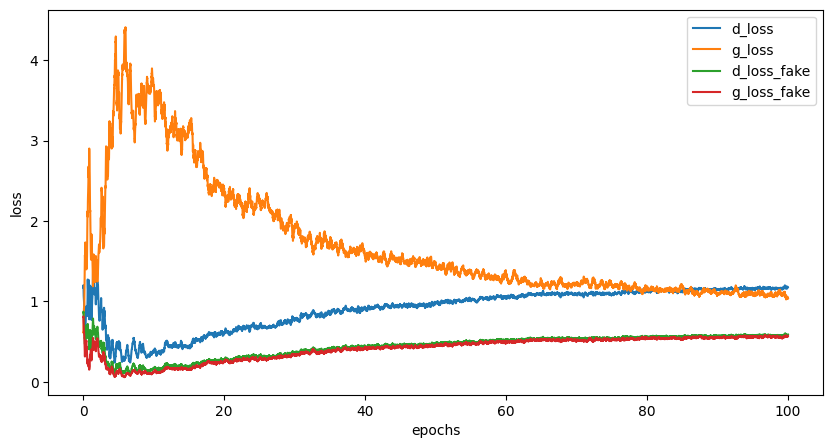

Epoch [101/500], Step[100/469], d_loss: 1.1555, d_loss_fake: 0.4994, g_loss: 1.1878, g_loss_fake: 0.4939, D(x): 0.56, D(G(z)): 0.36
Epoch [101/500], Step[200/469], d_loss: 1.1979, d_loss_fake: 0.6232, g_loss: 1.3697, g_loss_fake: 0.5062, D(x): 0.64, D(G(z)): 0.37
Epoch [101/500], Step[300/469], d_loss: 1.1103, d_loss_fake: 0.5300, g_loss: 1.1716, g_loss_fake: 0.5233, D(x): 0.61, D(G(z)): 0.38
Epoch [101/500], Step[400/469], d_loss: 1.2009, d_loss_fake: 0.6307, g_loss: 1.0212, g_loss_fake: 0.6606, D(x): 0.61, D(G(z)): 0.42


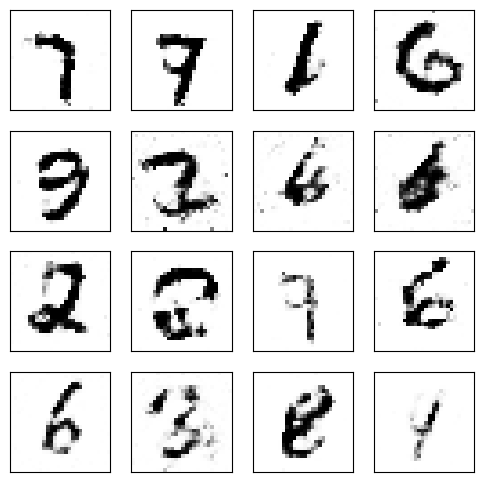

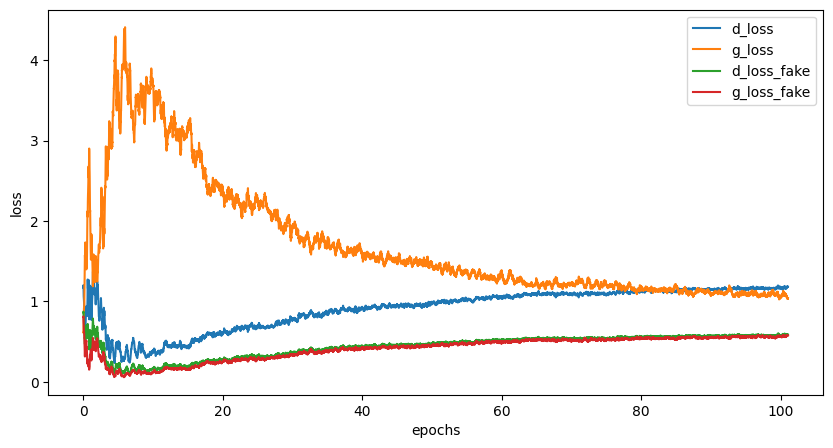

Epoch [102/500], Step[100/469], d_loss: 1.1194, d_loss_fake: 0.4963, g_loss: 1.1256, g_loss_fake: 0.5311, D(x): 0.59, D(G(z)): 0.35
Epoch [102/500], Step[200/469], d_loss: 1.2599, d_loss_fake: 0.5304, g_loss: 1.0557, g_loss_fake: 0.5491, D(x): 0.52, D(G(z)): 0.38
Epoch [102/500], Step[300/469], d_loss: 1.0567, d_loss_fake: 0.4969, g_loss: 1.1867, g_loss_fake: 0.5552, D(x): 0.62, D(G(z)): 0.35
Epoch [102/500], Step[400/469], d_loss: 1.1650, d_loss_fake: 0.5713, g_loss: 0.9704, g_loss_fake: 0.6014, D(x): 0.59, D(G(z)): 0.41


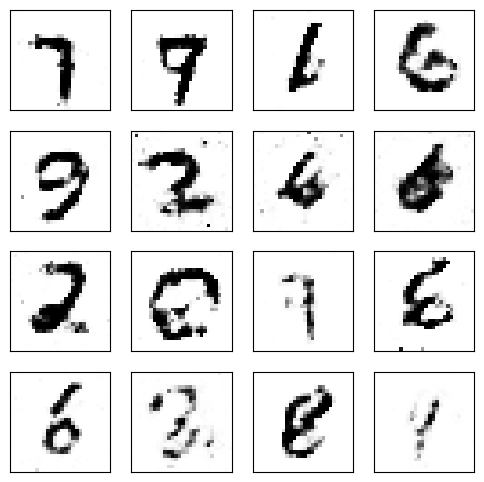

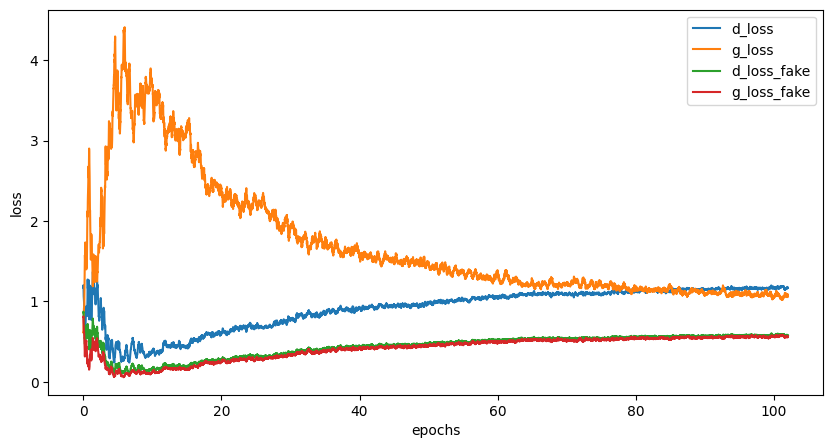

Epoch [103/500], Step[100/469], d_loss: 1.2700, d_loss_fake: 0.5483, g_loss: 1.0819, g_loss_fake: 0.5610, D(x): 0.53, D(G(z)): 0.38
Epoch [103/500], Step[200/469], d_loss: 1.2819, d_loss_fake: 0.5430, g_loss: 1.0547, g_loss_fake: 0.6495, D(x): 0.54, D(G(z)): 0.36
Epoch [103/500], Step[300/469], d_loss: 1.1894, d_loss_fake: 0.6694, g_loss: 0.9832, g_loss_fake: 0.6016, D(x): 0.63, D(G(z)): 0.45
Epoch [103/500], Step[400/469], d_loss: 1.1949, d_loss_fake: 0.5922, g_loss: 1.0588, g_loss_fake: 0.5666, D(x): 0.60, D(G(z)): 0.40


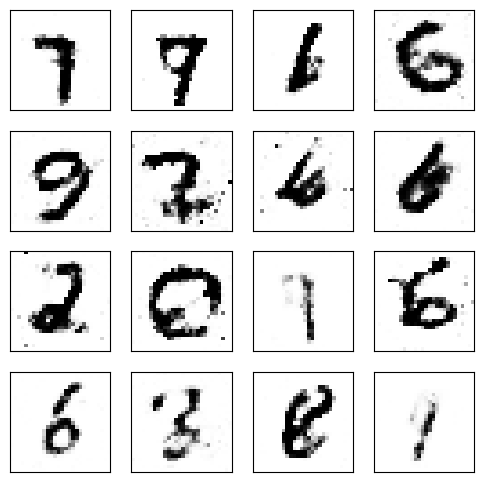

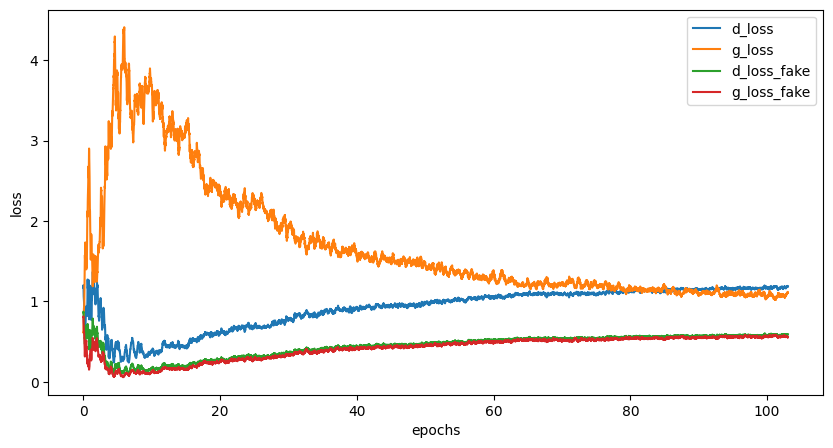

Epoch [104/500], Step[100/469], d_loss: 1.1397, d_loss_fake: 0.5573, g_loss: 1.1093, g_loss_fake: 0.5451, D(x): 0.60, D(G(z)): 0.40
Epoch [104/500], Step[200/469], d_loss: 1.2024, d_loss_fake: 0.6765, g_loss: 0.9043, g_loss_fake: 0.6420, D(x): 0.62, D(G(z)): 0.45
Epoch [104/500], Step[300/469], d_loss: 1.1377, d_loss_fake: 0.6300, g_loss: 1.0103, g_loss_fake: 0.6106, D(x): 0.64, D(G(z)): 0.41
Epoch [104/500], Step[400/469], d_loss: 1.2030, d_loss_fake: 0.5877, g_loss: 1.1416, g_loss_fake: 0.5071, D(x): 0.59, D(G(z)): 0.41


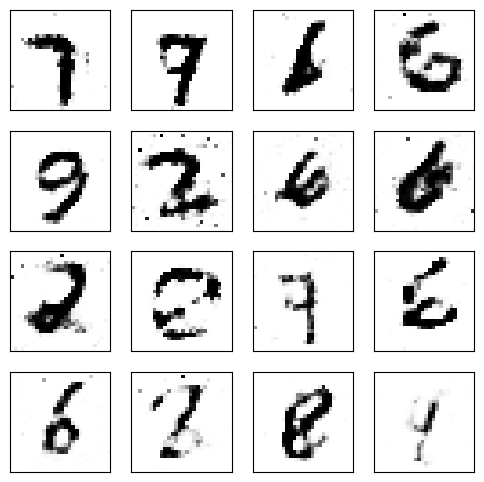

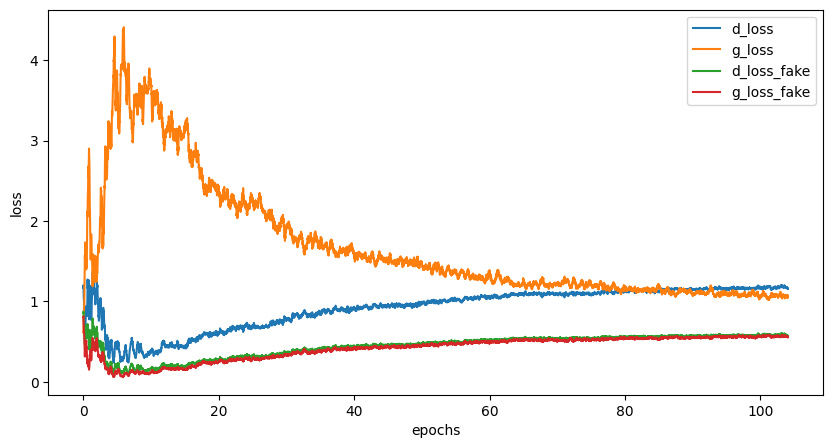

Epoch [105/500], Step[100/469], d_loss: 1.2284, d_loss_fake: 0.6268, g_loss: 0.9906, g_loss_fake: 0.5860, D(x): 0.59, D(G(z)): 0.43
Epoch [105/500], Step[200/469], d_loss: 1.0688, d_loss_fake: 0.5585, g_loss: 0.9791, g_loss_fake: 0.6406, D(x): 0.64, D(G(z)): 0.39
Epoch [105/500], Step[300/469], d_loss: 1.2398, d_loss_fake: 0.6797, g_loss: 0.9269, g_loss_fake: 0.6167, D(x): 0.61, D(G(z)): 0.46
Epoch [105/500], Step[400/469], d_loss: 1.1367, d_loss_fake: 0.4658, g_loss: 1.4565, g_loss_fake: 0.4134, D(x): 0.57, D(G(z)): 0.33


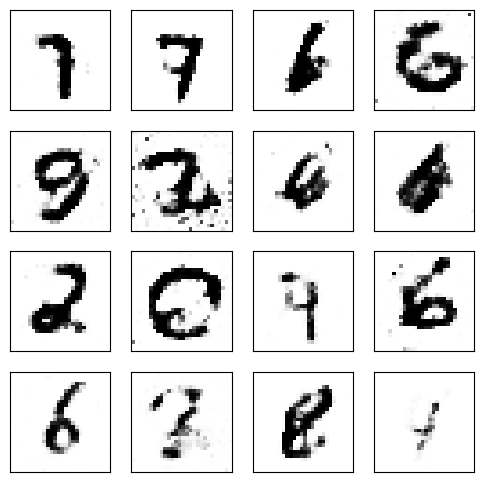

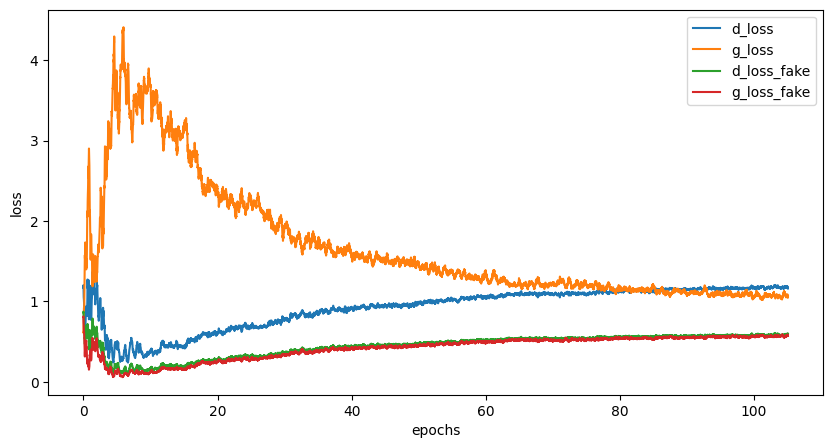

Epoch [106/500], Step[100/469], d_loss: 1.2327, d_loss_fake: 0.6476, g_loss: 0.8804, g_loss_fake: 0.6169, D(x): 0.59, D(G(z)): 0.44
Epoch [106/500], Step[200/469], d_loss: 1.1787, d_loss_fake: 0.7402, g_loss: 0.8358, g_loss_fake: 0.6974, D(x): 0.68, D(G(z)): 0.49
Epoch [106/500], Step[300/469], d_loss: 1.2072, d_loss_fake: 0.5754, g_loss: 0.9534, g_loss_fake: 0.5666, D(x): 0.56, D(G(z)): 0.41
Epoch [106/500], Step[400/469], d_loss: 1.1016, d_loss_fake: 0.5013, g_loss: 1.2056, g_loss_fake: 0.4772, D(x): 0.60, D(G(z)): 0.36


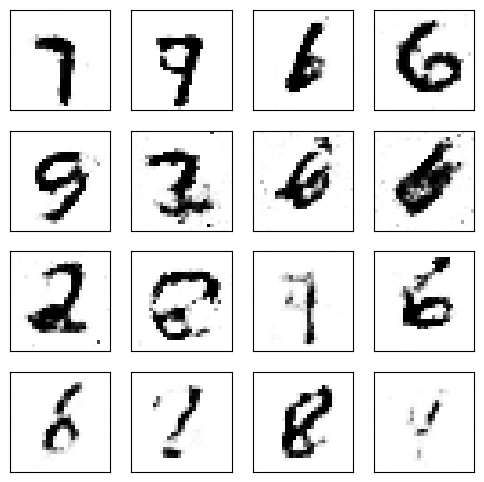

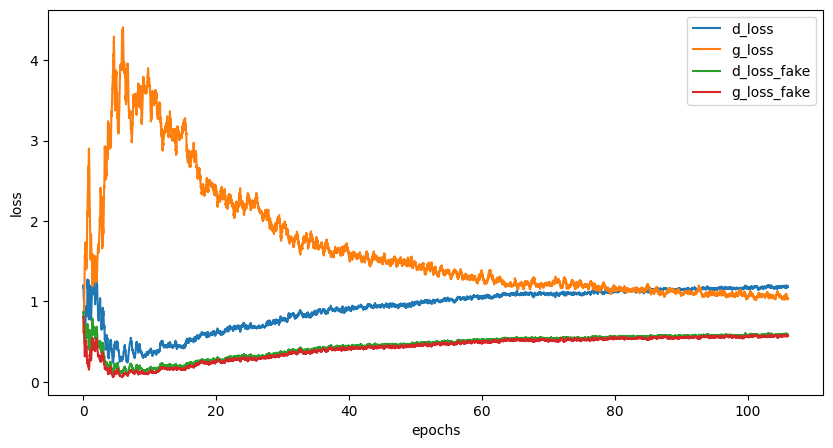

Epoch [107/500], Step[100/469], d_loss: 1.4160, d_loss_fake: 0.6460, g_loss: 0.9101, g_loss_fake: 0.6798, D(x): 0.53, D(G(z)): 0.43
Epoch [107/500], Step[200/469], d_loss: 1.2879, d_loss_fake: 0.6757, g_loss: 0.9120, g_loss_fake: 0.6298, D(x): 0.58, D(G(z)): 0.45
Epoch [107/500], Step[300/469], d_loss: 1.2166, d_loss_fake: 0.5980, g_loss: 0.9526, g_loss_fake: 0.6236, D(x): 0.59, D(G(z)): 0.41
Epoch [107/500], Step[400/469], d_loss: 1.1668, d_loss_fake: 0.5858, g_loss: 1.0238, g_loss_fake: 0.6189, D(x): 0.61, D(G(z)): 0.40


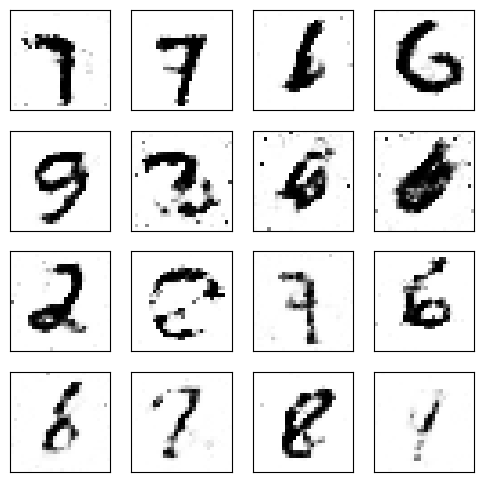

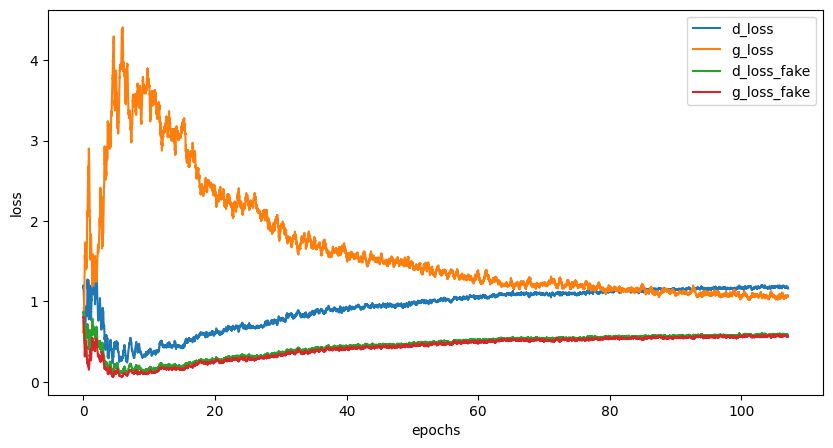

Epoch [108/500], Step[100/469], d_loss: 1.1296, d_loss_fake: 0.5637, g_loss: 0.9106, g_loss_fake: 0.6165, D(x): 0.60, D(G(z)): 0.41
Epoch [108/500], Step[200/469], d_loss: 1.2063, d_loss_fake: 0.6073, g_loss: 1.0862, g_loss_fake: 0.5349, D(x): 0.59, D(G(z)): 0.42
Epoch [108/500], Step[300/469], d_loss: 1.1231, d_loss_fake: 0.6020, g_loss: 0.9658, g_loss_fake: 0.6148, D(x): 0.64, D(G(z)): 0.42
Epoch [108/500], Step[400/469], d_loss: 1.1744, d_loss_fake: 0.5490, g_loss: 1.0723, g_loss_fake: 0.5132, D(x): 0.57, D(G(z)): 0.40


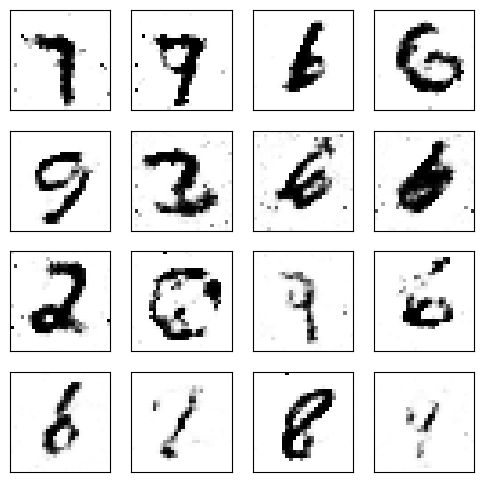

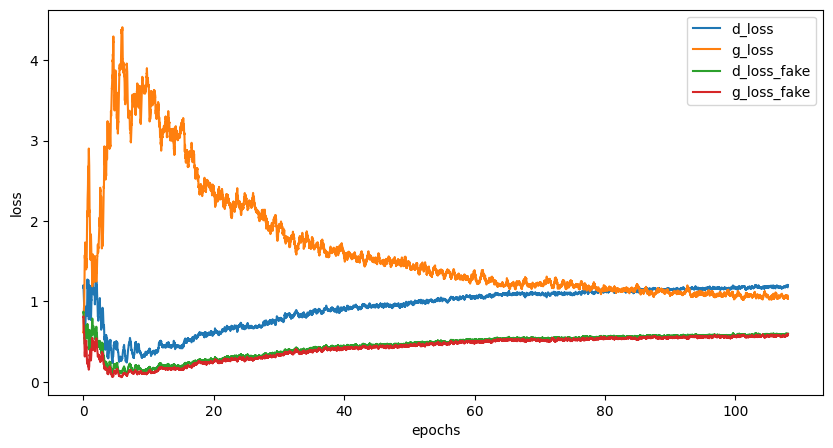

Epoch [109/500], Step[100/469], d_loss: 1.1845, d_loss_fake: 0.5829, g_loss: 0.9487, g_loss_fake: 0.5906, D(x): 0.59, D(G(z)): 0.42
Epoch [109/500], Step[200/469], d_loss: 1.3065, d_loss_fake: 0.6439, g_loss: 0.9388, g_loss_fake: 0.5702, D(x): 0.55, D(G(z)): 0.44
Epoch [109/500], Step[300/469], d_loss: 1.1964, d_loss_fake: 0.7017, g_loss: 0.9264, g_loss_fake: 0.6280, D(x): 0.64, D(G(z)): 0.46
Epoch [109/500], Step[400/469], d_loss: 1.1300, d_loss_fake: 0.5385, g_loss: 1.0862, g_loss_fake: 0.5170, D(x): 0.59, D(G(z)): 0.39


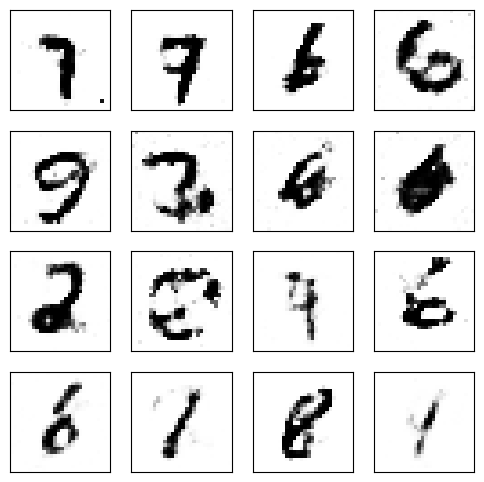

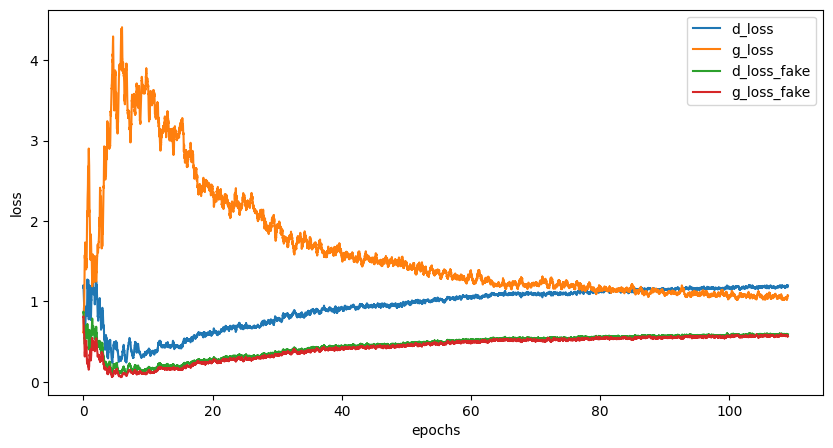

Epoch [110/500], Step[100/469], d_loss: 1.1543, d_loss_fake: 0.6064, g_loss: 0.9420, g_loss_fake: 0.6492, D(x): 0.61, D(G(z)): 0.42
Epoch [110/500], Step[200/469], d_loss: 1.1167, d_loss_fake: 0.5851, g_loss: 1.0024, g_loss_fake: 0.6299, D(x): 0.63, D(G(z)): 0.40
Epoch [110/500], Step[300/469], d_loss: 1.1608, d_loss_fake: 0.5933, g_loss: 0.8591, g_loss_fake: 0.7140, D(x): 0.61, D(G(z)): 0.42
Epoch [110/500], Step[400/469], d_loss: 1.2087, d_loss_fake: 0.5912, g_loss: 1.0831, g_loss_fake: 0.5373, D(x): 0.58, D(G(z)): 0.42


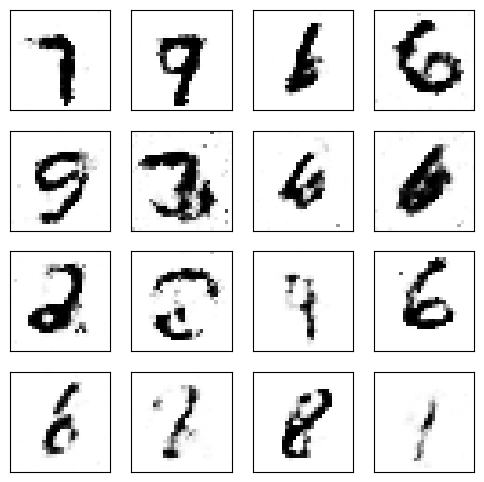

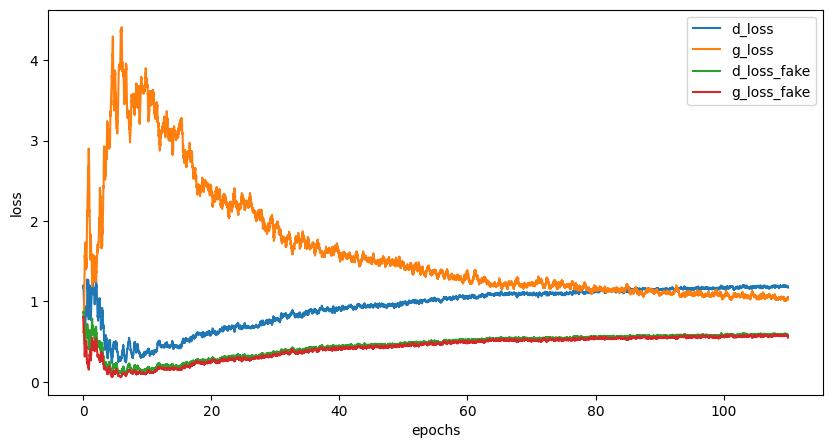

Epoch [111/500], Step[100/469], d_loss: 1.0288, d_loss_fake: 0.5190, g_loss: 1.2486, g_loss_fake: 0.5097, D(x): 0.64, D(G(z)): 0.37
Epoch [111/500], Step[200/469], d_loss: 1.0337, d_loss_fake: 0.4311, g_loss: 1.3021, g_loss_fake: 0.4985, D(x): 0.59, D(G(z)): 0.33
Epoch [111/500], Step[300/469], d_loss: 1.2854, d_loss_fake: 0.6595, g_loss: 0.9845, g_loss_fake: 0.6002, D(x): 0.58, D(G(z)): 0.43
Epoch [111/500], Step[400/469], d_loss: 1.2254, d_loss_fake: 0.7331, g_loss: 1.0525, g_loss_fake: 0.6262, D(x): 0.65, D(G(z)): 0.45


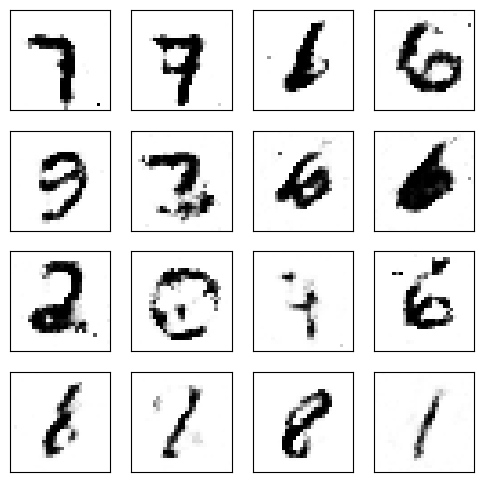

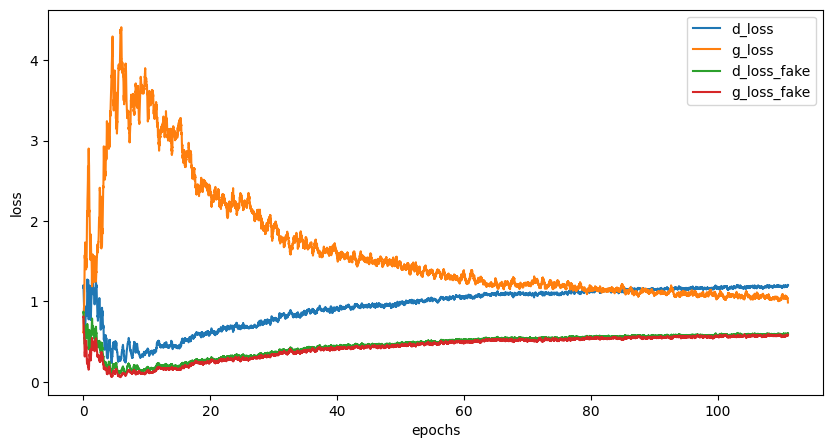

Epoch [112/500], Step[100/469], d_loss: 1.1136, d_loss_fake: 0.5945, g_loss: 0.9506, g_loss_fake: 0.6353, D(x): 0.63, D(G(z)): 0.42
Epoch [112/500], Step[200/469], d_loss: 1.2033, d_loss_fake: 0.6175, g_loss: 1.1073, g_loss_fake: 0.5390, D(x): 0.60, D(G(z)): 0.42
Epoch [112/500], Step[300/469], d_loss: 1.1359, d_loss_fake: 0.4252, g_loss: 1.2025, g_loss_fake: 0.4795, D(x): 0.54, D(G(z)): 0.32
Epoch [112/500], Step[400/469], d_loss: 1.1413, d_loss_fake: 0.5616, g_loss: 1.0172, g_loss_fake: 0.5899, D(x): 0.61, D(G(z)): 0.40


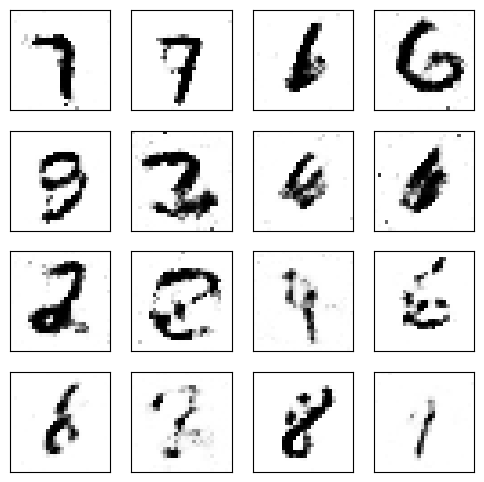

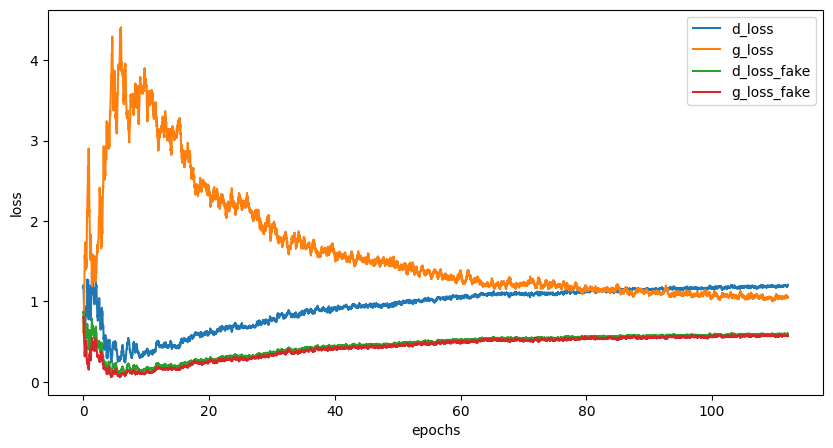

Epoch [113/500], Step[100/469], d_loss: 1.1998, d_loss_fake: 0.5086, g_loss: 1.0986, g_loss_fake: 0.5272, D(x): 0.55, D(G(z)): 0.36
Epoch [113/500], Step[200/469], d_loss: 1.1758, d_loss_fake: 0.6830, g_loss: 1.2612, g_loss_fake: 0.4857, D(x): 0.66, D(G(z)): 0.44
Epoch [113/500], Step[300/469], d_loss: 1.2143, d_loss_fake: 0.5927, g_loss: 1.1596, g_loss_fake: 0.5661, D(x): 0.59, D(G(z)): 0.40
Epoch [113/500], Step[400/469], d_loss: 1.2412, d_loss_fake: 0.6963, g_loss: 0.9456, g_loss_fake: 0.6510, D(x): 0.61, D(G(z)): 0.47


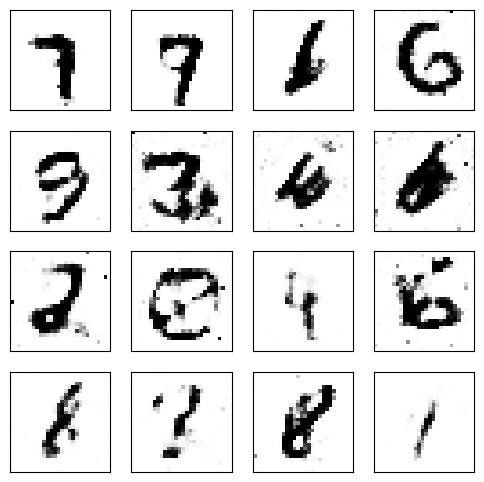

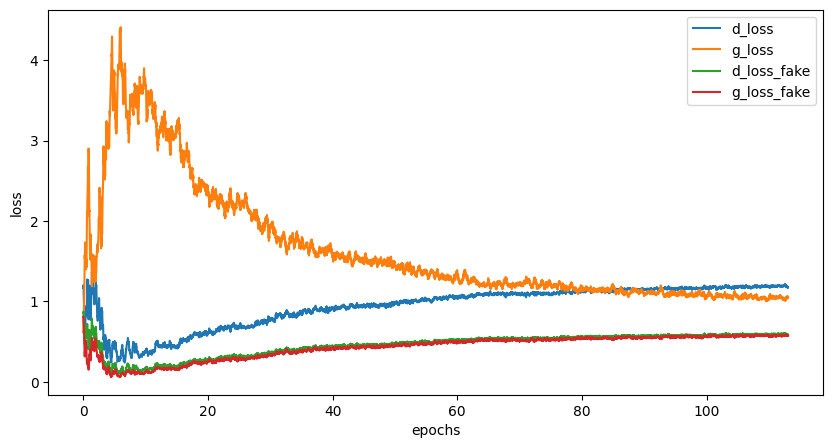

Epoch [114/500], Step[100/469], d_loss: 1.1141, d_loss_fake: 0.5760, g_loss: 1.0101, g_loss_fake: 0.5954, D(x): 0.62, D(G(z)): 0.40
Epoch [114/500], Step[200/469], d_loss: 1.1270, d_loss_fake: 0.5324, g_loss: 1.2527, g_loss_fake: 0.4480, D(x): 0.60, D(G(z)): 0.38
Epoch [114/500], Step[300/469], d_loss: 1.1132, d_loss_fake: 0.5758, g_loss: 0.9919, g_loss_fake: 0.5760, D(x): 0.62, D(G(z)): 0.41
Epoch [114/500], Step[400/469], d_loss: 1.1994, d_loss_fake: 0.5880, g_loss: 0.9044, g_loss_fake: 0.6318, D(x): 0.58, D(G(z)): 0.41


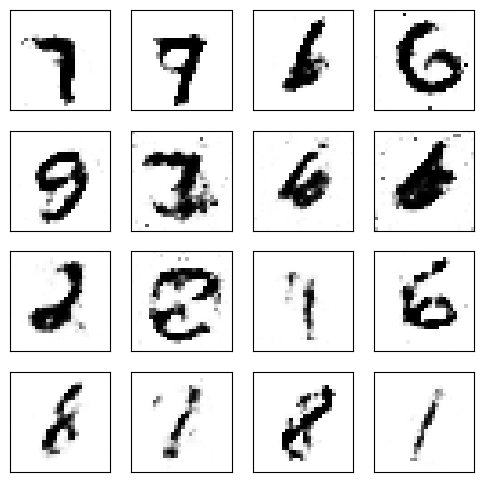

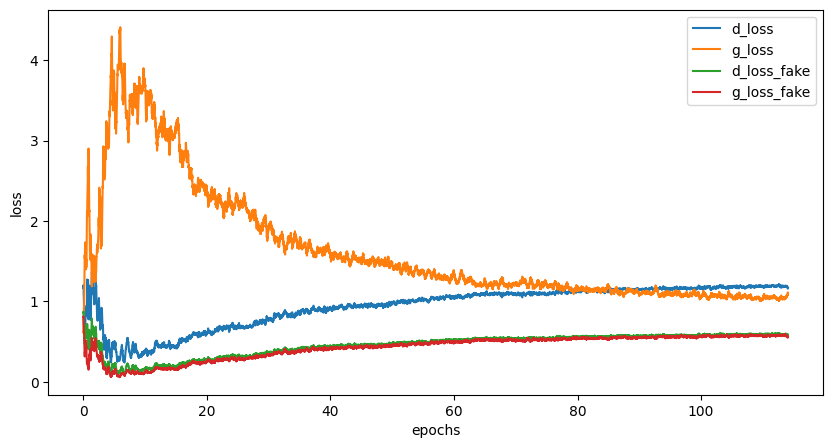

Epoch [115/500], Step[100/469], d_loss: 1.2155, d_loss_fake: 0.6215, g_loss: 1.0091, g_loss_fake: 0.5942, D(x): 0.59, D(G(z)): 0.43
Epoch [115/500], Step[200/469], d_loss: 1.2221, d_loss_fake: 0.5745, g_loss: 1.1296, g_loss_fake: 0.5223, D(x): 0.56, D(G(z)): 0.39
Epoch [115/500], Step[300/469], d_loss: 1.2355, d_loss_fake: 0.6572, g_loss: 0.9258, g_loss_fake: 0.6023, D(x): 0.60, D(G(z)): 0.45
Epoch [115/500], Step[400/469], d_loss: 1.1685, d_loss_fake: 0.6037, g_loss: 0.9908, g_loss_fake: 0.6494, D(x): 0.60, D(G(z)): 0.42


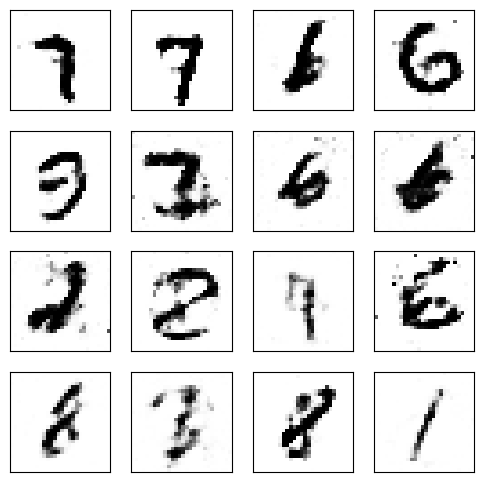

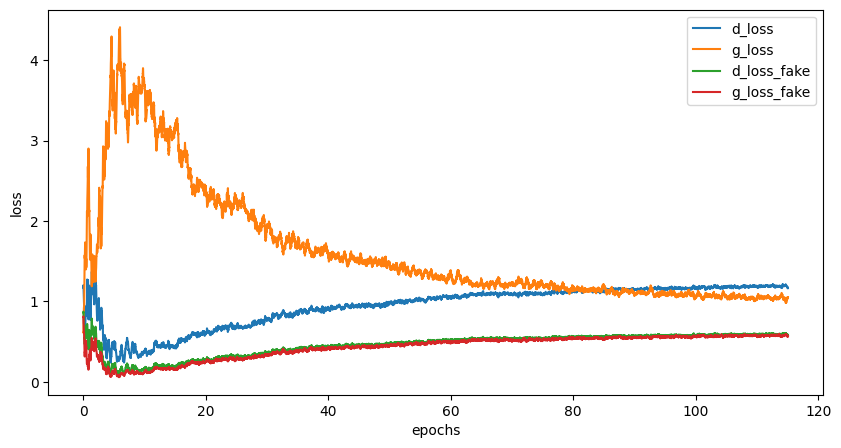

Epoch [116/500], Step[100/469], d_loss: 1.1976, d_loss_fake: 0.5574, g_loss: 1.1044, g_loss_fake: 0.5224, D(x): 0.57, D(G(z)): 0.39
Epoch [116/500], Step[200/469], d_loss: 1.2599, d_loss_fake: 0.7227, g_loss: 0.8981, g_loss_fake: 0.6470, D(x): 0.63, D(G(z)): 0.47
Epoch [116/500], Step[300/469], d_loss: 1.2417, d_loss_fake: 0.6040, g_loss: 0.9268, g_loss_fake: 0.6185, D(x): 0.57, D(G(z)): 0.43
Epoch [116/500], Step[400/469], d_loss: 1.2509, d_loss_fake: 0.4709, g_loss: 1.1564, g_loss_fake: 0.4638, D(x): 0.50, D(G(z)): 0.36


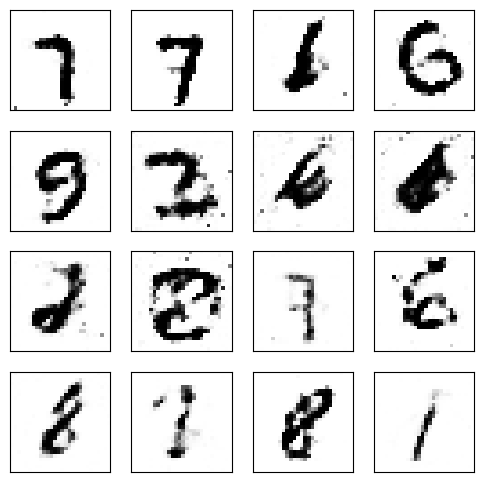

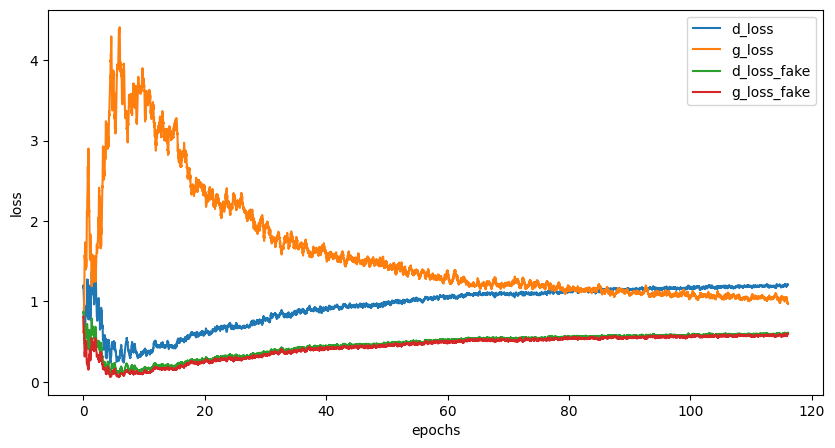

Epoch [117/500], Step[100/469], d_loss: 1.1364, d_loss_fake: 0.5151, g_loss: 1.1765, g_loss_fake: 0.4938, D(x): 0.58, D(G(z)): 0.37
Epoch [117/500], Step[200/469], d_loss: 1.2867, d_loss_fake: 0.6886, g_loss: 0.9341, g_loss_fake: 0.6559, D(x): 0.60, D(G(z)): 0.46
Epoch [117/500], Step[300/469], d_loss: 1.2665, d_loss_fake: 0.5965, g_loss: 1.0212, g_loss_fake: 0.5524, D(x): 0.54, D(G(z)): 0.41
Epoch [117/500], Step[400/469], d_loss: 1.2603, d_loss_fake: 0.6347, g_loss: 1.0232, g_loss_fake: 0.5649, D(x): 0.57, D(G(z)): 0.44


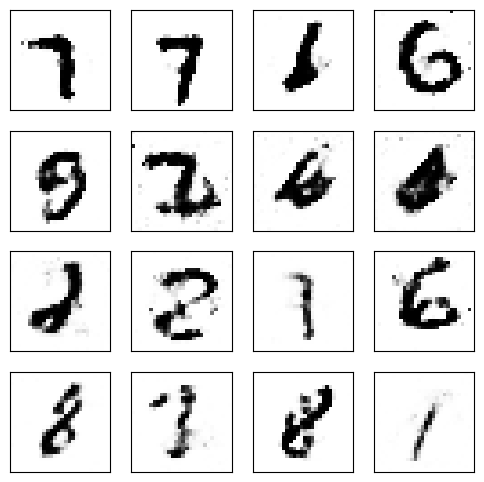

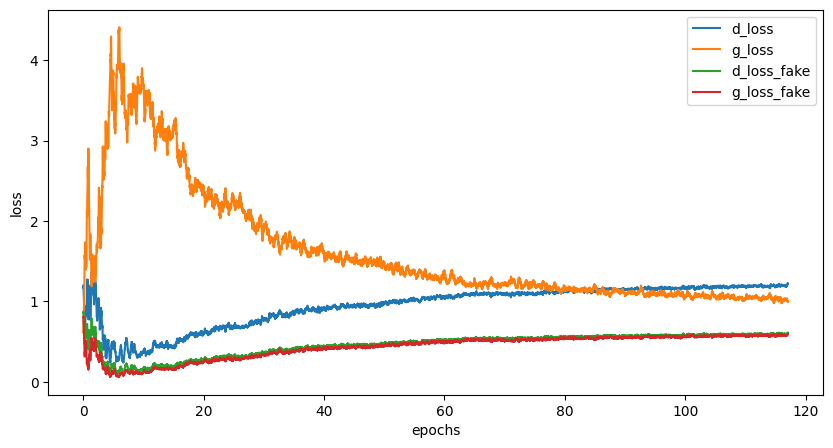

Epoch [118/500], Step[100/469], d_loss: 1.1158, d_loss_fake: 0.5330, g_loss: 1.0237, g_loss_fake: 0.5267, D(x): 0.58, D(G(z)): 0.39
Epoch [118/500], Step[200/469], d_loss: 1.1595, d_loss_fake: 0.5643, g_loss: 0.9598, g_loss_fake: 0.5632, D(x): 0.58, D(G(z)): 0.40
Epoch [118/500], Step[300/469], d_loss: 1.2151, d_loss_fake: 0.6262, g_loss: 0.8792, g_loss_fake: 0.6100, D(x): 0.59, D(G(z)): 0.44
Epoch [118/500], Step[400/469], d_loss: 1.1752, d_loss_fake: 0.6018, g_loss: 0.9402, g_loss_fake: 0.5969, D(x): 0.60, D(G(z)): 0.42


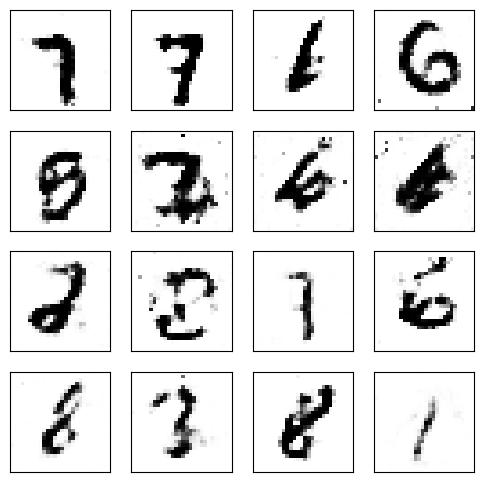

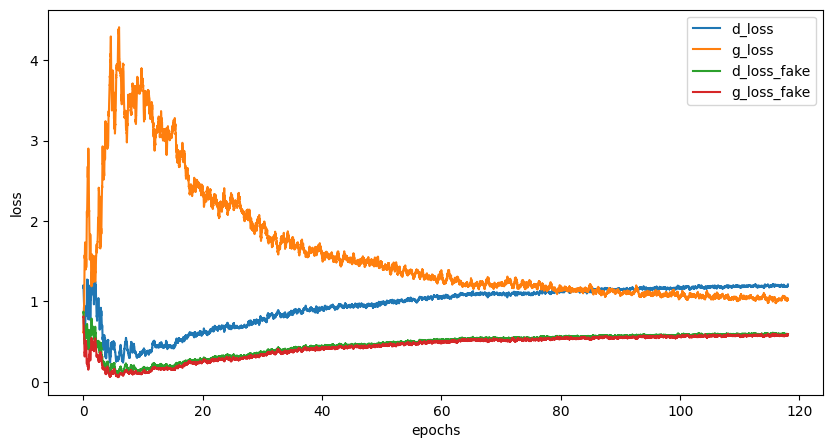

Epoch [119/500], Step[100/469], d_loss: 1.2466, d_loss_fake: 0.5733, g_loss: 1.1041, g_loss_fake: 0.5435, D(x): 0.56, D(G(z)): 0.40
Epoch [119/500], Step[200/469], d_loss: 1.1539, d_loss_fake: 0.5417, g_loss: 1.2809, g_loss_fake: 0.4994, D(x): 0.60, D(G(z)): 0.37
Epoch [119/500], Step[300/469], d_loss: 1.2952, d_loss_fake: 0.6971, g_loss: 0.8932, g_loss_fake: 0.6385, D(x): 0.58, D(G(z)): 0.47
Epoch [119/500], Step[400/469], d_loss: 1.2168, d_loss_fake: 0.6598, g_loss: 0.9629, g_loss_fake: 0.5898, D(x): 0.61, D(G(z)): 0.45


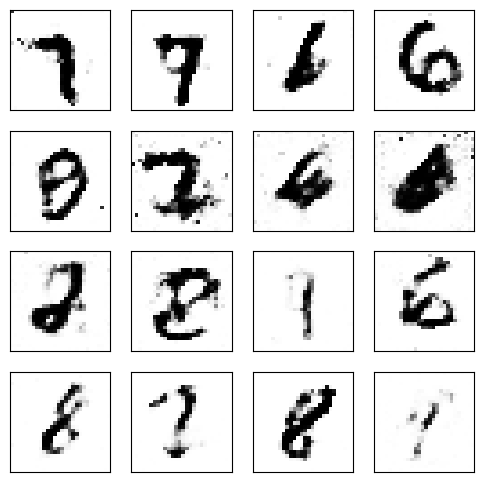

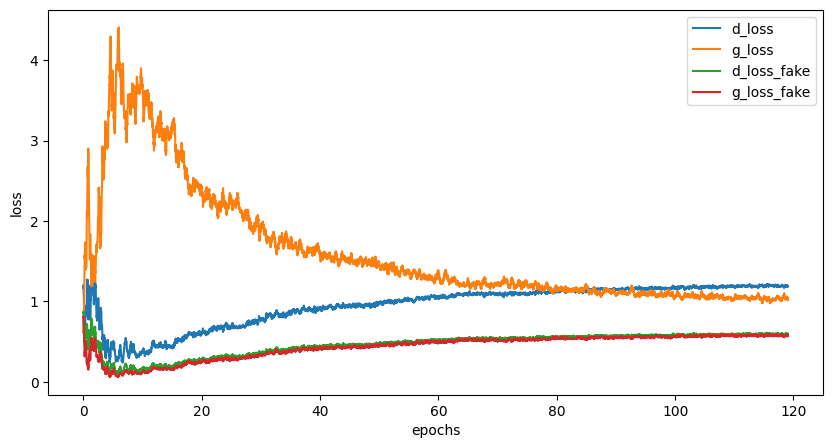

Epoch [120/500], Step[100/469], d_loss: 1.2047, d_loss_fake: 0.5652, g_loss: 0.9604, g_loss_fake: 0.6069, D(x): 0.56, D(G(z)): 0.40
Epoch [120/500], Step[200/469], d_loss: 1.2613, d_loss_fake: 0.6032, g_loss: 0.9496, g_loss_fake: 0.6805, D(x): 0.57, D(G(z)): 0.40
Epoch [120/500], Step[300/469], d_loss: 1.1109, d_loss_fake: 0.6164, g_loss: 0.9184, g_loss_fake: 0.5946, D(x): 0.64, D(G(z)): 0.44
Epoch [120/500], Step[400/469], d_loss: 1.2318, d_loss_fake: 0.6452, g_loss: 0.9754, g_loss_fake: 0.6213, D(x): 0.59, D(G(z)): 0.43


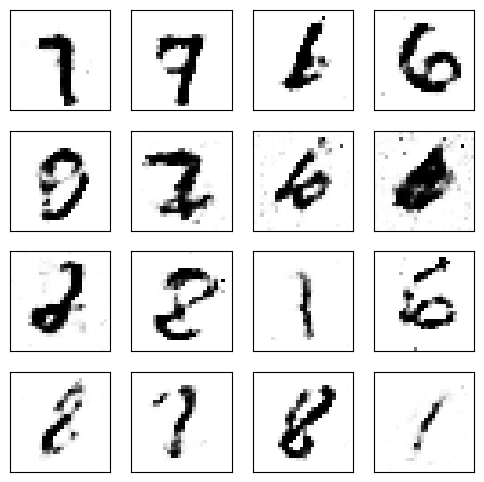

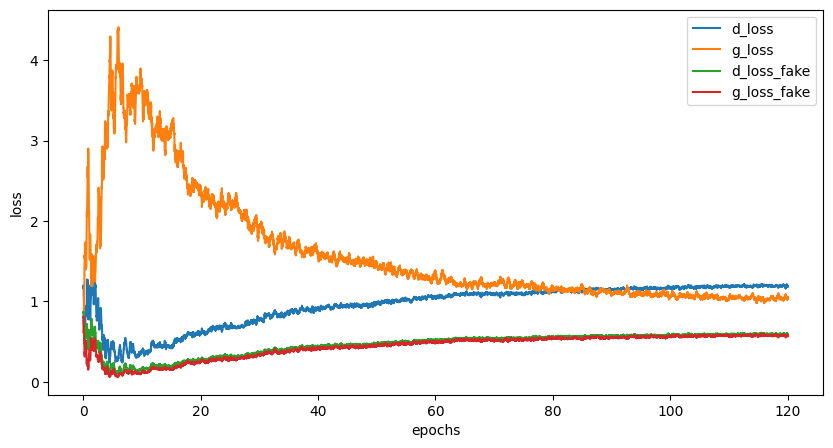

Epoch [121/500], Step[100/469], d_loss: 1.1330, d_loss_fake: 0.5415, g_loss: 1.0117, g_loss_fake: 0.5884, D(x): 0.58, D(G(z)): 0.39
Epoch [121/500], Step[200/469], d_loss: 1.1113, d_loss_fake: 0.5619, g_loss: 0.9139, g_loss_fake: 0.6598, D(x): 0.61, D(G(z)): 0.40
Epoch [121/500], Step[300/469], d_loss: 1.2538, d_loss_fake: 0.6911, g_loss: 1.1464, g_loss_fake: 0.5148, D(x): 0.61, D(G(z)): 0.45
Epoch [121/500], Step[400/469], d_loss: 1.1262, d_loss_fake: 0.4834, g_loss: 1.2923, g_loss_fake: 0.4938, D(x): 0.57, D(G(z)): 0.35


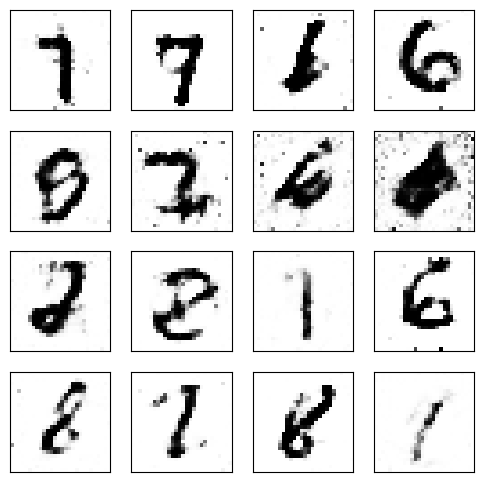

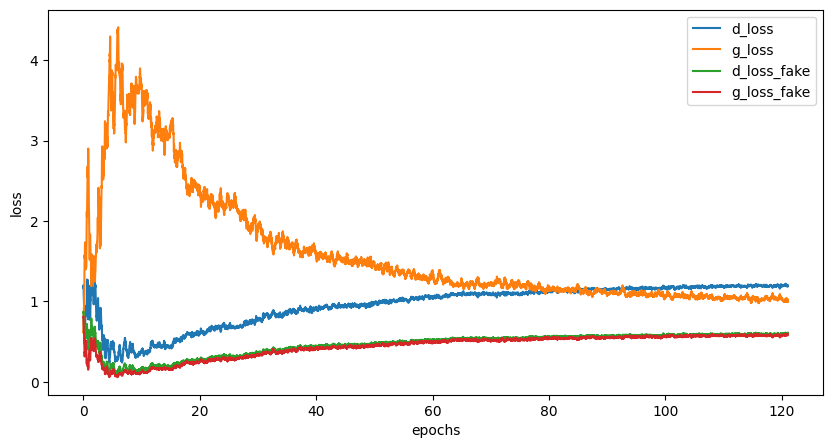

Epoch [122/500], Step[100/469], d_loss: 1.1236, d_loss_fake: 0.6232, g_loss: 1.0149, g_loss_fake: 0.6097, D(x): 0.64, D(G(z)): 0.42
Epoch [122/500], Step[200/469], d_loss: 1.2021, d_loss_fake: 0.5969, g_loss: 1.1079, g_loss_fake: 0.5453, D(x): 0.58, D(G(z)): 0.41
Epoch [122/500], Step[300/469], d_loss: 1.4005, d_loss_fake: 0.6493, g_loss: 0.8714, g_loss_fake: 0.6682, D(x): 0.52, D(G(z)): 0.44
Epoch [122/500], Step[400/469], d_loss: 1.2345, d_loss_fake: 0.6368, g_loss: 0.8954, g_loss_fake: 0.6620, D(x): 0.58, D(G(z)): 0.44


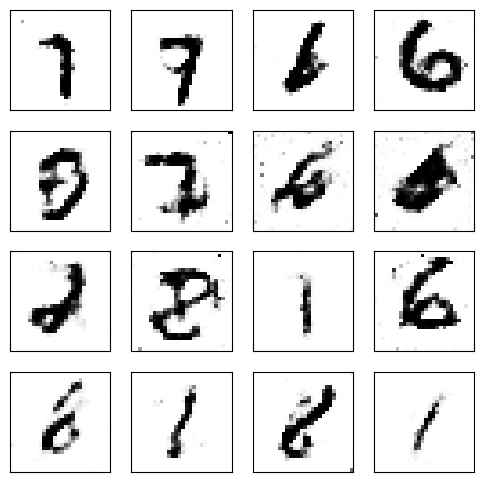

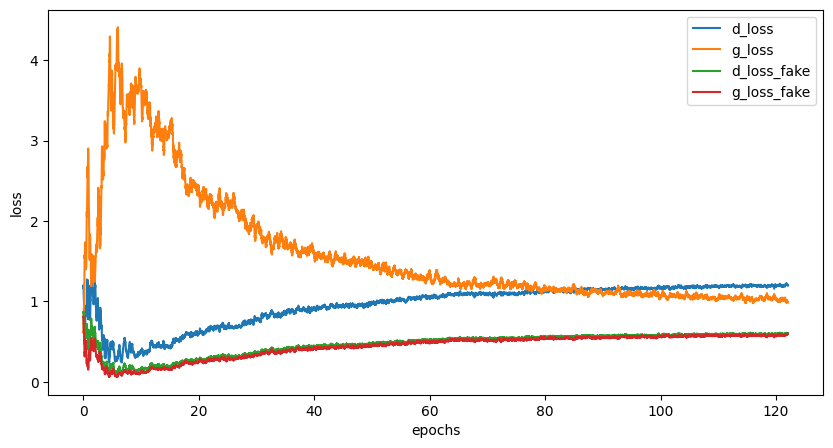

Epoch [123/500], Step[100/469], d_loss: 1.2361, d_loss_fake: 0.6753, g_loss: 0.9976, g_loss_fake: 0.6296, D(x): 0.62, D(G(z)): 0.43
Epoch [123/500], Step[200/469], d_loss: 1.2202, d_loss_fake: 0.6579, g_loss: 1.0868, g_loss_fake: 0.5959, D(x): 0.62, D(G(z)): 0.43
Epoch [123/500], Step[300/469], d_loss: 1.1090, d_loss_fake: 0.5464, g_loss: 1.0600, g_loss_fake: 0.5533, D(x): 0.61, D(G(z)): 0.39
Epoch [123/500], Step[400/469], d_loss: 1.2077, d_loss_fake: 0.6445, g_loss: 1.0504, g_loss_fake: 0.5682, D(x): 0.62, D(G(z)): 0.43


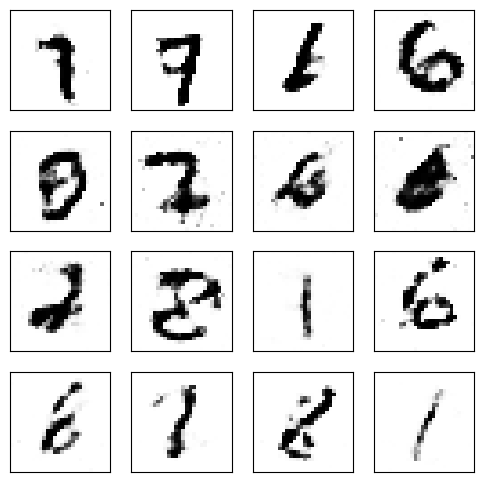

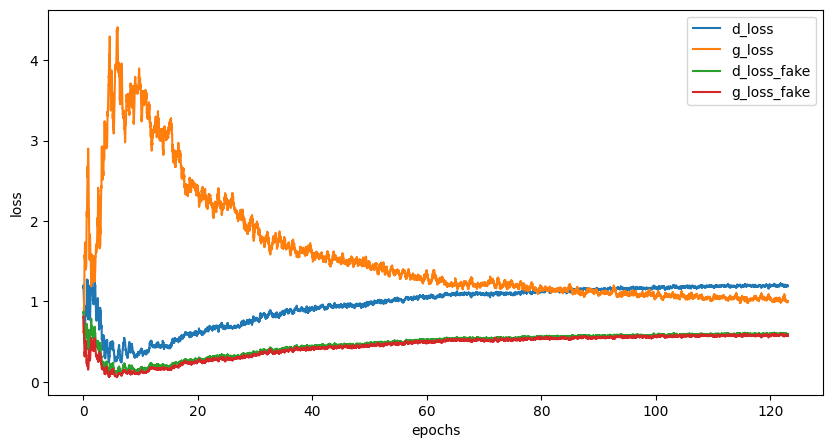

Epoch [124/500], Step[100/469], d_loss: 1.3230, d_loss_fake: 0.6993, g_loss: 0.9809, g_loss_fake: 0.5981, D(x): 0.58, D(G(z)): 0.47
Epoch [124/500], Step[200/469], d_loss: 1.3065, d_loss_fake: 0.6502, g_loss: 0.9113, g_loss_fake: 0.6445, D(x): 0.56, D(G(z)): 0.44
Epoch [124/500], Step[300/469], d_loss: 1.2288, d_loss_fake: 0.6526, g_loss: 0.9462, g_loss_fake: 0.6092, D(x): 0.61, D(G(z)): 0.45
Epoch [124/500], Step[400/469], d_loss: 1.3609, d_loss_fake: 0.6151, g_loss: 1.0307, g_loss_fake: 0.5887, D(x): 0.54, D(G(z)): 0.41


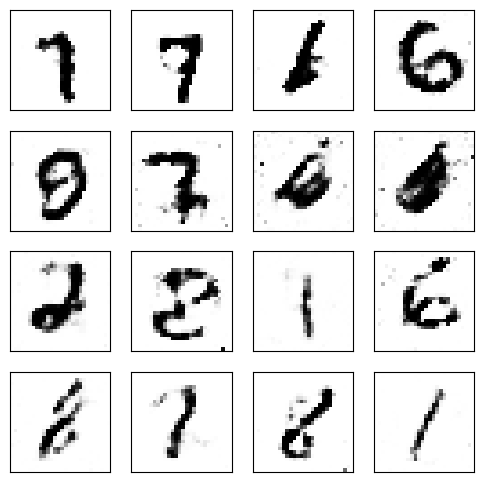

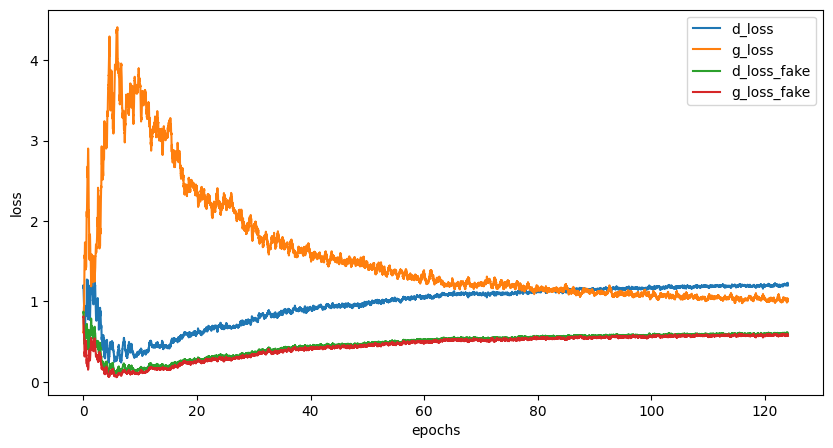

Epoch [125/500], Step[100/469], d_loss: 1.1109, d_loss_fake: 0.5346, g_loss: 1.0140, g_loss_fake: 0.5602, D(x): 0.59, D(G(z)): 0.39
Epoch [125/500], Step[200/469], d_loss: 1.1478, d_loss_fake: 0.4970, g_loss: 1.1212, g_loss_fake: 0.5027, D(x): 0.56, D(G(z)): 0.35
Epoch [125/500], Step[300/469], d_loss: 1.1648, d_loss_fake: 0.5154, g_loss: 1.1338, g_loss_fake: 0.5498, D(x): 0.57, D(G(z)): 0.36
Epoch [125/500], Step[400/469], d_loss: 1.1666, d_loss_fake: 0.6069, g_loss: 0.8792, g_loss_fake: 0.6799, D(x): 0.61, D(G(z)): 0.42


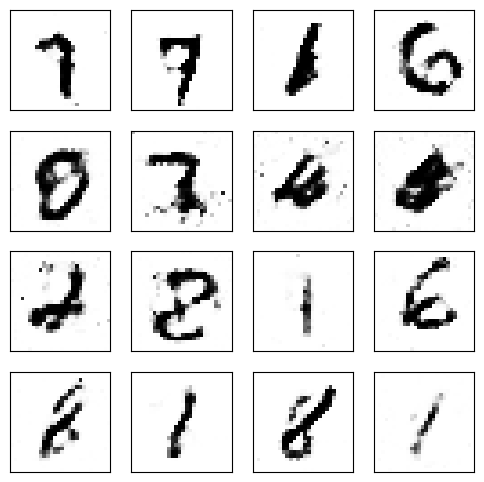

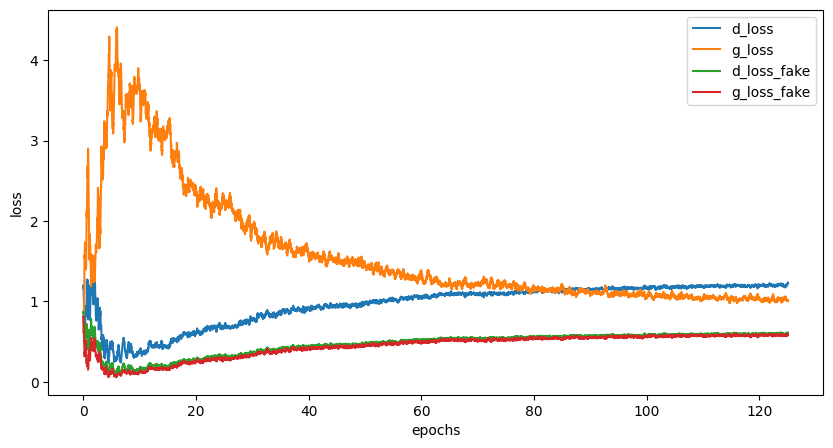

Epoch [126/500], Step[100/469], d_loss: 1.2455, d_loss_fake: 0.6436, g_loss: 0.9285, g_loss_fake: 0.6263, D(x): 0.58, D(G(z)): 0.43
Epoch [126/500], Step[200/469], d_loss: 1.1261, d_loss_fake: 0.4666, g_loss: 1.1581, g_loss_fake: 0.4989, D(x): 0.55, D(G(z)): 0.34
Epoch [126/500], Step[300/469], d_loss: 1.1180, d_loss_fake: 0.5012, g_loss: 0.9643, g_loss_fake: 0.6103, D(x): 0.59, D(G(z)): 0.36
Epoch [126/500], Step[400/469], d_loss: 1.1642, d_loss_fake: 0.5542, g_loss: 1.1496, g_loss_fake: 0.5241, D(x): 0.59, D(G(z)): 0.38


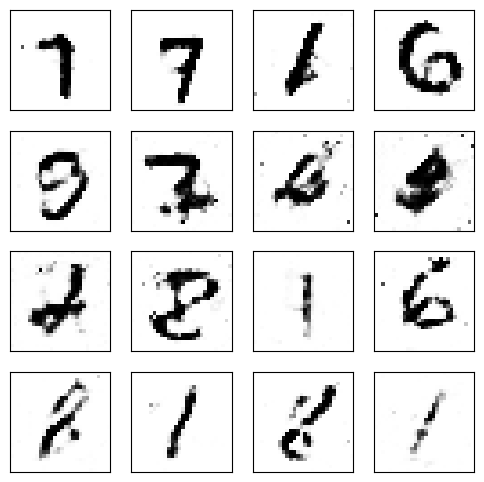

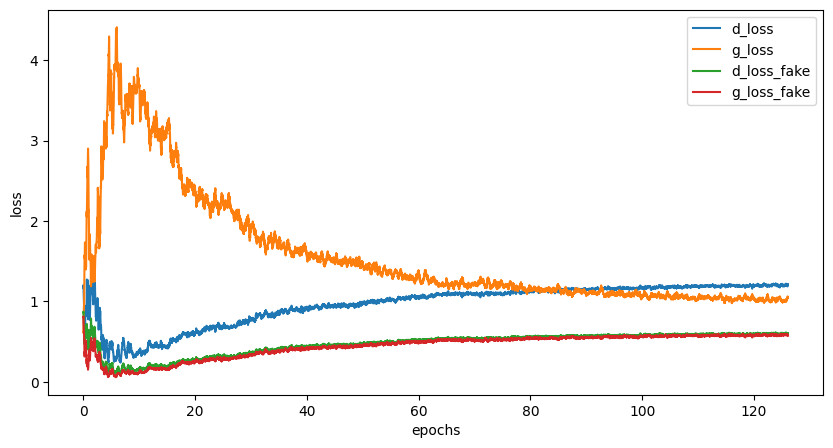

Epoch [127/500], Step[100/469], d_loss: 1.2419, d_loss_fake: 0.6717, g_loss: 0.9644, g_loss_fake: 0.5651, D(x): 0.60, D(G(z)): 0.45
Epoch [127/500], Step[200/469], d_loss: 1.1598, d_loss_fake: 0.5433, g_loss: 1.1003, g_loss_fake: 0.5133, D(x): 0.57, D(G(z)): 0.39
Epoch [127/500], Step[300/469], d_loss: 1.2017, d_loss_fake: 0.6945, g_loss: 0.8221, g_loss_fake: 0.7736, D(x): 0.64, D(G(z)): 0.46
Epoch [127/500], Step[400/469], d_loss: 1.2565, d_loss_fake: 0.6045, g_loss: 0.9672, g_loss_fake: 0.5993, D(x): 0.56, D(G(z)): 0.42


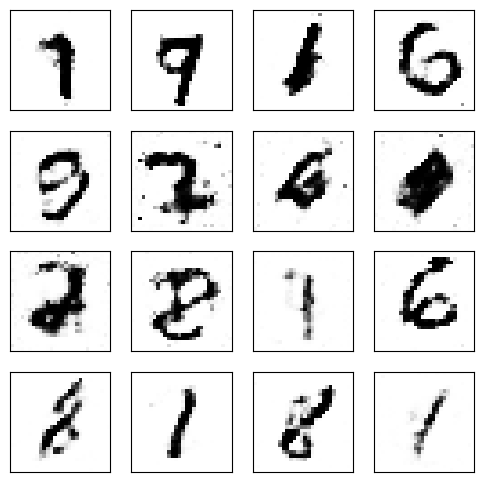

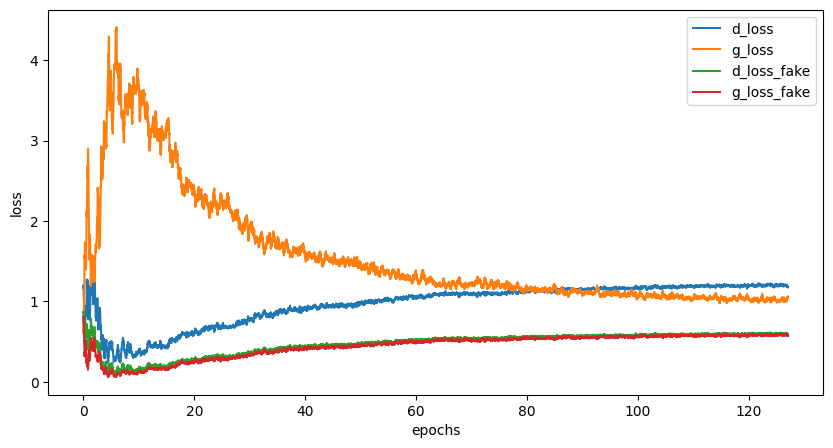

Epoch [128/500], Step[100/469], d_loss: 1.1245, d_loss_fake: 0.5312, g_loss: 1.0230, g_loss_fake: 0.5890, D(x): 0.60, D(G(z)): 0.37
Epoch [128/500], Step[200/469], d_loss: 1.1606, d_loss_fake: 0.6196, g_loss: 1.0643, g_loss_fake: 0.5569, D(x): 0.61, D(G(z)): 0.42
Epoch [128/500], Step[300/469], d_loss: 1.2719, d_loss_fake: 0.6752, g_loss: 0.8778, g_loss_fake: 0.6766, D(x): 0.59, D(G(z)): 0.45
Epoch [128/500], Step[400/469], d_loss: 1.2678, d_loss_fake: 0.6385, g_loss: 0.8558, g_loss_fake: 0.6301, D(x): 0.56, D(G(z)): 0.45


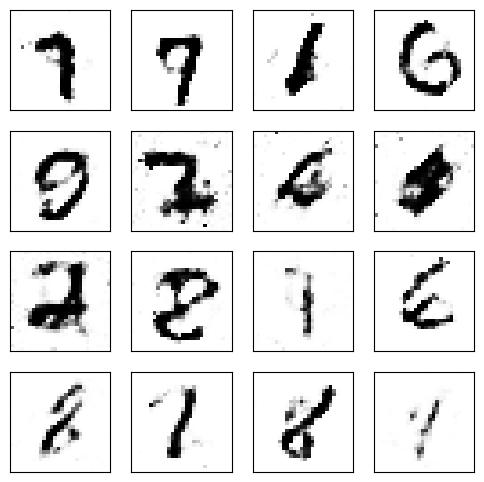

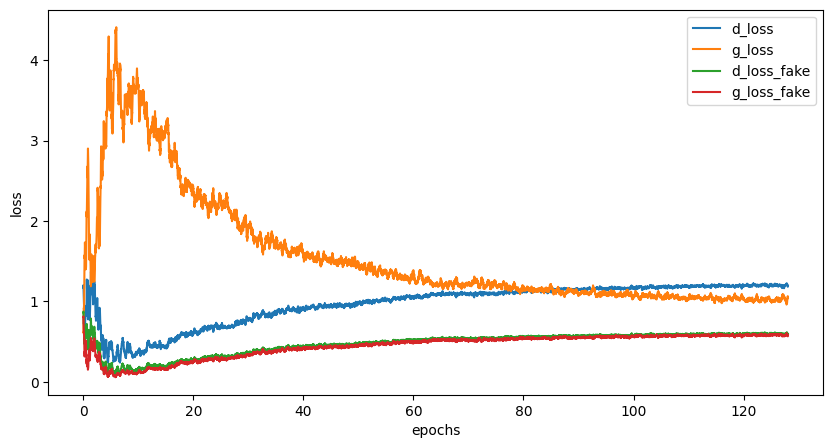

Epoch [129/500], Step[100/469], d_loss: 1.1716, d_loss_fake: 0.5613, g_loss: 0.9979, g_loss_fake: 0.6314, D(x): 0.59, D(G(z)): 0.39
Epoch [129/500], Step[200/469], d_loss: 1.3098, d_loss_fake: 0.5661, g_loss: 1.1414, g_loss_fake: 0.5243, D(x): 0.53, D(G(z)): 0.38


In [31]:
# set number of epochs and initialize figure counter
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = False

discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)

# e. Ablation Study

In [ ]:
##################
### Problem 2: Ablation study 1, 2, and 3
##################


In [ ]:
#exp.1
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = False
channels = [2 * i for i in [128, 256, 512]]
discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(100 , channels, with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)

In [ ]:
#exp.2
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = False
channels = [1024, 512, 256, 128, 64]
discriminator = Discriminator(channels, with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)

In [ ]:
#exp.3
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 10

with_condition = False
discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)

# **2. Conditional GAN**

In [ ]:
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = True

discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)